### Dataset

##### This dataset contains about 10 years of daily weather observations from many locations across Australia. RainTomorrow is the target variable to predict. It means -- did it rain the next day, Yes or No? This column is Yes if the rain for that day was more than 1mm.

### Exploring the dataset

In [1]:
# importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import scipy.stats as stats

In [2]:
df = pd.read_csv("weatherAUS.csv")
pd.set_option("display.max_columns", None)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.shape

(145460, 23)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [5]:
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_feature=[feature for feature in numerical_feature if len(df[feature].unique())<70]
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
categorical_feature = [feature for feature in df.columns if feature not in numerical_feature]
print("Numerical Features Count {}".format(len(numerical_feature)))
print("Discrete feature Count {}".format(len(discrete_feature)))
print("Continuous feature Count {}".format(len(continuous_feature)))
print("Categorical feature Count {}".format(len(categorical_feature)))

Numerical Features Count 16
Discrete feature Count 5
Continuous feature Count 11
Categorical feature Count 7


### Exploring Locations 

In [6]:
len(df['Location'].unique())

49

In [7]:
df['Location'].unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

### Cleaning and Filtering Locations

In [8]:
filtered_locations = ['Brisbane', 'Melbourne', 'Sydney', 'GoldCoast', 'Adelaide', 'Hobart',
                     'Canberra', 'AliceSprings', 'Newcastle', 'Launceston', 'Wollongong',
                     'Ballarat', 'Bendigo', 'CoffsHarbour', 'Dartmoor', 'PearceRAAF']


df = df[df['Location'].isin(filtered_locations)]

In [9]:
df.loc[df['Location'] == 'PearceRAAF', 'Location'] = 'Pearce'
sorted(df['Location'].unique())

['Adelaide',
 'AliceSprings',
 'Ballarat',
 'Bendigo',
 'Brisbane',
 'Canberra',
 'CoffsHarbour',
 'Dartmoor',
 'GoldCoast',
 'Hobart',
 'Launceston',
 'Melbourne',
 'Newcastle',
 'Pearce',
 'Sydney',
 'Wollongong']

### Splitting the dataset location wise

In [10]:
locations = df['Location'].unique()
dfs = {}                                         # Dictionary to store the individual dataframes

for location in locations:
    location_df = df[df['Location'] == location].copy()
    words = location.split()
    df_name = ''.join(words)
    df_name += "_df"
    dfs[df_name] = location_df
    
    
for location, location_df in dfs.items():
    globals()[location] = location_df

#### Identifying columns with high % of missing values

In [11]:
city_dfs = ['Adelaide_df', 'AliceSprings_df', 'Ballarat_df', 'Bendigo_df', 'Brisbane_df', 'Canberra_df', 'CoffsHarbour_df',
              'Dartmoor_df', 'GoldCoast_df', 'Hobart_df', 'Launceston_df', 'Melbourne_df', 'Newcastle_df',
              'Pearce_df', 'Sydney_df', 'Wollongong_df']

variables = df.columns

null_dict = {}

for city in city_dfs:
    df_city = globals()[city]
    null_ = (df_city[variables].isnull().mean() * 100).round(2)
    null_dict[city] = null_

null_table = pd.DataFrame(null_dict)
print(null_table.T)

                 Date  Location  MinTemp  MaxTemp  Rainfall  Evaporation  \
Adelaide_df       0.0       0.0     0.06     0.09      3.19        46.63   
AliceSprings_df   0.0       0.0     0.03     0.07      0.26         7.07   
Ballarat_df       0.0       0.0     0.03     0.03      0.39       100.00   
Bendigo_df        0.0       0.0     0.07     0.16      0.20        61.02   
Brisbane_df       0.0       0.0     0.28     0.44      1.00         0.60   
Canberra_df       0.0       0.0     0.17     0.09      0.52        46.68   
CoffsHarbour_df   0.0       0.0     0.50     0.63      1.86        40.68   
Dartmoor_df       0.0       0.0     2.29     2.09      2.23        13.59   
GoldCoast_df      0.0       0.0     0.10     0.23      1.97       100.00   
Hobart_df         0.0       0.0     0.00     0.03      0.16         0.22   
Launceston_df     0.0       0.0     0.20     0.20      0.39        95.36   
Melbourne_df      0.0       0.0    15.03    15.06     23.74         0.09   
Newcastle_df

In [12]:
city_dfs.remove('Melbourne_df')
city_dfs.remove('Newcastle_df')

sorted(city_dfs)

['Adelaide_df',
 'AliceSprings_df',
 'Ballarat_df',
 'Bendigo_df',
 'Brisbane_df',
 'Canberra_df',
 'CoffsHarbour_df',
 'Dartmoor_df',
 'GoldCoast_df',
 'Hobart_df',
 'Launceston_df',
 'Pearce_df',
 'Sydney_df',
 'Wollongong_df']

In [13]:
drop_columns = ['Sunshine', 'Evaporation', 'Cloud3pm', 'Cloud9am']

for city in city_dfs:
    df = globals()[city]
    df.drop(columns=drop_columns, inplace=True)

In [14]:
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_feature=[feature for feature in numerical_feature if len(df[feature].unique())<50]
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
categorical_feature = [feature for feature in df.columns if feature not in numerical_feature]
print("Numerical Features Count {}".format(len(numerical_feature)))
print("Discrete feature Count {}".format(len(discrete_feature)))
print("Continuous feature Count {}".format(len(continuous_feature)))
print("Categorical feature Count {}".format(len(categorical_feature)))

Numerical Features Count 12
Discrete feature Count 2
Continuous feature Count 10
Categorical feature Count 7


### Data Cleaning

#### 1. Adelaide

In [15]:
Adelaide_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
96320,2008-07-01,Adelaide,8.8,15.7,5.0,NW,48.0,SW,W,13.0,15.0,92.0,67.0,1017.4,1017.7,13.5,14.9,Yes,No
96321,2008-07-02,Adelaide,12.7,15.8,0.8,SW,35.0,SSW,SW,13.0,15.0,75.0,52.0,1022.4,1022.6,13.7,15.5,No,No
96322,2008-07-03,Adelaide,6.2,15.1,0.0,W,20.0,NNE,SW,2.0,11.0,81.0,56.0,1027.8,1026.5,9.3,13.9,No,No
96323,2008-07-04,Adelaide,5.3,15.9,0.0,NNE,30.0,NNE,NE,6.0,13.0,71.0,46.0,1028.7,1025.6,10.2,15.3,No,No
96324,2008-07-05,Adelaide,9.8,15.4,0.0,N,30.0,NNE,NE,9.0,9.0,56.0,67.0,1023.6,1020.2,11.3,13.8,No,NaN


In [16]:
Adelaide_df.isnull().sum()*100/len(Adelaide_df)

Date             0.000000
Location         0.000000
MinTemp          0.062637
MaxTemp          0.093956
Rainfall         3.194488
WindGustDir      0.814281
WindGustSpeed    0.814281
WindDir9am       8.581272
WindDir3pm       0.501096
WindSpeed9am     0.156593
WindSpeed3pm     0.156593
Humidity9am      0.156593
Humidity3pm      0.156593
Pressure9am      0.250548
Pressure3pm      0.219230
Temp9am          0.156593
Temp3pm          0.125274
RainToday        3.194488
RainTomorrow     3.225806
dtype: float64

#### Continuous features

C:\Users\Varsha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Varsha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Varsha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

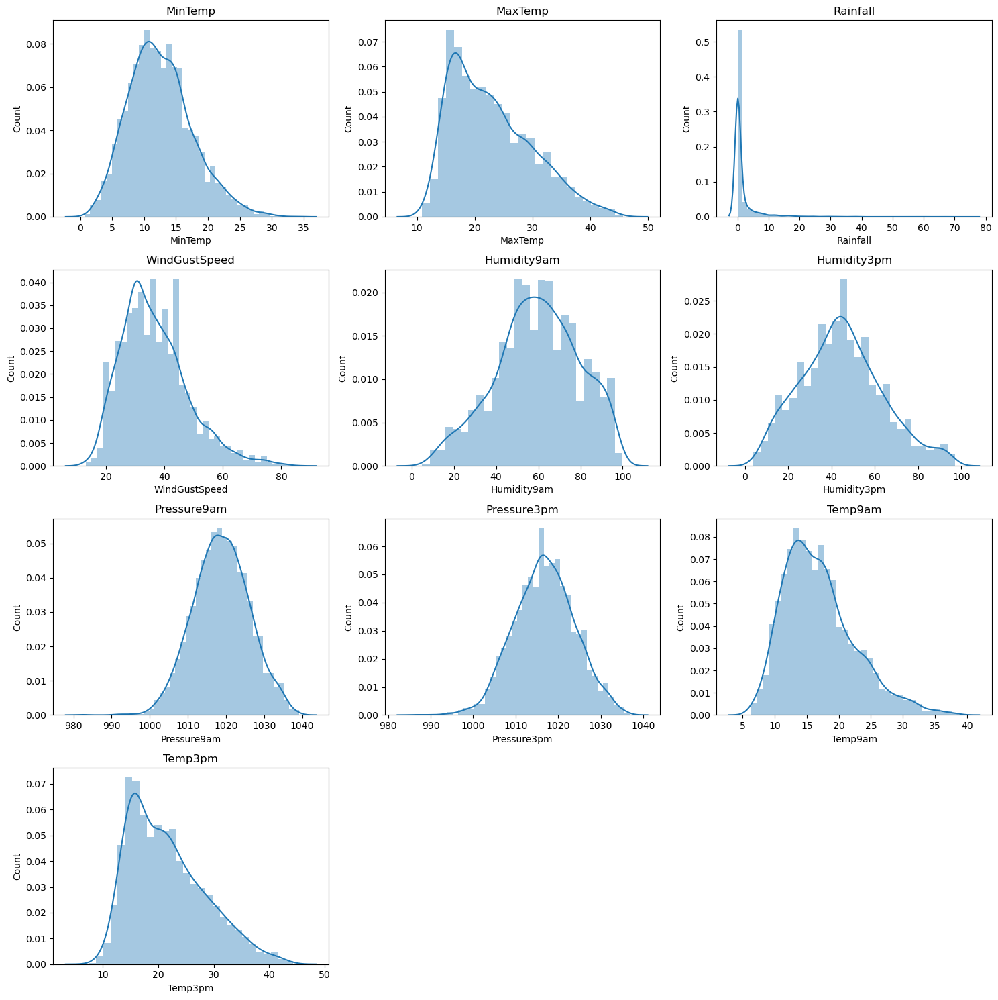

In [17]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Adelaide_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [18]:
for var in continuous_feature:
            if Adelaide_df[var].isnull().sum()*100/len(df) > 0:
                   Adelaide_df[var].fillna(df[var].median(), inplace=True)

#### Discrete features

In [19]:
for var in discrete_feature:
    Adelaide_df[var].fillna(Adelaide_df[var].mode().iloc[0], inplace=True)

#### Categorical features

In [20]:
for var in categorical_feature:
    Adelaide_df[var].fillna(Adelaide_df[var].mode().iloc[0], inplace=True)

In [21]:
Adelaide_df.isnull().sum()*100/len(Adelaide_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [22]:
Adelaide_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3193.0,12.581021,4.985402,0.7,9.1,12.1,15.5,33.9
MaxTemp,3193.0,22.897432,7.019938,10.8,17.1,21.7,27.6,45.7
Rainfall,3193.0,1.516317,4.519225,0.0,0.0,0.0,0.6,75.2
WindGustSpeed,3193.0,36.552145,11.378369,13.0,28.0,35.0,43.0,85.0
WindSpeed9am,3193.0,9.948638,6.067591,0.0,6.0,9.0,13.0,39.0
WindSpeed3pm,3193.0,15.467585,5.679871,0.0,11.0,15.0,19.0,43.0
Humidity9am,3193.0,59.717194,19.701911,5.0,47.0,60.0,74.0,100.0
Humidity3pm,3193.0,44.865957,18.917085,4.0,32.0,44.0,57.0,97.0
Pressure9am,3193.0,1018.763169,7.310828,982.3,1013.8,1018.7,1023.7,1039.2
Pressure3pm,3193.0,1016.802380,7.081436,986.4,1012.0,1016.8,1021.5,1036.8


### Outlier Handling

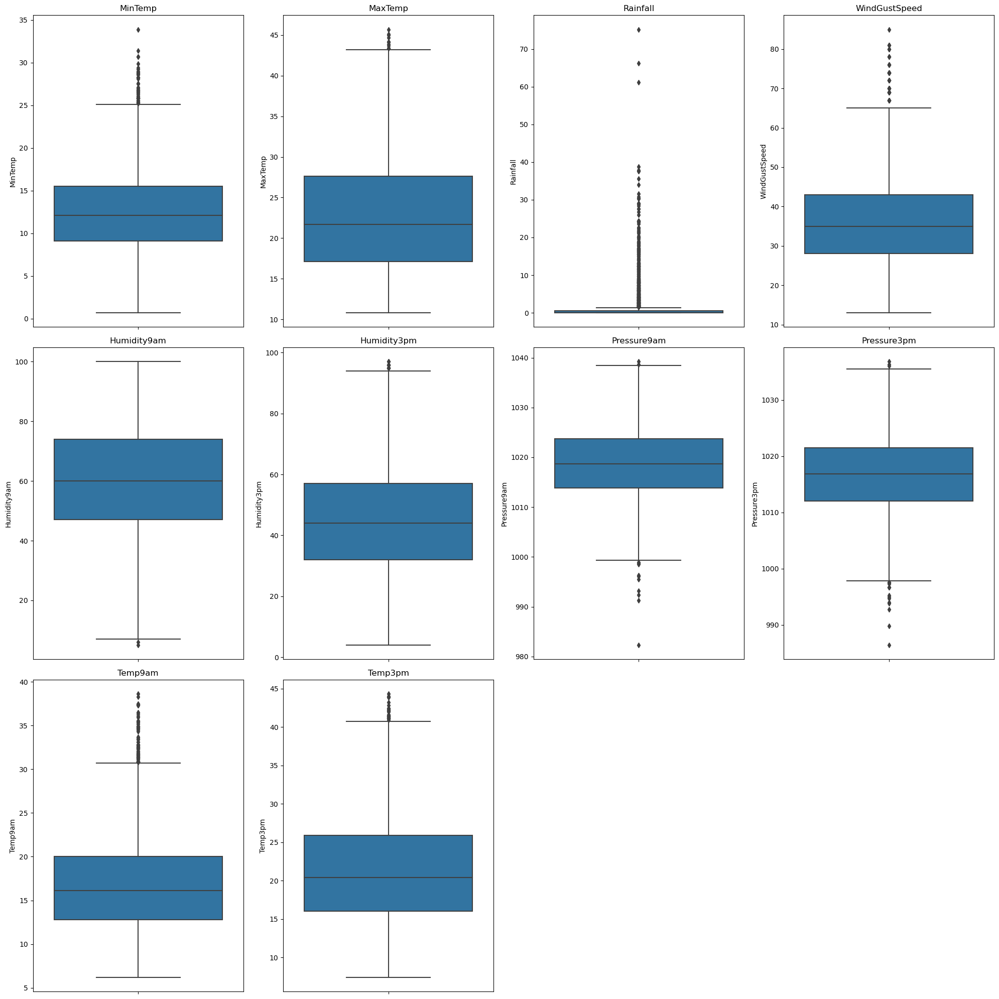

In [23]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Adelaide_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [24]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Adelaide_df[variable].quantile(0.75) - Adelaide_df[variable].quantile(0.25)
    lower_bridge = Adelaide_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Adelaide_df[variable].quantile(0.75) + (IQR * 1.5)

    Adelaide_df = Adelaide_df[(Adelaide_df[variable] >= lower_bridge) & (Adelaide_df[variable] <= upper_bridge)]

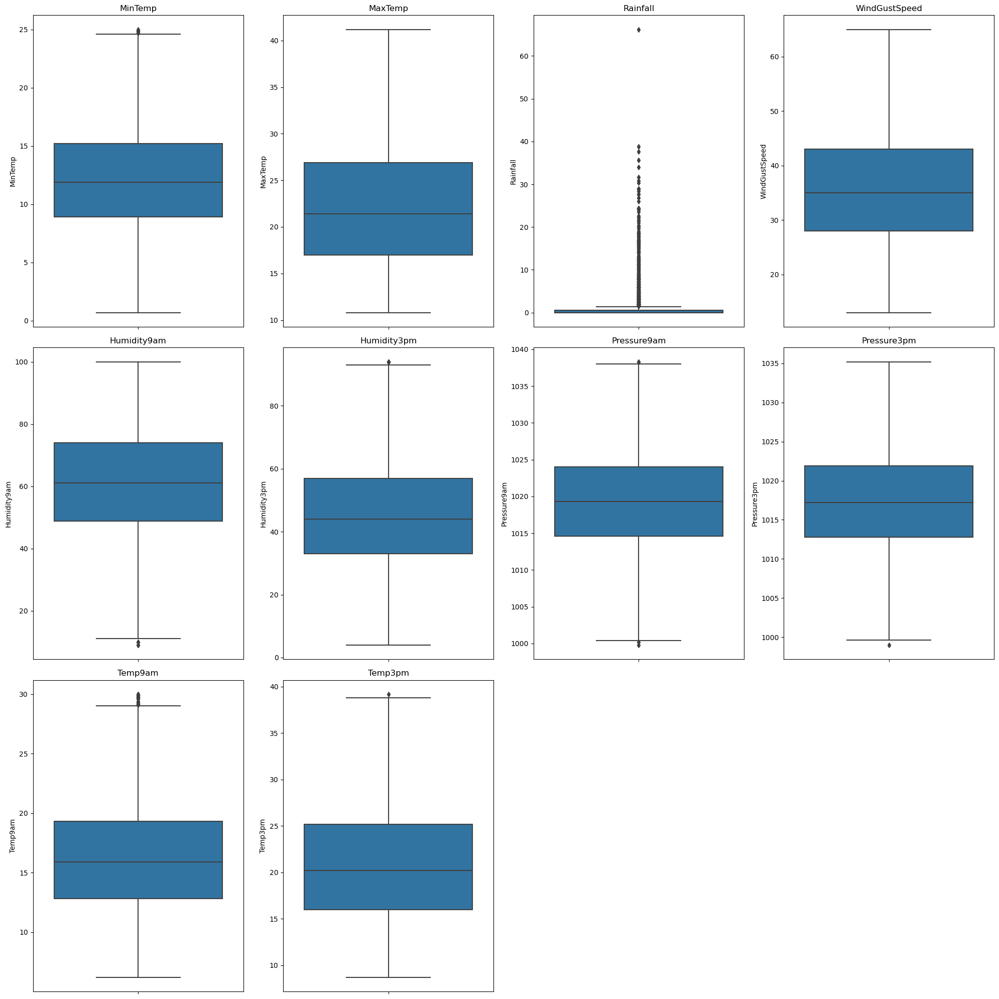

In [25]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Adelaide_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

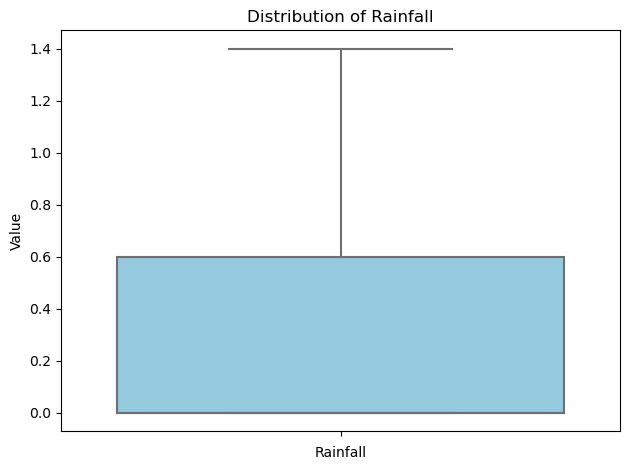

In [26]:
sns.boxplot(data=Adelaide_df, y='Rainfall', showfliers=False, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

In [27]:
pct_5 = np.percentile(Adelaide_df['Rainfall'], 5)
pct_95 = np.percentile(Adelaide_df['Rainfall'], 95)

In [28]:
print(pct_5, pct_95)

0.0 8.6


In [29]:
Adelaide_df['Rainfall'] = np.where(Adelaide_df['Rainfall'] > pct_95, pct_95,np.where(Adelaide_df['Rainfall'] < pct_5, pct_5, Adelaide_df['Rainfall']))

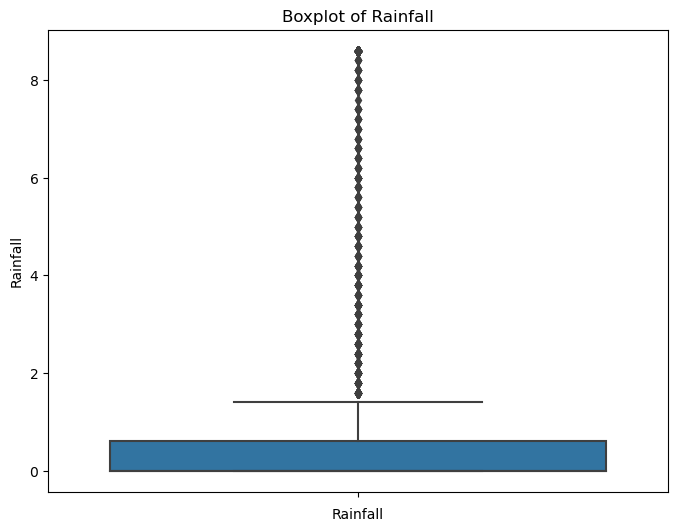

In [30]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=Adelaide_df, y='Rainfall')
plt.title('Boxplot of Rainfall')
plt.xlabel('Rainfall')
plt.show()

### Feature Engineering

In [31]:
Adelaide_df["RainToday"] = pd.get_dummies(Adelaide_df["RainToday"], drop_first = True)
Adelaide_df["RainTomorrow"] = pd.get_dummies(Adelaide_df["RainTomorrow"], drop_first = True)

In [32]:
for feature in categorical_feature:
    print(feature, (Adelaide_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-08-06', '2012-04-25', '2014-06-13', '2012-05-24', '2010-03-18',
       '2012-05-23', '2012-05-20', '2014-06-16', '2014-06-20', '2010-03-28',
       ...
       '2011-10-30', '2011-11-08', '2011-10-31', '2011-11-01', '2011-11-02',
       '2011-11-03', '2011-11-04', '2011-11-05', '2011-11-06', '2017-06-25'],
      dtype='object', name='Date', length=2996)
Location Index(['Adelaide'], dtype='object', name='Location')
WindGustDir Index(['WNW', 'NW', 'NNE', 'NNW', 'W', 'NE', 'N', 'ENE', 'SSW', 'SW', 'WSW',
       'E', 'SSE', 'ESE', 'S', 'SE'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['WNW', 'NW', 'W', 'N', 'WSW', 'SW', 'NNW', 'NE', 'NNE', 'ENE', 'E',
       'SSW', 'SSE', 'S', 'ESE', 'SE'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['NE', 'NNE', 'WNW', 'N', 'ENE', 'NNW', 'NW', 'SSW', 'W', 'WSW', 'SW',
       'S', 'SSE', 'E', 'ESE', 'SE'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday'

In [33]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Adelaide_df["WindGustDir"] = Adelaide_df["WindGustDir"].map(windgustdir)
Adelaide_df["WindDir9am"] = Adelaide_df["WindDir9am"].map(winddir9am)
Adelaide_df["WindDir3pm"] = Adelaide_df["WindDir3pm"].map(winddir3pm)

In [34]:
Adelaide_df["Date"] = pd.to_datetime(Adelaide_df["Date"], format = "%Y-%m-%dT", errors = "coerce")

In [35]:
Adelaide_df["Date_month"] = Adelaide_df["Date"].dt.month
Adelaide_df["Date_day"] = Adelaide_df["Date"].dt.day

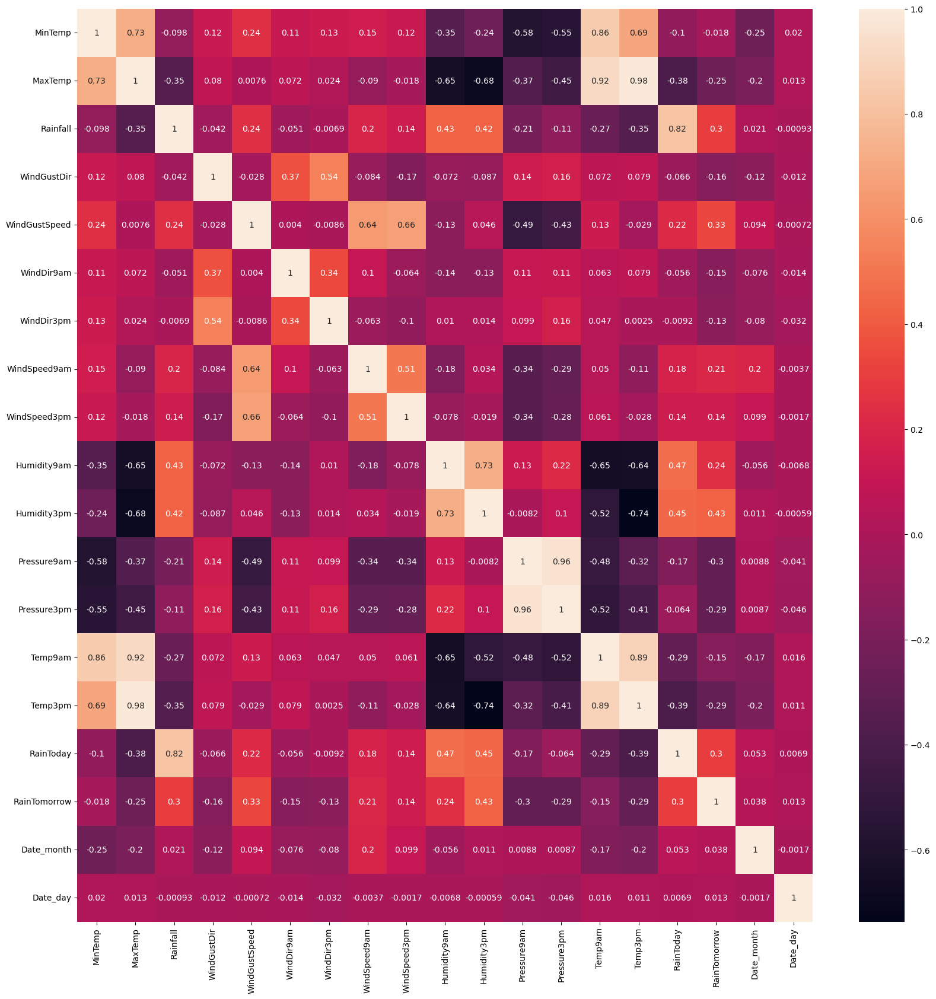

In [36]:
corrmat = Adelaide_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

In [37]:
Adelaide_df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir',
       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow',
       'Date_month', 'Date_day'],
      dtype='object')

### Feature Scaling

In [38]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'Date_month', 'Date_day']
scaler = StandardScaler()
Adelaide_df[columns_to_scale] = scaler.fit_transform(Adelaide_df[columns_to_scale])

### Model Building 

In [39]:
X = Adelaide_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Adelaide_df['RainTomorrow']

In [40]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [41]:
y_train

98817    1
98700    1
97459    0
99462    0
96553    0
        ..
97530    0
98512    0
98688    0
96425    0
98013    0
Name: RainTomorrow, Length: 2396, dtype: uint8

In [42]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Varsha\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [43]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[451  26]
 [ 62  61]]
0.8533333333333334
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       477
           1       0.70      0.50      0.58       123

    accuracy                           0.85       600
   macro avg       0.79      0.72      0.75       600
weighted avg       0.84      0.85      0.84       600



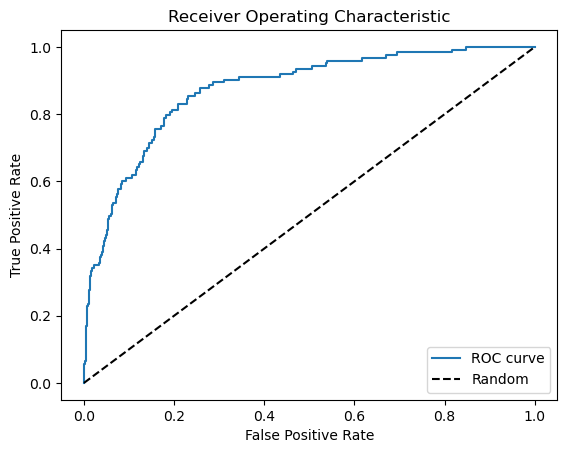

ROC AUC: 0.8738729525660036


In [44]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [45]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [46]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[451  26]
 [ 60  63]]
0.8566666666666667
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       477
           1       0.71      0.51      0.59       123

    accuracy                           0.86       600
   macro avg       0.80      0.73      0.75       600
weighted avg       0.85      0.86      0.85       600



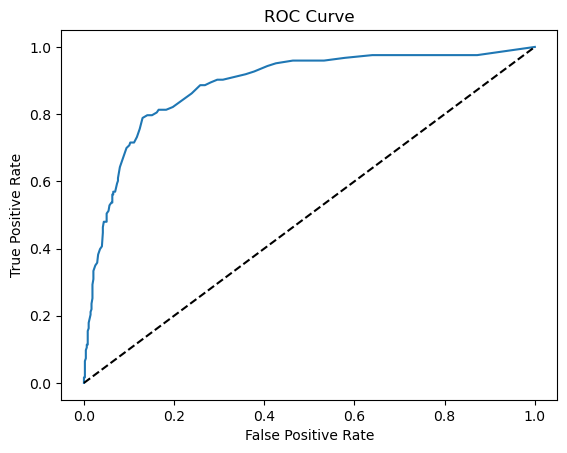

ROC AUC: 0.8862470385710146


In [47]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)


In [48]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [49]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[416  61]
 [ 49  74]]
0.8166666666666667
              precision    recall  f1-score   support

           0       0.89      0.87      0.88       477
           1       0.55      0.60      0.57       123

    accuracy                           0.82       600
   macro avg       0.72      0.74      0.73       600
weighted avg       0.82      0.82      0.82       600



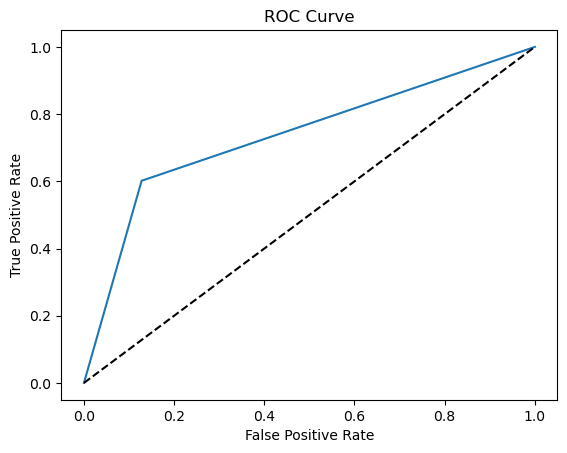

ROC AUC: 0.7368717083397249


In [50]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [51]:
from sklearn.svm import SVC

In [52]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [53]:
y_pred = svm.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[453  24]
 [ 68  55]]
0.8466666666666667
              precision    recall  f1-score   support

           0       0.87      0.95      0.91       477
           1       0.70      0.45      0.54       123

    accuracy                           0.85       600
   macro avg       0.78      0.70      0.73       600
weighted avg       0.83      0.85      0.83       600



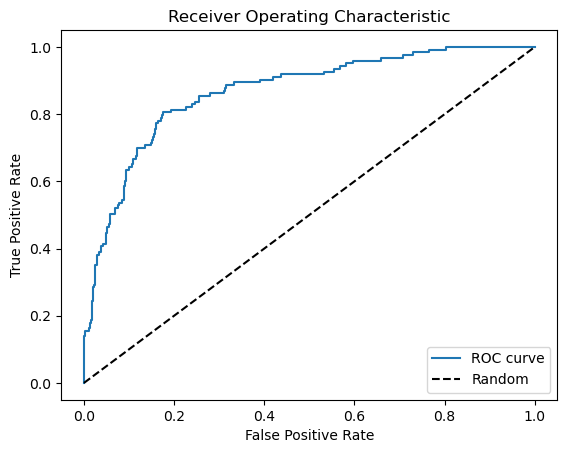

ROC AUC: 0.866850743979138


In [54]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [66]:
from sklearn.ensemble import GradientBoostingClassifier

In [67]:
gradientclassifier = GradientBoostingClassifier(max_depth=3,n_estimators=5,learning_rate=1.0)

In [68]:
model = gradientclassifier.fit(X_train,y_train)
y_pred=model.predict(X_test)

In [69]:
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[441  36]
 [ 57  66]]
0.845
              precision    recall  f1-score   support

           0       0.89      0.92      0.90       477
           1       0.65      0.54      0.59       123

    accuracy                           0.84       600
   macro avg       0.77      0.73      0.75       600
weighted avg       0.84      0.84      0.84       600



### Hyperparameter Tuning

In [71]:
from sklearn.model_selection import GridSearchCV
LR={'learning_rate':[0.15,0.1,0.05,1.0],'n_estimators':[100,150,200,250],'max_depth':[1,2,3,4]}
tuning=GridSearchCV(estimator=GradientBoostingClassifier(),param_grid=LR)
tuning.fit(X_train,y_train)
tuning.best_params_,tuning.best_score_

({'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 150},
 0.875205288796103)

#### Rebuilding Model

In [72]:
gbc = GradientBoostingClassifier(max_depth=4,n_estimators=150,learning_rate=0.05)

In [73]:
new_model = gbc.fit(X_train,y_train)
y_pred=new_model.predict(X_test)

In [74]:
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[446  31]
 [ 56  67]]
0.855
              precision    recall  f1-score   support

           0       0.89      0.94      0.91       477
           1       0.68      0.54      0.61       123

    accuracy                           0.85       600
   macro avg       0.79      0.74      0.76       600
weighted avg       0.85      0.85      0.85       600



In [79]:
y_pred_proba = gbc.predict_proba((X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

SyntaxError: invalid syntax (2054418593.py, line 3)

#### 2. Alice Springs

In [373]:
AliceSprings_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
136071,2008-12-01,AliceSprings,19.6,37.6,0.0,WNW,87.0,NNE,NE,20.0,11.0,17.0,16.0,1010.5,1005.8,30.4,37.2,No,Yes
136072,2008-12-02,AliceSprings,21.0,39.1,1.2,NNW,41.0,NNW,S,24.0,9.0,18.0,13.0,1009.3,1004.6,32.5,38.2,Yes,No
136073,2008-12-03,AliceSprings,22.9,40.9,0.0,NNW,48.0,ENE,N,7.0,24.0,17.0,11.0,1006.3,1003.4,35.0,40.4,No,No
136074,2008-12-04,AliceSprings,24.7,40.5,0.0,WNW,72.0,SSW,W,2.0,22.0,29.0,24.0,1008.7,1006.9,32.3,36.5,No,No
136075,2008-12-05,AliceSprings,23.4,32.4,0.2,SSW,46.0,S,S,9.0,17.0,58.0,43.0,1014.0,1010.7,26.8,31.1,No,Yes


In [374]:
AliceSprings_df.isnull().sum()*100/len(AliceSprings_df)

Date             0.000000
Location         0.000000
MinTemp          0.032895
MaxTemp          0.065789
Rainfall         0.263158
WindGustDir      1.677632
WindGustSpeed    1.677632
WindDir9am       7.565789
WindDir3pm       0.131579
WindSpeed9am     0.065789
WindSpeed3pm     0.065789
Humidity9am      0.098684
Humidity3pm      0.164474
Pressure9am      0.032895
Pressure3pm      0.098684
Temp9am          0.000000
Temp3pm          0.065789
RainToday        0.263158
RainTomorrow     0.296053
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/3991380516.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(AliceSprings_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/3991380516.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(AliceSprings_df[feature], ax=a

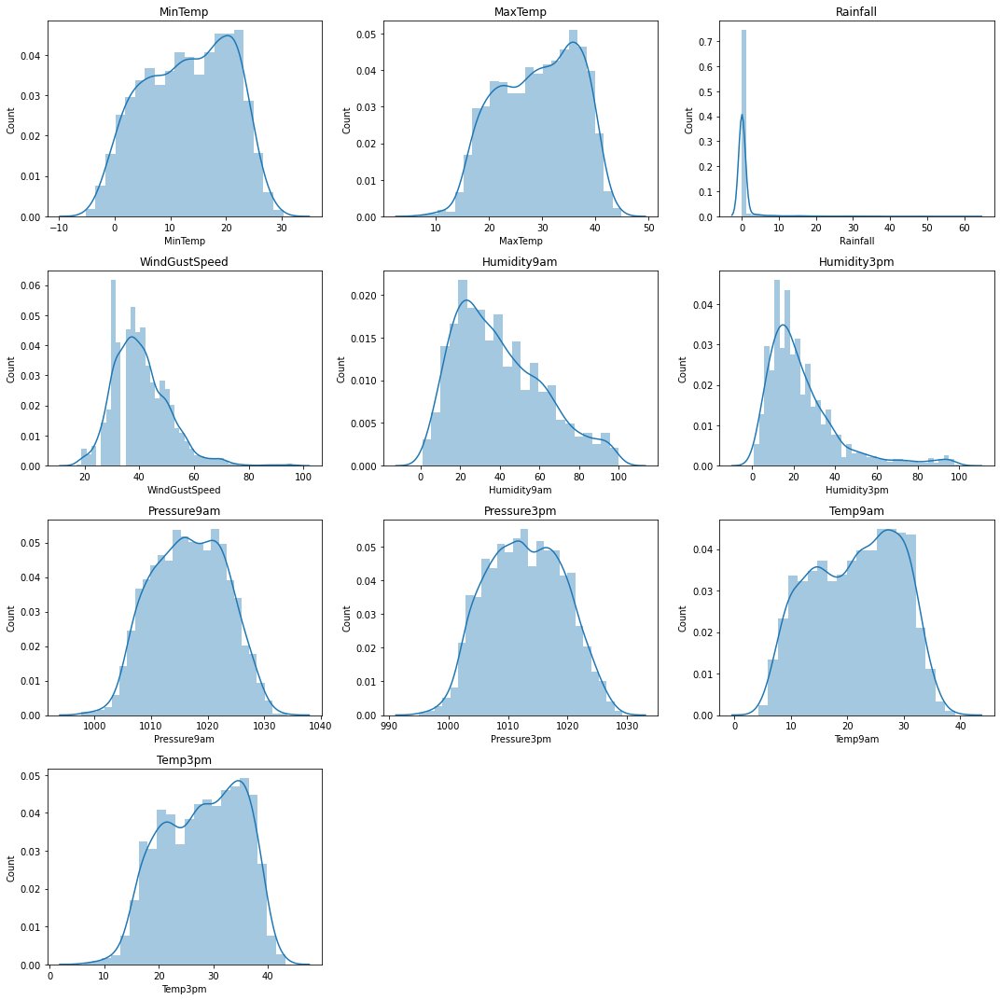

In [109]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(AliceSprings_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [110]:
for var in continuous_feature:
            if AliceSprings_df[var].isnull().sum()*100/len(df) > 0:
                   AliceSprings_df[var].fillna(AliceSprings_df[var].median(), inplace=True)

#### Categorical features

In [111]:
for var in categorical_feature:
    AliceSprings_df[var].fillna(AliceSprings_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [112]:
for var in discrete_feature:
    AliceSprings_df[var].fillna(AliceSprings_df[var].mode().iloc[0], inplace=True)

In [113]:
AliceSprings_df.isnull().sum()*100/len(AliceSprings_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [114]:
AliceSprings_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,13.142467,7.747203,-5.2,6.8,13.7,19.725,30.3
MaxTemp,3040.0,29.248849,7.451184,7.0,23.2,29.9,35.600,44.9
Rainfall,3040.0,0.880526,4.458738,0.0,0.0,0.0,0.000,62.0
WindGustSpeed,3040.0,40.505592,10.141349,17.0,33.0,39.0,46.000,96.0
WindSpeed9am,3040.0,14.726316,8.626587,0.0,9.0,15.0,20.000,41.0
WindSpeed3pm,3040.0,18.100329,6.640399,0.0,13.0,17.0,22.000,59.0
Humidity9am,3040.0,39.686513,22.173953,1.0,22.0,36.0,55.000,100.0
Humidity3pm,3040.0,24.123026,17.689323,1.0,12.0,19.0,30.000,100.0
Pressure9am,3040.0,1016.684737,6.416395,997.7,1011.7,1016.7,1021.700,1034.1
Pressure3pm,3040.0,1012.871743,6.408949,995.0,1007.9,1012.7,1017.800,1029.2


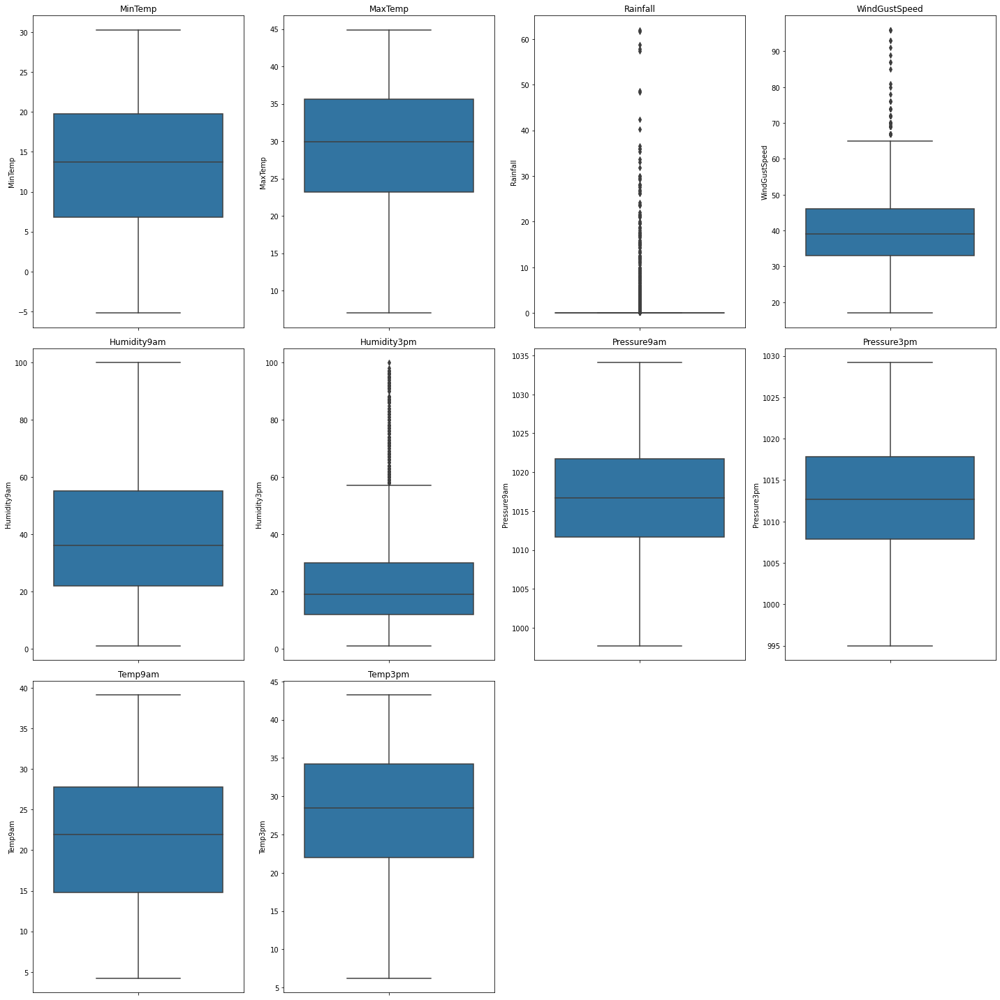

In [115]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=AliceSprings_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [116]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = AliceSprings_df[variable].quantile(0.75) - AliceSprings_df[variable].quantile(0.25)
    lower_bridge = AliceSprings_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = AliceSprings_df[variable].quantile(0.75) + (IQR * 1.5)

    AliceSprings_df = AliceSprings_df[(AliceSprings_df[variable] >= lower_bridge) & (AliceSprings_df[variable] <= upper_bridge)]

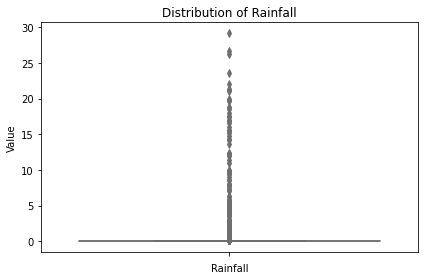

In [117]:
sns.boxplot(data=AliceSprings_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

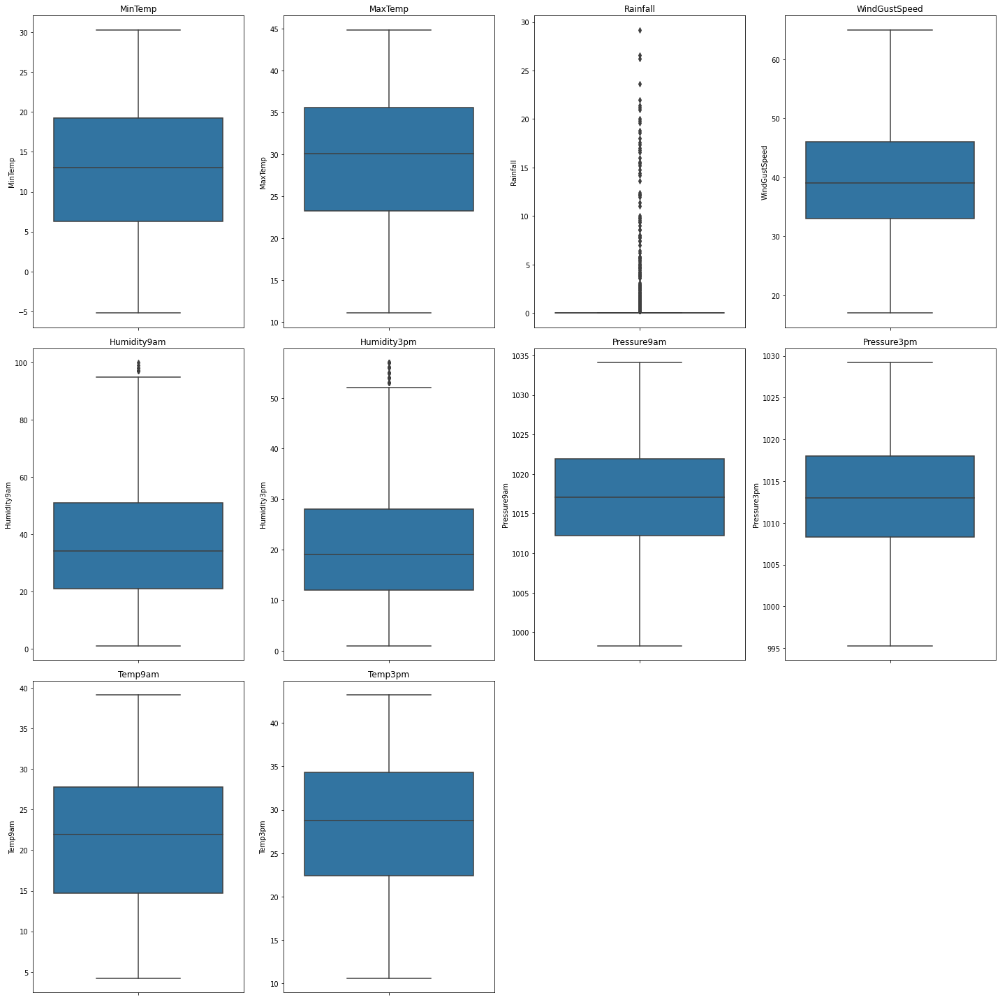

In [118]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=AliceSprings_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [119]:
pct_5 = np.percentile(AliceSprings_df['Rainfall'], 5)
pct_95 = np.percentile(AliceSprings_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 0.8


In [120]:
AliceSprings_df['Rainfall'] = np.where(AliceSprings_df['Rainfall'] > pct_95, pct_95,np.where(AliceSprings_df['Rainfall'] < pct_5, pct_5, AliceSprings_df['Rainfall']))

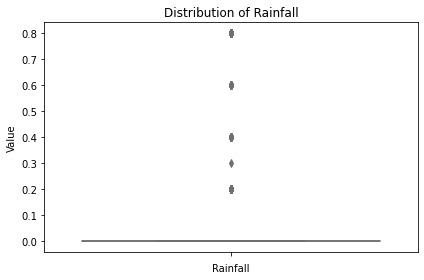

In [121]:
sns.boxplot(data=AliceSprings_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [122]:
AliceSprings_df["RainToday"] = pd.get_dummies(AliceSprings_df["RainToday"], drop_first = True)
AliceSprings_df["RainTomorrow"] = pd.get_dummies(AliceSprings_df["RainTomorrow"], drop_first = True)

In [123]:
for feature in categorical_feature:
    print(feature, (AliceSprings_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-05-11', '2010-08-23', '2010-05-27', '2016-01-20', '2016-01-19',
       '2016-01-13', '2015-12-19', '2015-12-11', '2010-07-04', '2015-12-09',
       ...
       '2011-12-04', '2011-12-05', '2011-12-06', '2011-12-07', '2011-12-08',
       '2011-12-09', '2011-12-10', '2011-12-11', '2011-12-12', '2017-06-25'],
      dtype='object', name='Date', length=2807)
Location Index(['AliceSprings'], dtype='object', name='Location')
WindGustDir Index(['W', 'NW', 'NNW', 'NNE', 'SW', 'N', 'SSW', 'WSW', 'WNW', 'S', 'NE',
       'SE', 'SSE', 'E', 'ENE', 'ESE'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['N', 'NW', 'NNW', 'SSW', 'WSW', 'ENE', 'NNE', 'SW', 'E', 'SE', 'SSE',
       'NE', 'WNW', 'ESE', 'S', 'W'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['NNE', 'WNW', 'NNW', 'N', 'NW', 'NE', 'W', 'ENE', 'SSE', 'S', 'ESE',
       'WSW', 'SSW', 'SW', 'SE', 'E'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainTo

In [124]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
AliceSprings_df["WindGustDir"] = AliceSprings_df["WindGustDir"].map(windgustdir)
AliceSprings_df["WindDir9am"] = AliceSprings_df["WindDir9am"].map(winddir9am)
AliceSprings_df["WindDir3pm"] = AliceSprings_df["WindDir3pm"].map(winddir3pm)

In [125]:
#AliceSprings_df["Date"] = pd.to_datetime(AliceSprings_df["Date"], format = "%Y-%m-%dT", errors = "coerce")

In [126]:
#AliceSprings_df["Date_month"] = AliceSprings_df["Date"].dt.month
#AliceSprings_df["Date_day"] = AliceSprings_df["Date"].dt.day

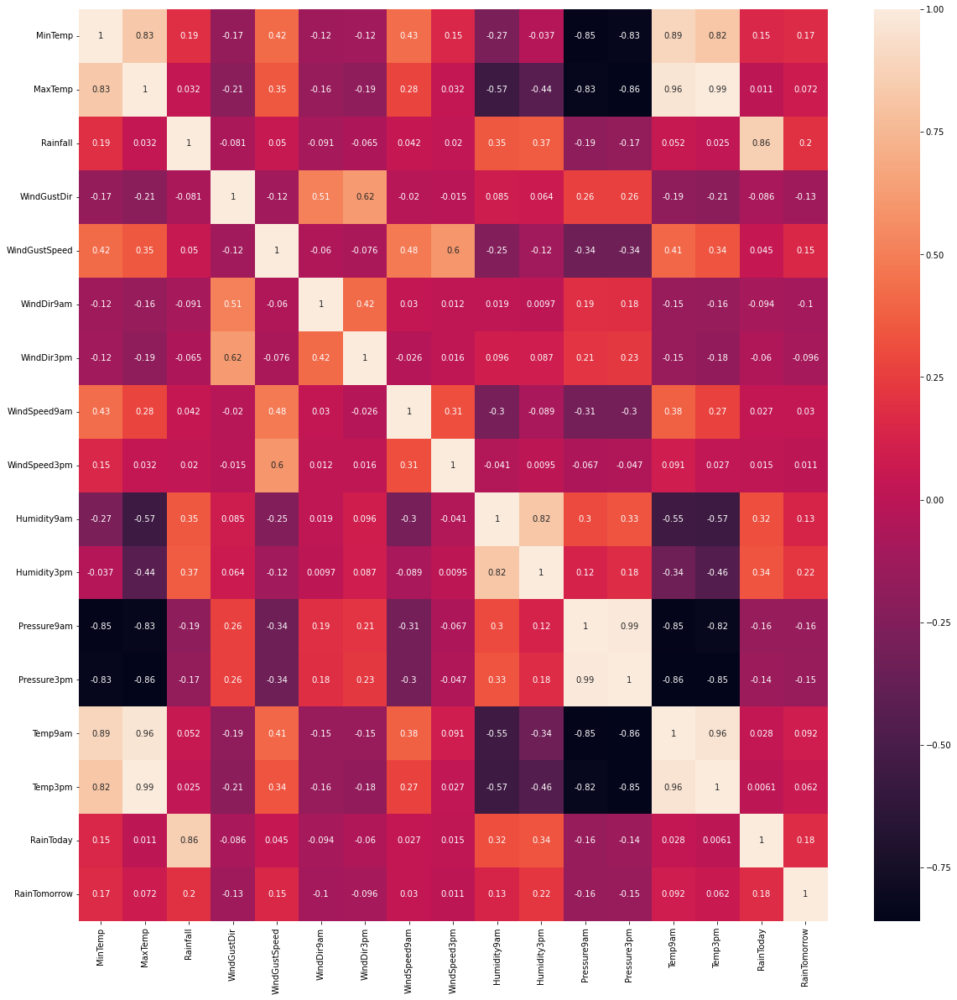

In [127]:
corrmat = AliceSprings_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [128]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
AliceSprings_df[columns_to_scale] = scaler.fit_transform(AliceSprings_df[columns_to_scale])

### Model Building

In [129]:
X = AliceSprings_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = AliceSprings_df['RainTomorrow']

In [130]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [131]:
y_train

137578    0
138406    0
137658    0
139074    0
138765    0
         ..
137862    0
137520    0
137428    0
136203    0
136330    0
Name: RainTomorrow, Length: 2245, dtype: uint8

In [132]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [133]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[536   2]
 [ 21   3]]
0.9590747330960854
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       538
           1       0.60      0.12      0.21        24

    accuracy                           0.96       562
   macro avg       0.78      0.56      0.59       562
weighted avg       0.95      0.96      0.95       562



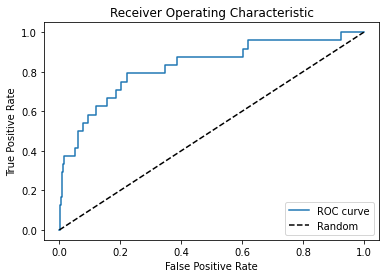

ROC AUC: 0.8260532837670385


In [134]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [135]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [136]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[537   1]
 [ 24   0]]
0.9555160142348754
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       538
           1       0.00      0.00      0.00        24

    accuracy                           0.96       562
   macro avg       0.48      0.50      0.49       562
weighted avg       0.92      0.96      0.94       562



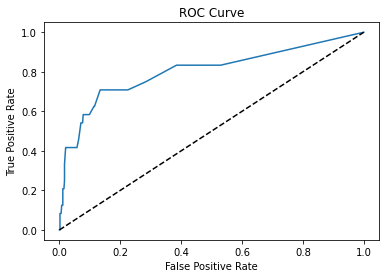

ROC AUC: 0.8029739776951673


In [137]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)


In [138]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [139]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[517  21]
 [ 18   6]]
0.9306049822064056
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       538
           1       0.22      0.25      0.24        24

    accuracy                           0.93       562
   macro avg       0.59      0.61      0.60       562
weighted avg       0.93      0.93      0.93       562



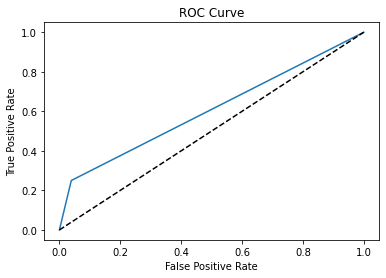

ROC AUC: 0.6054832713754646


In [140]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [142]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [145]:
y_pred = svm.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[538   0]
 [ 24   0]]
0.9572953736654805
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       538
           1       0.00      0.00      0.00        24

    accuracy                           0.96       562
   macro avg       0.48      0.50      0.49       562
weighted avg       0.92      0.96      0.94       562



C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


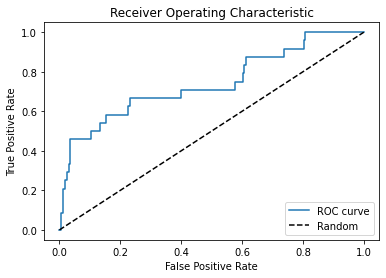

ROC AUC: 0.7412484510532837


In [144]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### Sydney

In [146]:
Sydney_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
30176,2008-02-01,Sydney,19.5,22.4,15.6,NaN,NaN,S,SSW,17.0,20.0,92.0,84.0,1017.6,1017.4,20.7,20.9,Yes,Yes
30177,2008-02-02,Sydney,19.5,25.6,6.0,NaN,NaN,W,E,9.0,13.0,83.0,73.0,1017.9,1016.4,22.4,24.8,Yes,Yes
30178,2008-02-03,Sydney,21.6,24.5,6.6,NaN,NaN,ESE,ESE,17.0,2.0,88.0,86.0,1016.7,1015.6,23.5,23.0,Yes,Yes
30179,2008-02-04,Sydney,20.2,22.8,18.8,NaN,NaN,NNE,E,22.0,20.0,83.0,90.0,1014.2,1011.8,21.4,20.9,Yes,Yes
30180,2008-02-05,Sydney,19.7,25.7,77.4,NaN,NaN,NNE,W,11.0,6.0,88.0,74.0,1008.3,1004.8,22.5,25.5,Yes,Yes


In [147]:
Sydney_df.isnull().sum()*100/len(Sydney_df)

Date              0.000000
Location          0.000000
MinTemp           0.119617
MaxTemp           0.059809
Rainfall          0.209330
WindGustDir      31.040670
WindGustSpeed    31.040670
WindDir9am        1.674641
WindDir3pm        0.986842
WindSpeed9am      0.777512
WindSpeed3pm      0.747608
Humidity9am       0.448565
Humidity3pm       0.388756
Pressure9am       0.627990
Pressure3pm       0.568182
Temp9am           0.149522
Temp3pm           0.119617
RainToday         0.209330
RainTomorrow      0.209330
dtype: float64

In [148]:
Sydney_df.drop(['WindGustDir', 'WindGustSpeed'], axis=1, inplace=True)

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/3191975244.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Sydney_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/3191975244.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Sydney_df[feature], ax=axes[i])
C:\U

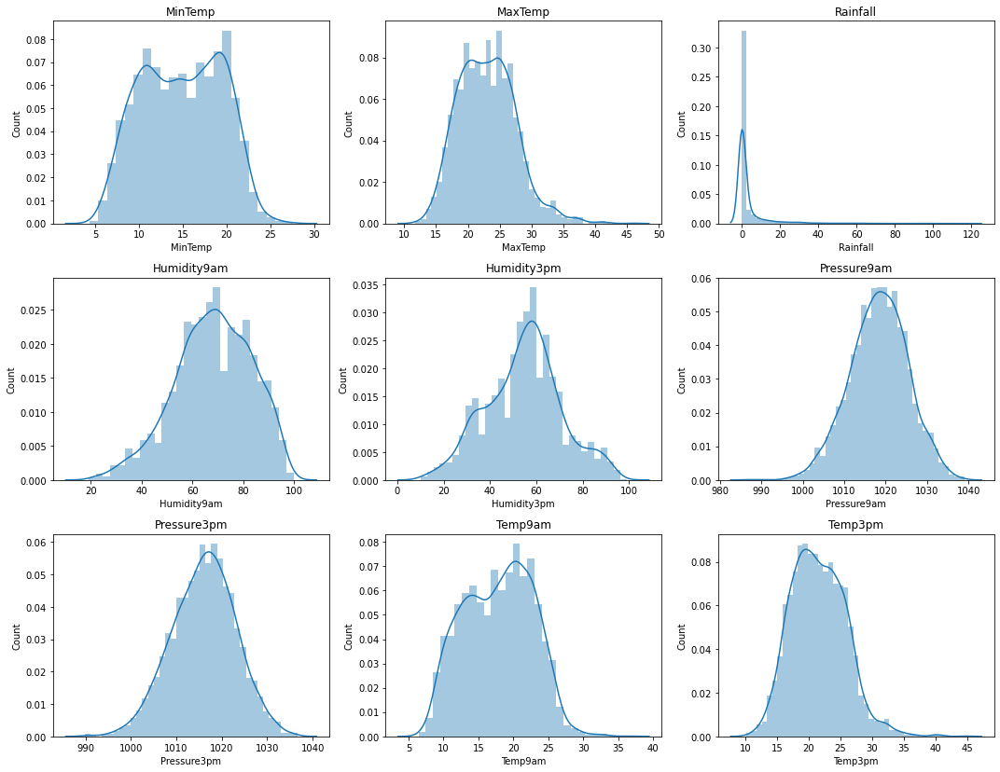

In [149]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

continuous_feature_1 = [feat for feat in continuous_feature if feat != 'WindGustSpeed']
for i, feature in enumerate(continuous_feature_1):
        sns.distplot(Sydney_df[feature], ax=axes[i])
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel("Count")
        axes[i].set_title(feature)

if len(continuous_feature_1) < num_rows * num_cols:
    for j in range(len(continuous_feature_1), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [150]:
for var in continuous_feature_1:
    if Sydney_df[var].isnull().sum()*100/len(df) > 0:
                Sydney_df[var].fillna(df[var].median(), inplace=True)

#### Categorical Features

In [151]:
categorical_feature_1 = [feat for feat in categorical_feature if feat != 'WindGustDir']
for var in categorical_feature_1:
    Sydney_df[var].fillna(Sydney_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [152]:
for var in discrete_feature:
    Sydney_df[var].fillna(Sydney_df[var].mode().iloc[0], inplace=True)

In [153]:
Sydney_df.isnull().sum()*100/len(Sydney_df)

Date            0.0
Location        0.0
MinTemp         0.0
MaxTemp         0.0
Rainfall        0.0
WindDir9am      0.0
WindDir3pm      0.0
WindSpeed9am    0.0
WindSpeed3pm    0.0
Humidity9am     0.0
Humidity3pm     0.0
Pressure9am     0.0
Pressure3pm     0.0
Temp9am         0.0
Temp3pm         0.0
RainToday       0.0
RainTomorrow    0.0
dtype: float64

In [154]:
Sydney_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3344.0,14.866986,4.548897,4.3,11.0,14.95,18.7,27.6
MaxTemp,3344.0,23.000957,4.492583,11.7,19.6,22.80,26.0,45.8
Rainfall,3344.0,3.317584,9.877996,0.0,0.0,0.00,1.4,119.4
WindSpeed9am,3344.0,15.059211,7.055574,0.0,11.0,15.00,20.0,54.0
WindSpeed3pm,3344.0,19.329844,7.456388,0.0,15.0,19.00,24.0,57.0
Humidity9am,3344.0,68.229964,15.042687,19.0,58.0,69.00,80.0,100.0
Humidity3pm,3344.0,54.750000,16.274906,10.0,44.0,56.00,65.0,99.0
Pressure9am,3344.0,1018.344258,6.997355,986.7,1013.8,1018.50,1023.1,1039.0
Pressure3pm,3344.0,1016.020333,7.012206,989.8,1011.3,1016.40,1020.8,1036.7
Temp9am,3344.0,17.822638,4.892233,6.4,13.8,18.20,21.7,36.5


#### Outlier Handling

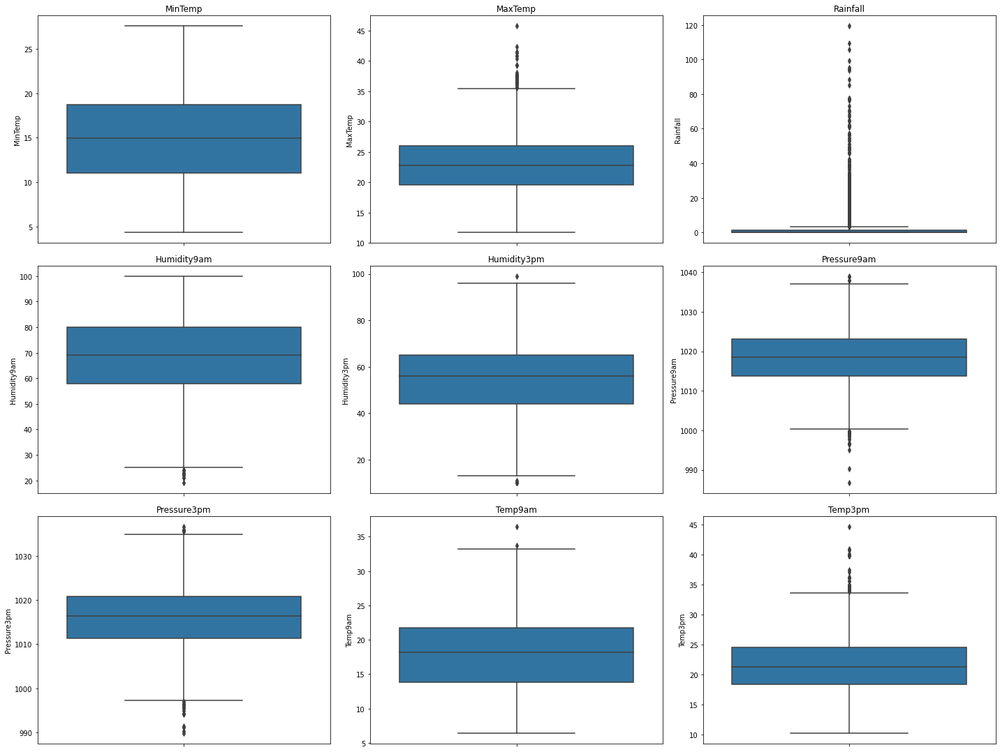

In [155]:
num_cols = 3
num_rows = 4

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature_1):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Sydney_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [156]:
variables = continuous_feature_1.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Sydney_df[variable].quantile(0.75) - Sydney_df[variable].quantile(0.25)
    lower_bridge = Sydney_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Sydney_df[variable].quantile(0.75) + (IQR * 1.5)

    Sydney_df = Sydney_df[(Sydney_df[variable] >= lower_bridge) & (Sydney_df[variable] <= upper_bridge)]

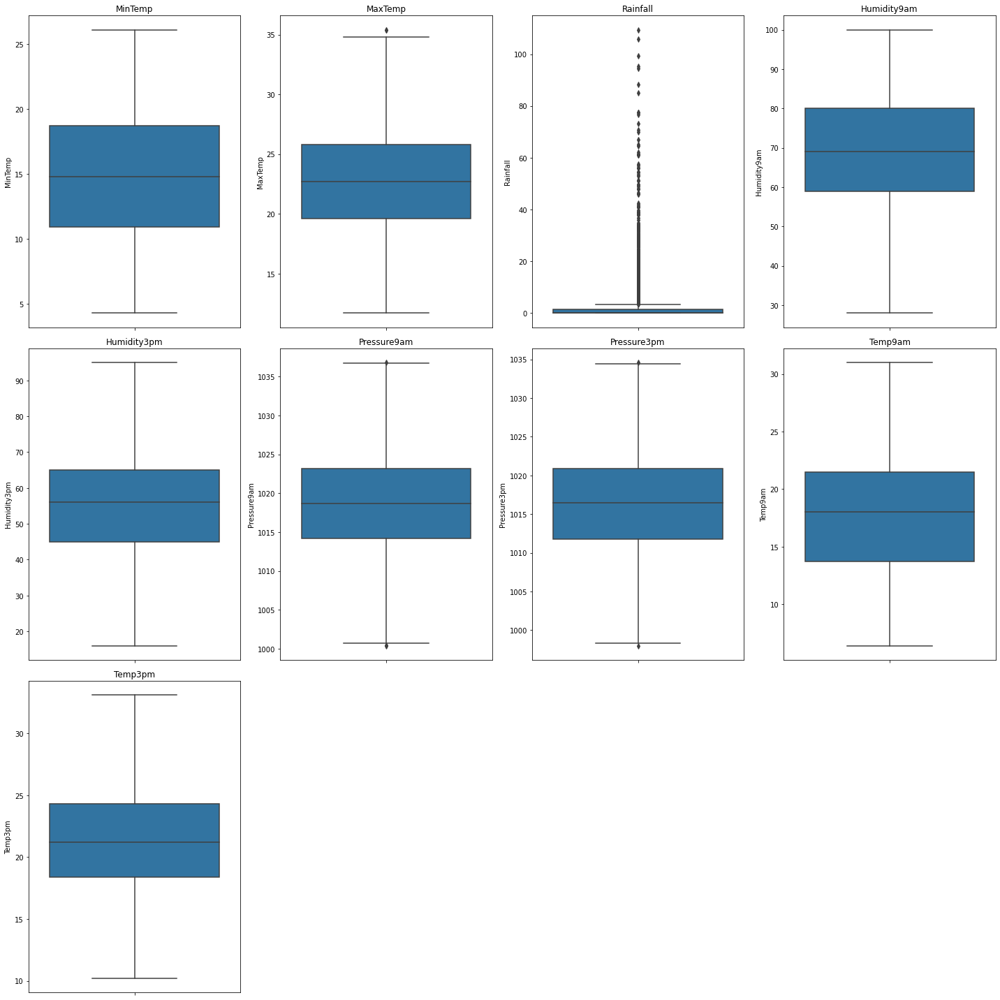

In [157]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature_1):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Sydney_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

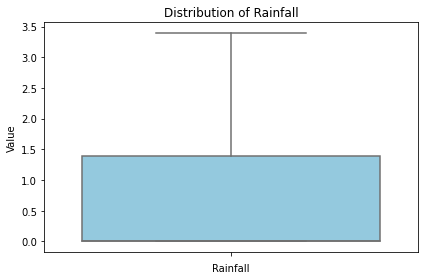

In [158]:
sns.boxplot(data=Sydney_df, y='Rainfall', showfliers=False, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

In [159]:
pct_5 = np.percentile(Sydney_df['Rainfall'], 5)
pct_95 = np.percentile(Sydney_df['Rainfall'], 95)
print(pct_5,pct_95)

0.0 19.619999999999983


In [160]:
Sydney_df['Rainfall'] = np.where(Sydney_df['Rainfall'] > pct_95, pct_95,np.where(Sydney_df['Rainfall'] < pct_5, pct_5, Sydney_df['Rainfall']))

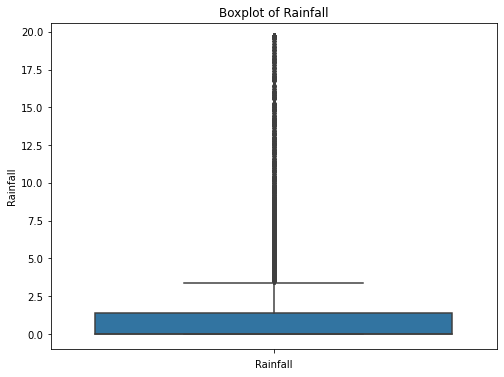

In [161]:
plt.figure(figsize=(8, 6))
sns.boxplot(data = Sydney_df, y='Rainfall')
plt.title('Boxplot of Rainfall')
plt.xlabel('Rainfall')
plt.show()

### Feature Engineering

In [162]:
Sydney_df["RainToday"] = pd.get_dummies(Sydney_df["RainToday"], drop_first = True)
Sydney_df["RainTomorrow"] = pd.get_dummies(Sydney_df["RainTomorrow"], drop_first = True)

In [163]:
for feature in categorical_feature_1:
    print(feature, (Sydney_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2008-02-01', '2010-03-13', '2014-06-08', '2012-04-11', '2014-06-09',
       '2014-06-10', '2012-04-08', '2010-02-28', '2010-03-01', '2014-06-13',
       ...
       '2011-08-21', '2011-08-23', '2011-08-24', '2011-08-25', '2011-08-26',
       '2011-08-27', '2011-08-28', '2011-08-29', '2011-08-30', '2017-06-25'],
      dtype='object', name='Date', length=3239)
Location Index(['Sydney'], dtype='object', name='Location')
WindDir9am Index(['SE', 'SSW', 'SSE', 'SW', 'S', 'ESE', 'ENE', 'E', 'NE', 'NNE', 'N',
       'NW', 'WSW', 'W', 'NNW', 'WNW'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['SSW', 'S', 'SW', 'NNE', 'SE', 'SSE', 'NNW', 'N', 'ESE', 'NW', 'NE',
       'W', 'WSW', 'E', 'ENE', 'WNW'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [164]:
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}

Sydney_df["WindDir9am"] = Sydney_df["WindDir9am"].map(winddir9am)
Sydney_df["WindDir3pm"] = Sydney_df["WindDir3pm"].map(winddir3pm)

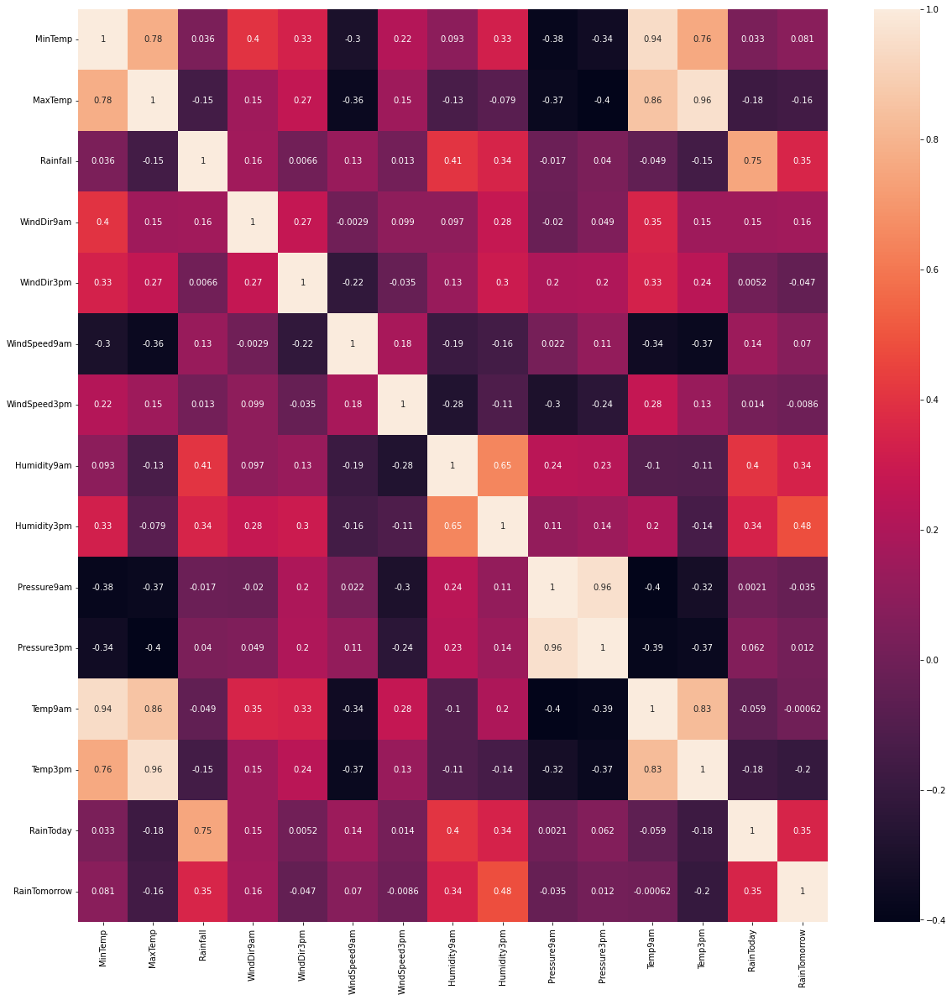

In [165]:
corrmat = Sydney_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [166]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Sydney_df[columns_to_scale] = scaler.fit_transform(Sydney_df[columns_to_scale])

### Model Building

In [167]:
X = Sydney_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Sydney_df['RainTomorrow']

In [168]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [169]:
y_train

31547    0
30942    0
32615    0
30703    0
33499    0
        ..
30892    0
32849    1
30352    0
31280    0
31046    1
Name: RainTomorrow, Length: 2591, dtype: uint8

In [170]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [171]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[453  27]
 [ 88  80]]
0.8225308641975309
              precision    recall  f1-score   support

           0       0.84      0.94      0.89       480
           1       0.75      0.48      0.58       168

    accuracy                           0.82       648
   macro avg       0.79      0.71      0.73       648
weighted avg       0.81      0.82      0.81       648



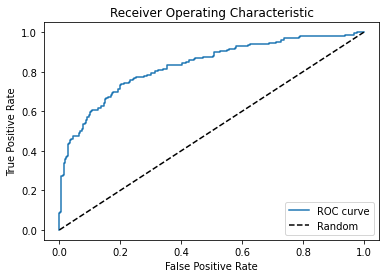

ROC AUC: 0.8313616071428572


In [172]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [173]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [174]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[453  27]
 [ 88  80]]
0.8225308641975309
              precision    recall  f1-score   support

           0       0.84      0.94      0.89       480
           1       0.75      0.48      0.58       168

    accuracy                           0.82       648
   macro avg       0.79      0.71      0.73       648
weighted avg       0.81      0.82      0.81       648



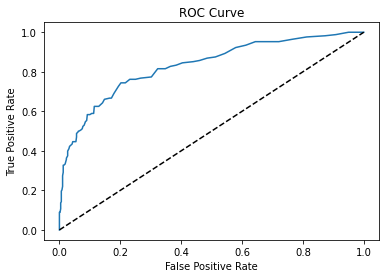

ROC AUC: 0.8305059523809524


In [175]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [176]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [177]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[394  86]
 [ 71  97]]
0.7577160493827161
              precision    recall  f1-score   support

           0       0.85      0.82      0.83       480
           1       0.53      0.58      0.55       168

    accuracy                           0.76       648
   macro avg       0.69      0.70      0.69       648
weighted avg       0.77      0.76      0.76       648



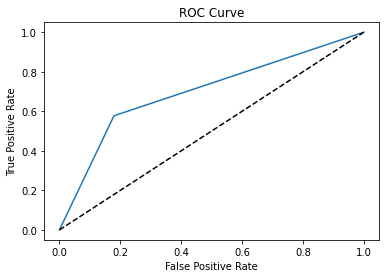

ROC AUC: 0.6991071428571427


In [178]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [180]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [182]:
y_pred = svm.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[463  17]
 [ 99  69]]
0.8209876543209876
              precision    recall  f1-score   support

           0       0.82      0.96      0.89       480
           1       0.80      0.41      0.54       168

    accuracy                           0.82       648
   macro avg       0.81      0.69      0.72       648
weighted avg       0.82      0.82      0.80       648



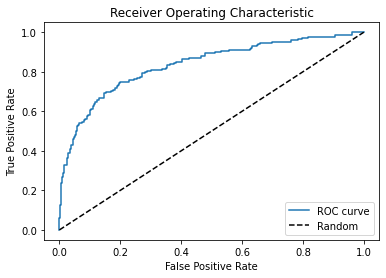

ROC AUC: 0.8346354166666667


In [183]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### 3.Ballarat

In [184]:
Ballarat_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
55102,2008-12-01,Ballarat,5.8,17.6,3.2,W,52.0,W,WNW,26.0,30.0,71.0,37.0,1008.2,1007.5,10.4,15.7,Yes,No
55103,2008-12-02,Ballarat,4.3,19.5,0.4,WNW,44.0,WNW,WNW,20.0,24.0,66.0,47.0,1009.3,1007.3,12.5,17.6,No,No
55104,2008-12-03,Ballarat,9.5,18.8,0.6,W,43.0,WSW,SW,22.0,20.0,82.0,42.0,1009.5,1011.5,11.2,16.5,No,No
55105,2008-12-04,Ballarat,6.7,21.8,0.2,NNE,39.0,ENE,N,9.0,22.0,60.0,33.0,1016.2,1012.6,14.4,20.6,No,Yes
55106,2008-12-05,Ballarat,13.3,25.6,1.2,NW,61.0,NNW,NW,30.0,39.0,74.0,40.0,1006.6,1005.5,18.3,24.3,Yes,No


In [185]:
Ballarat_df.isnull().sum()*100/len(Ballarat_df)

Date             0.000000
Location         0.000000
MinTemp          0.032895
MaxTemp          0.032895
Rainfall         0.394737
WindGustDir      1.019737
WindGustSpeed    1.019737
WindDir9am       2.993421
WindDir3pm       0.592105
WindSpeed9am     0.263158
WindSpeed3pm     0.131579
Humidity9am      0.690789
Humidity3pm      0.230263
Pressure9am      0.789474
Pressure3pm      0.855263
Temp9am          0.394737
Temp3pm          0.197368
RainToday        0.394737
RainTomorrow     0.394737
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/700915525.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Ballarat_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/700915525.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Ballarat_df[feature], ax=axes[i])
C:

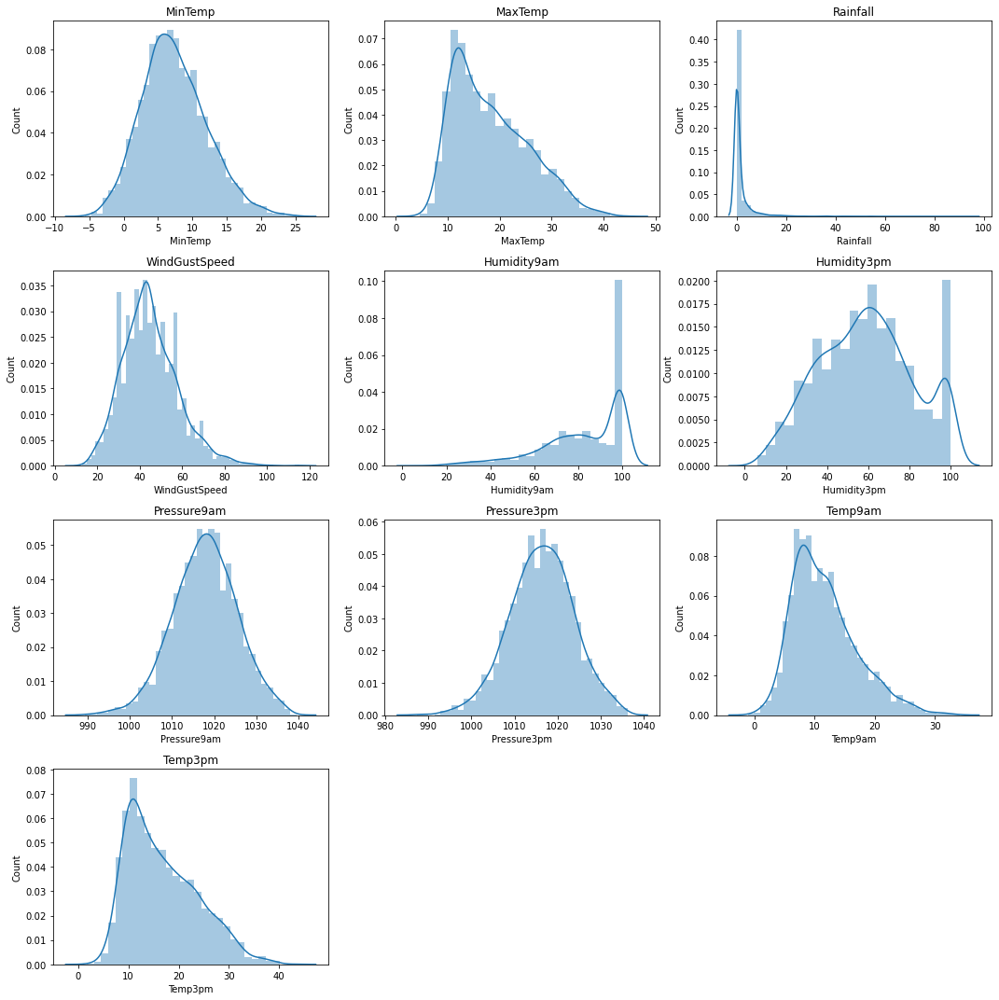

In [186]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Ballarat_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [187]:
for var in continuous_feature:
        if Ballarat_df[var].isnull().sum()*100/len(df) > 0:
                    Ballarat_df[var].fillna(Ballarat_df[var].median(), inplace=True)

#### Categorical features

In [188]:
for var in categorical_feature:
    Ballarat_df[var].fillna(Ballarat_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [189]:
for var in discrete_feature:
    Ballarat_df[var].fillna(Ballarat_df[var].mode().iloc[0], inplace=True)

In [190]:
Ballarat_df.isnull().sum()*100/len(Ballarat_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [191]:
Ballarat_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,7.367829,4.718932,-5.6,4.2,7.0,10.4,25.1
MaxTemp,3040.0,18.286809,7.187360,4.6,12.3,16.9,23.3,44.1
Rainfall,3040.0,1.733158,5.112418,0.0,0.0,0.0,1.2,95.0
WindGustSpeed,3040.0,44.972697,12.908170,13.0,37.0,44.0,52.0,115.0
WindSpeed9am,3040.0,19.976974,9.433831,0.0,13.0,20.0,26.0,56.0
WindSpeed3pm,3040.0,22.768421,9.231564,0.0,17.0,22.0,28.0,65.0
Humidity9am,3040.0,81.846711,18.620759,9.0,71.0,86.0,98.0,100.0
Humidity3pm,3040.0,59.030921,22.557032,6.0,42.0,59.0,75.0,100.0
Pressure9am,3040.0,1017.845526,7.581273,989.4,1012.9,1017.9,1023.0,1039.5
Pressure3pm,3040.0,1016.272303,7.415721,987.3,1011.4,1016.4,1021.3,1036.3


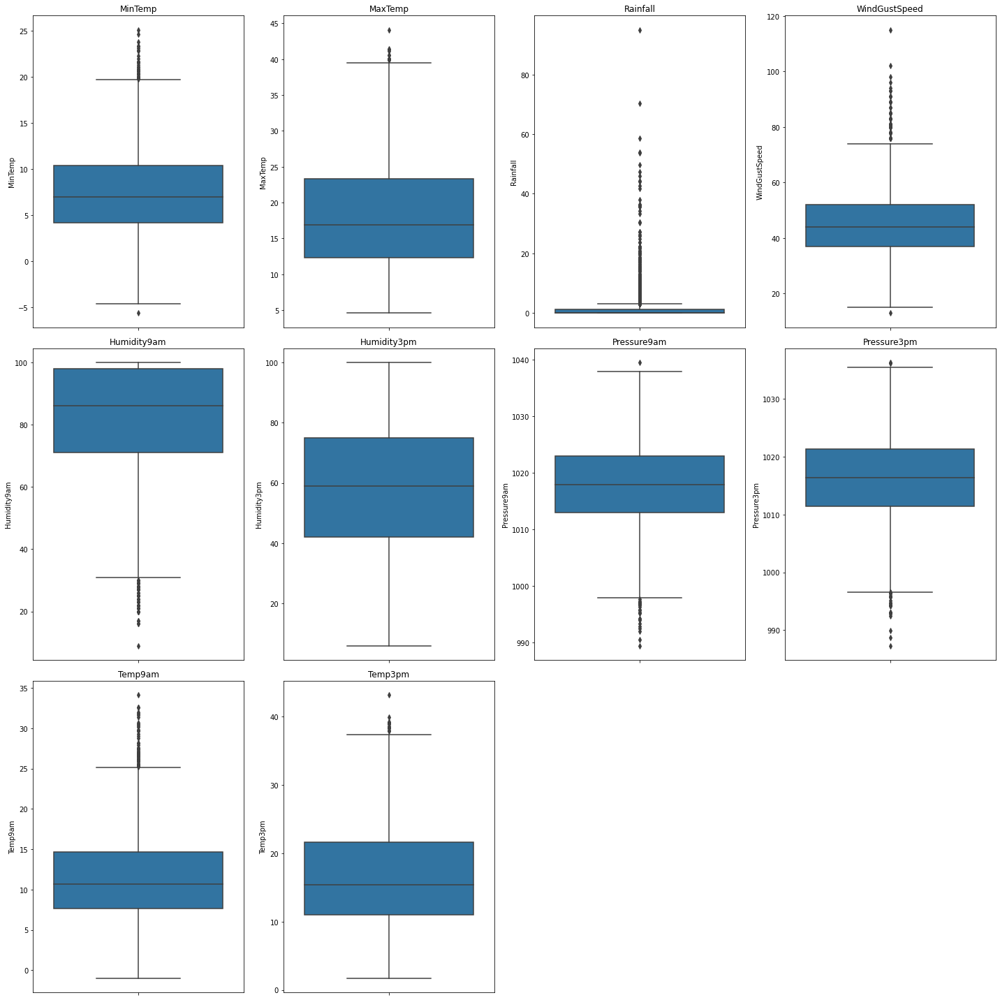

In [192]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Ballarat_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [193]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Ballarat_df[variable].quantile(0.75) - Ballarat_df[variable].quantile(0.25)
    lower_bridge = Ballarat_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Ballarat_df[variable].quantile(0.75) + (IQR * 1.5)

    Ballarat_df = Ballarat_df[(Ballarat_df[variable] >= lower_bridge) & (Ballarat_df[variable] <= upper_bridge)]

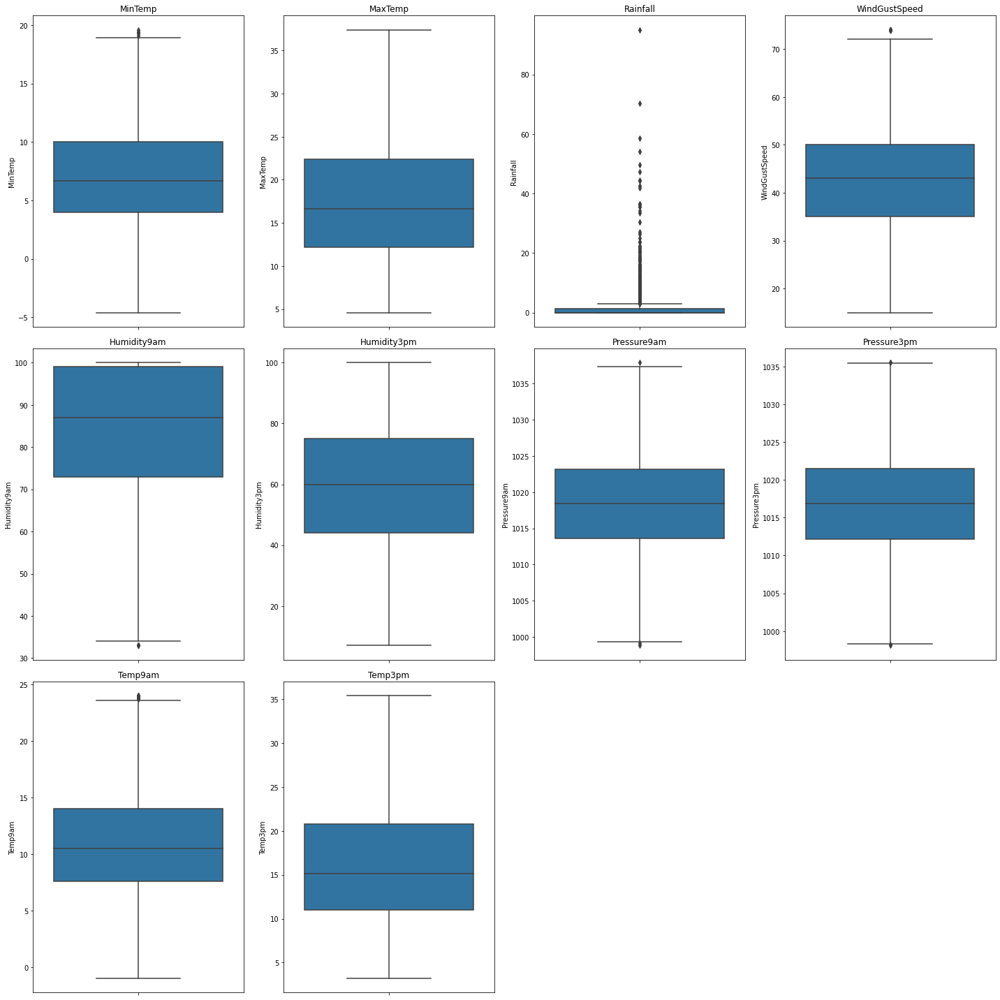

In [194]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Ballarat_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

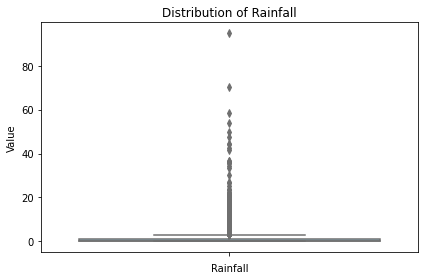

In [195]:
sns.boxplot(data=Ballarat_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

In [196]:
pct_5 = np.percentile(Ballarat_df['Rainfall'], 5)
pct_95 = np.percentile(Ballarat_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 8.559999999999945


In [197]:
Ballarat_df['Rainfall'] = np.where(Ballarat_df['Rainfall'] > pct_95, pct_95,np.where(Ballarat_df['Rainfall'] < pct_5, pct_5,Ballarat_df['Rainfall']))

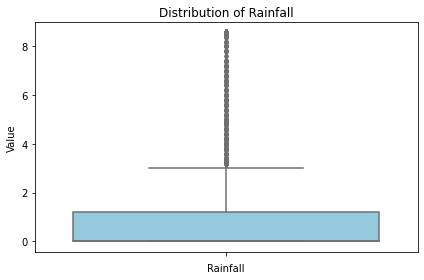

In [198]:
sns.boxplot(data=Ballarat_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [199]:
Ballarat_df["RainToday"] = pd.get_dummies(Ballarat_df["RainToday"], drop_first = True)
Ballarat_df["RainTomorrow"] = pd.get_dummies(Ballarat_df["RainTomorrow"], drop_first = True)

In [200]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Ballarat_df["WindGustDir"] = Ballarat_df["WindGustDir"].map(windgustdir)
Ballarat_df["WindDir9am"] = Ballarat_df["WindDir9am"].map(winddir9am)
Ballarat_df["WindDir3pm"] = Ballarat_df["WindDir3pm"].map(winddir3pm)

In [201]:
for feature in categorical_feature:
    print(feature, (Ballarat_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2017-06-25', '2015-06-04', '2011-07-06', '2011-07-08', '2015-07-17',
       '2011-07-10', '2011-07-13', '2015-07-14', '2015-07-13', '2011-07-16',
       ...
       '2012-02-07', '2012-02-09', '2012-02-17', '2012-02-10', '2012-02-12',
       '2012-02-13', '2012-02-14', '2012-02-15', '2012-02-16', '2013-04-17'],
      dtype='object', name='Date', length=2825)
Location Index(['Ballarat'], dtype='object', name='Location')
WindGustDir Int64Index([11, 14, 5, 4, 1, 2, 6, 0, 3, 9, 8, 13, 7, 15, 12, 10], dtype='int64', name='WindGustDir')
WindDir9am Int64Index([0, 5, 4, 3, 9, 15, 1, 2, 6, 7, 12, 8, 14, 13, 10, 11], dtype='int64', name='WindDir9am')
WindDir3pm Int64Index([11, 14, 5, 0, 6, 4, 2, 3, 1, 9, 7, 15, 13, 8, 12, 10], dtype='int64', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


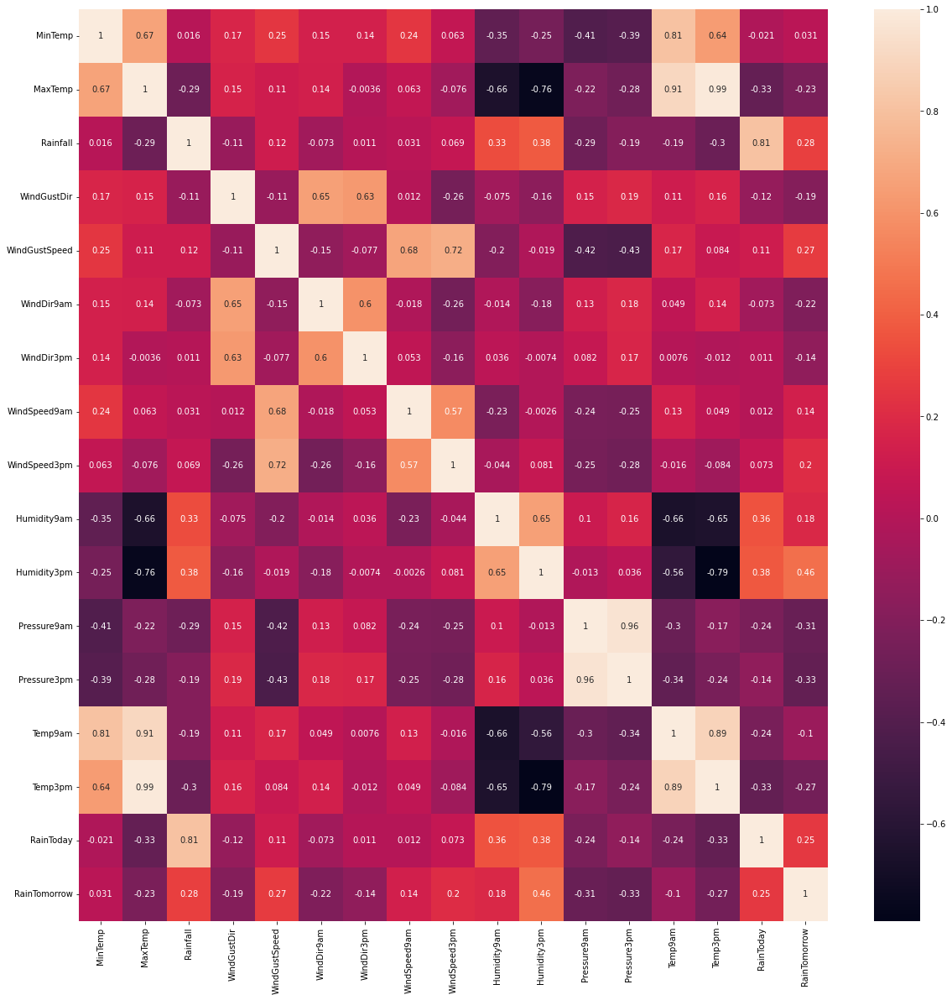

In [202]:
corrmat = Ballarat_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [203]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Ballarat_df[columns_to_scale] = scaler.fit_transform(Ballarat_df[columns_to_scale])

### Model Building

In [204]:
X = Ballarat_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Ballarat_df['RainTomorrow']

In [205]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [206]:
y_train

56843    1
57132    0
56491    0
58053    1
56650    0
        ..
55830    0
57651    0
56836    1
58094    0
56667    1
Name: RainTomorrow, Length: 2260, dtype: uint8

In [207]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [208]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[409  19]
 [ 68  69]]
0.8460176991150442
              precision    recall  f1-score   support

           0       0.86      0.96      0.90       428
           1       0.78      0.50      0.61       137

    accuracy                           0.85       565
   macro avg       0.82      0.73      0.76       565
weighted avg       0.84      0.85      0.83       565



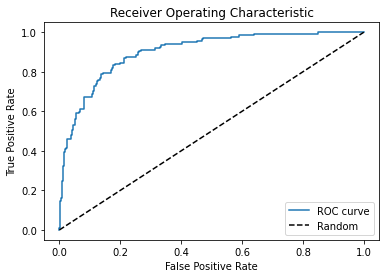

ROC AUC: 0.9011017122586806


In [209]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [210]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [211]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[404  24]
 [ 66  71]]
0.8407079646017699
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       428
           1       0.75      0.52      0.61       137

    accuracy                           0.84       565
   macro avg       0.80      0.73      0.76       565
weighted avg       0.83      0.84      0.83       565



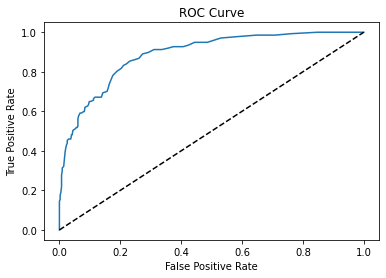

ROC AUC: 0.8879954294290198


In [212]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [213]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [214]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[368  60]
 [ 62  75]]
0.784070796460177
              precision    recall  f1-score   support

           0       0.86      0.86      0.86       428
           1       0.56      0.55      0.55       137

    accuracy                           0.78       565
   macro avg       0.71      0.70      0.70       565
weighted avg       0.78      0.78      0.78       565



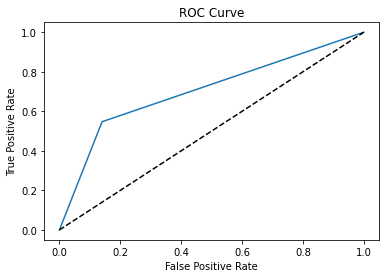

ROC AUC: 0.703629169793301


In [215]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [217]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [218]:
y_pred = svm.predict(X_test)

# Evaluate the performance
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[414  14]
 [ 72  65]]
0.8477876106194691
              precision    recall  f1-score   support

           0       0.85      0.97      0.91       428
           1       0.82      0.47      0.60       137

    accuracy                           0.85       565
   macro avg       0.84      0.72      0.75       565
weighted avg       0.84      0.85      0.83       565



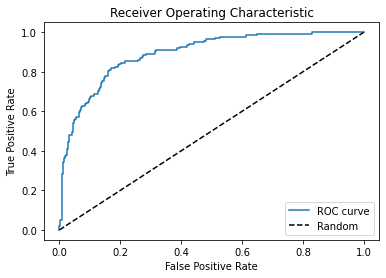

ROC AUC: 0.8921993314687223


In [219]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

## Hobart

In [220]:
Hobart_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
129838,2008-07-01,Hobart,4.6,12.2,3.0,WSW,81.0,NNE,NW,17.0,24.0,72.0,42.0,988.3,992.3,6.5,12.1,Yes,Yes
129839,2008-07-02,Hobart,5.1,10.8,16.2,W,83.0,NW,SW,24.0,26.0,78.0,60.0,991.7,1002.5,6.0,8.5,Yes,Yes
129840,2008-07-03,Hobart,5.5,12.4,3.0,SW,100.0,WNW,SW,37.0,39.0,55.0,53.0,1008.7,1015.1,10.1,9.3,Yes,No
129841,2008-07-04,Hobart,0.9,10.4,1.0,NNW,28.0,NW,N,17.0,9.0,76.0,54.0,1028.9,1028.1,3.2,9.6,No,No
129842,2008-07-05,Hobart,0.5,10.0,0.0,NNW,28.0,NNW,NW,13.0,15.0,79.0,53.0,1028.2,1025.4,2.9,9.7,No,No


In [221]:
Hobart_df.isnull().sum()*100/len(Hobart_df)

Date             0.000000
Location         0.000000
MinTemp          0.000000
MaxTemp          0.031319
Rainfall         0.156593
WindGustDir      0.720326
WindGustSpeed    0.720326
WindDir9am       1.284059
WindDir3pm       0.626370
WindSpeed9am     0.000000
WindSpeed3pm     0.062637
Humidity9am      0.313185
Humidity3pm      0.407141
Pressure9am      0.031319
Pressure3pm      0.031319
Temp9am          0.031319
Temp3pm          0.062637
RainToday        0.156593
RainTomorrow     0.156593
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/2870990004.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Hobart_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/2870990004.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Hobart_df[feature], ax=axes[i])
C:\U

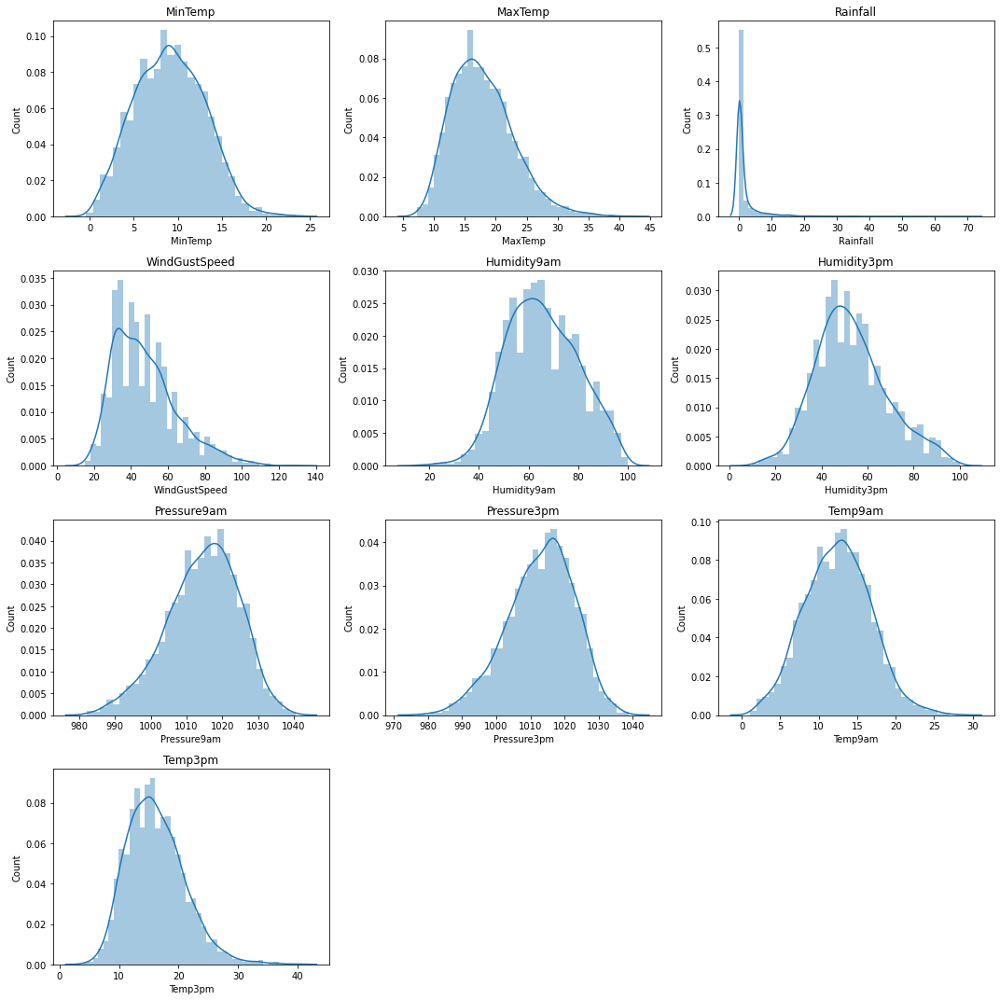

In [222]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Hobart_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [223]:
for var in continuous_feature:
    if Hobart_df[var].isnull().sum()*100/len(df) > 0:
                Hobart_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [224]:
for var in categorical_feature:
    Hobart_df[var].fillna(Hobart_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [225]:
for var in discrete_feature:
    Hobart_df[var].fillna(Hobart_df[var].mode().iloc[0], inplace=True)

In [226]:
Hobart_df.isnull().sum()*100/len(Hobart_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [227]:
Hobart_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3193.0,9.078578,3.897084,-0.4,6.1,9.0,11.9,23.4
MaxTemp,3193.0,17.866802,4.990655,7.2,14.1,17.3,20.9,41.8
Rainfall,3193.0,1.599311,4.402151,0.0,0.0,0.0,1.0,71.6
WindGustSpeed,3193.0,47.498277,17.262334,15.0,35.0,44.0,57.0,130.0
WindSpeed9am,3193.0,16.307861,8.137146,0.0,11.0,15.0,20.0,54.0
WindSpeed3pm,3193.0,19.812715,8.335651,0.0,15.0,19.0,24.0,63.0
Humidity9am,3193.0,65.635766,14.260526,16.0,55.0,65.0,76.0,100.0
Humidity3pm,3193.0,53.010022,15.697641,10.0,42.0,51.0,62.0,100.0
Pressure9am,3193.0,1014.532509,9.965456,982.2,1008.2,1015.4,1021.6,1040.4
Pressure3pm,3193.0,1012.962950,9.824841,977.1,1006.7,1013.9,1019.9,1038.9


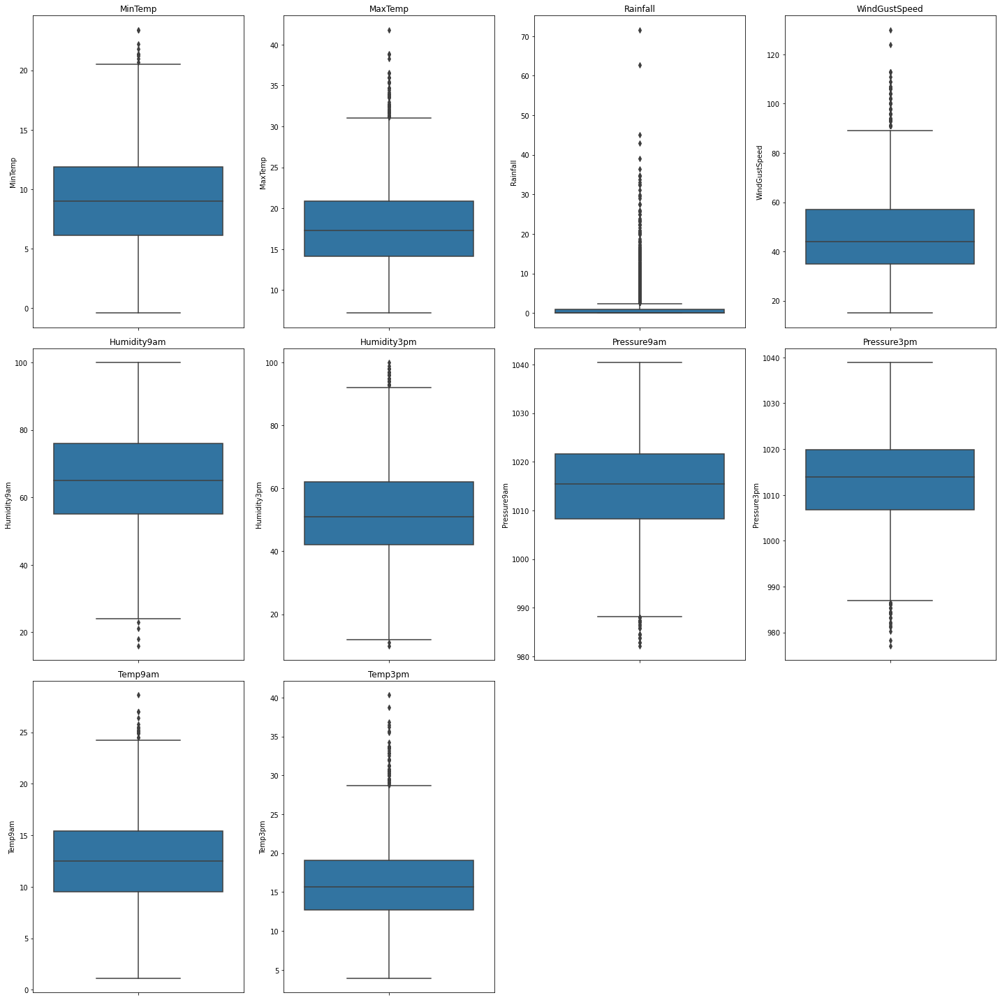

In [228]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Hobart_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [229]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Hobart_df[variable].quantile(0.75) - Hobart_df[variable].quantile(0.25)
    lower_bridge = Hobart_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Hobart_df[variable].quantile(0.75) + (IQR * 1.5)

    Hobart_df = Hobart_df[(Hobart_df[variable] >= lower_bridge) & (Hobart_df[variable] <= upper_bridge)]

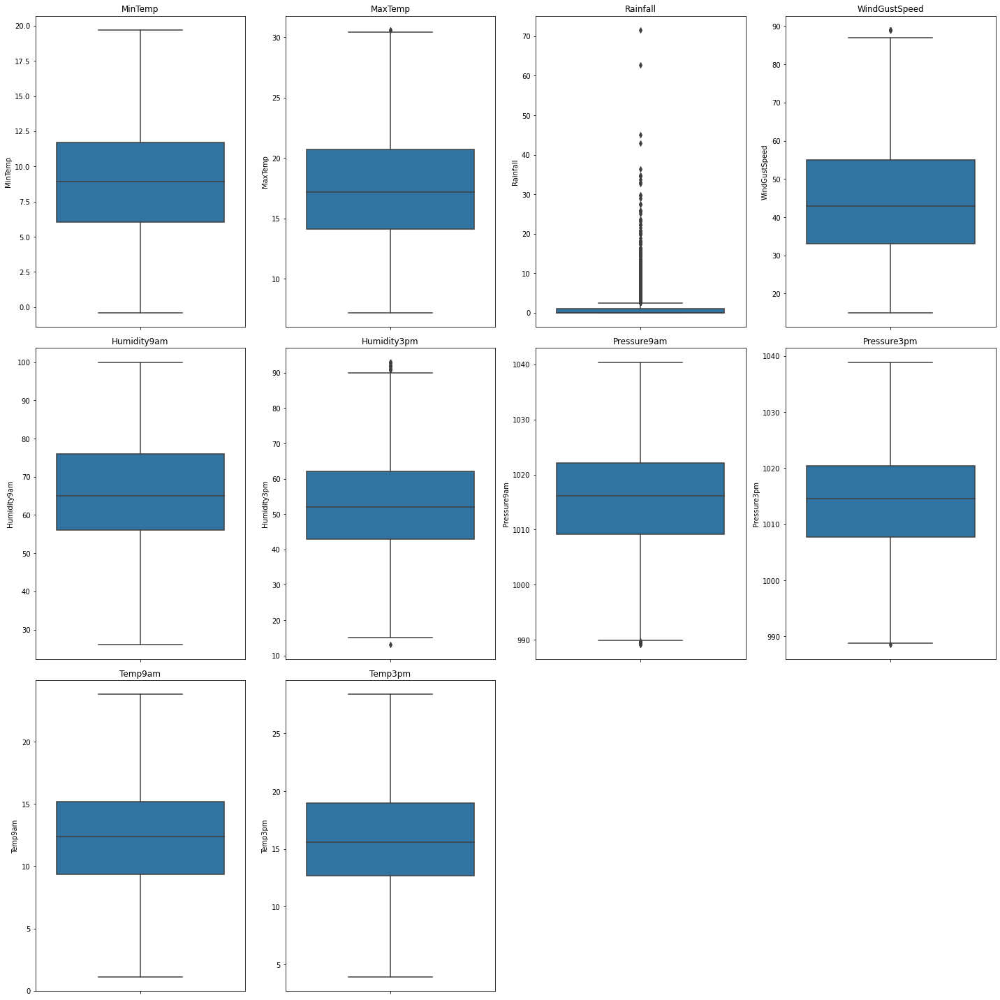

In [230]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data= Hobart_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

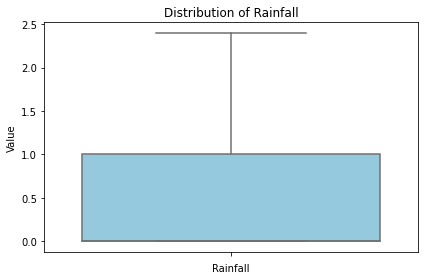

In [231]:
sns.boxplot(data=Hobart_df, y='Rainfall', showfliers=False, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

In [232]:
pct_5 = np.percentile(Hobart_df['Rainfall'], 5)
pct_95 = np.percentile(Hobart_df['Rainfall'], 95)
print(pct_5,pct_95)

0.0 8.539999999999964


In [233]:
Hobart_df['Rainfall'] = np.where(Hobart_df['Rainfall'] > pct_95, pct_95,np.where(Hobart_df['Rainfall'] < pct_5, pct_5, Hobart_df['Rainfall']))

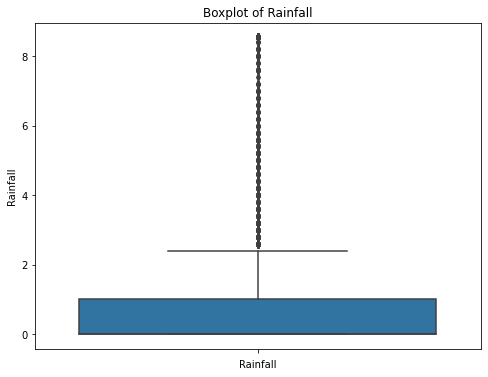

In [234]:
plt.figure(figsize=(8, 6))
sns.boxplot(data = Hobart_df, y='Rainfall')
plt.title('Boxplot of Rainfall')
plt.xlabel('Rainfall')
plt.show()

### Feature Engineering

In [235]:
Hobart_df["RainToday"] = pd.get_dummies(Hobart_df["RainToday"], drop_first = True)
Hobart_df["RainTomorrow"] = pd.get_dummies(Hobart_df["RainTomorrow"], drop_first = True)

In [236]:
for feature in categorical_feature_1:
    print(feature, (Hobart_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2008-07-02', '2011-03-03', '2015-06-18', '2015-06-17', '2015-06-16',
       '2011-02-10', '2011-02-11', '2015-06-09', '2015-06-07', '2011-02-18',
       ...
       '2011-11-16', '2011-11-28', '2011-11-17', '2011-11-19', '2011-11-21',
       '2011-11-22', '2011-11-23', '2011-11-24', '2011-11-25', '2017-06-25'],
      dtype='object', name='Date', length=2987)
Location Index(['Hobart'], dtype='object', name='Location')
WindDir9am Index(['SSE', 'S', 'SSW', 'WNW', 'SE', 'NNE', 'N', 'W', 'NW', 'ESE', 'NNW',
       'SW', 'NE', 'E', 'WSW', 'ENE'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['S', 'SSE', 'ENE', 'SSW', 'W', 'N', 'WNW', 'WSW', 'NE', 'NW', 'NNE',
       'NNW', 'SW', 'E', 'SE', 'ESE'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [237]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}

Hobart_df["WindGustDir"] = Hobart_df["WindGustDir"].map(windgustdir)
Hobart_df["WindDir9am"] = Hobart_df["WindDir9am"].map(winddir9am)
Hobart_df["WindDir3pm"] = Hobart_df["WindDir3pm"].map(winddir3pm)

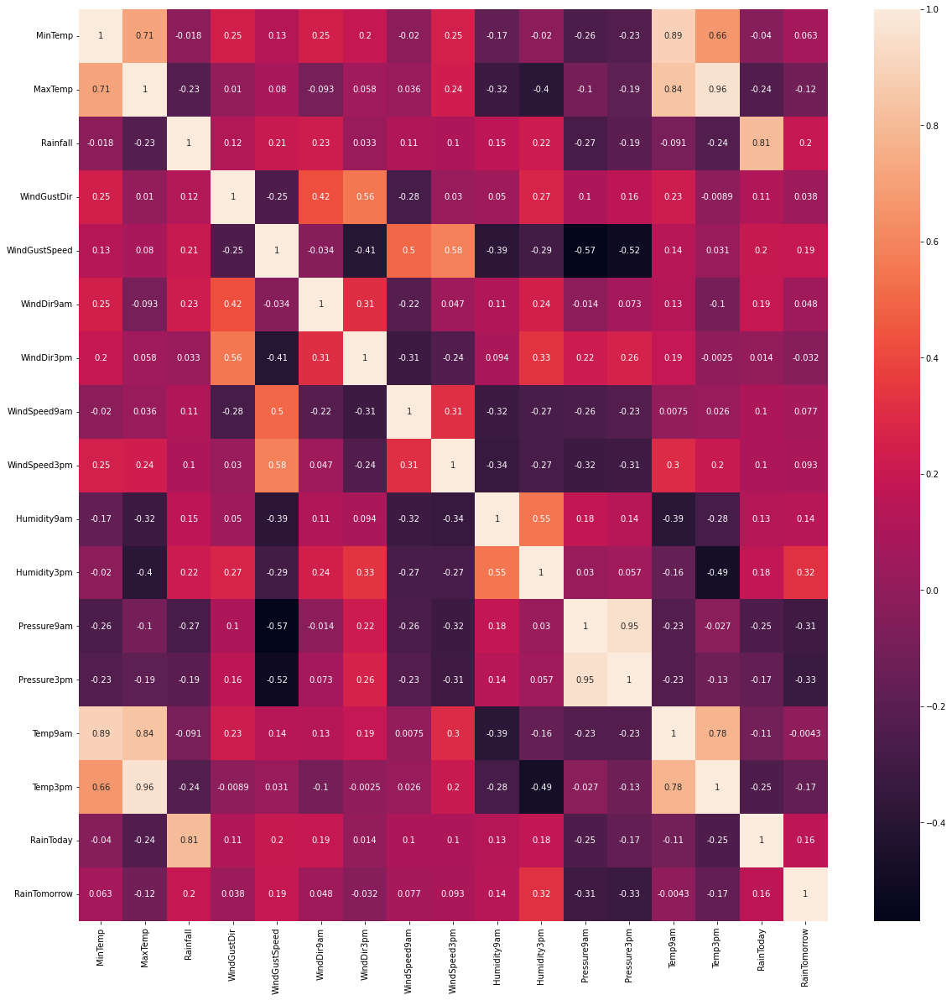

In [238]:
corrmat = Hobart_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [239]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Hobart_df[columns_to_scale] = scaler.fit_transform(Hobart_df[columns_to_scale])

### Model Building

In [240]:
X = Hobart_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Hobart_df['RainTomorrow']

In [241]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [242]:
y_train

132430    0
130679    0
131352    0
132365    1
133001    1
         ..
132320    1
132497    0
132832    0
129999    0
132349    0
Name: RainTomorrow, Length: 2389, dtype: uint8

In [243]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [244]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[444  23]
 [ 84  47]]
0.8210702341137124
              precision    recall  f1-score   support

           0       0.84      0.95      0.89       467
           1       0.67      0.36      0.47       131

    accuracy                           0.82       598
   macro avg       0.76      0.65      0.68       598
weighted avg       0.80      0.82      0.80       598



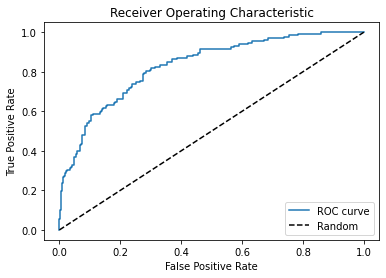

ROC AUC: 0.8304918515128235


In [245]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [246]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [247]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[447  20]
 [ 87  44]]
0.8210702341137124
              precision    recall  f1-score   support

           0       0.84      0.96      0.89       467
           1       0.69      0.34      0.45       131

    accuracy                           0.82       598
   macro avg       0.76      0.65      0.67       598
weighted avg       0.80      0.82      0.80       598



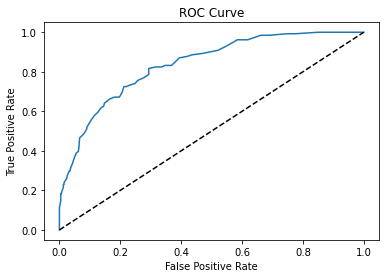

ROC AUC: 0.8364336270166892


In [248]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [249]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [250]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[392  75]
 [ 70  61]]
0.7575250836120402
              precision    recall  f1-score   support

           0       0.85      0.84      0.84       467
           1       0.45      0.47      0.46       131

    accuracy                           0.76       598
   macro avg       0.65      0.65      0.65       598
weighted avg       0.76      0.76      0.76       598



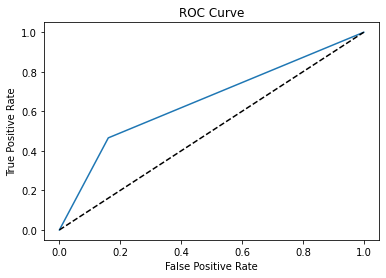

ROC AUC: 0.6525246416136784


In [251]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [252]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [253]:
y_pred = svm.predict(X_test)

# Evaluate the performance
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[467   0]
 [130   1]]
0.782608695652174
              precision    recall  f1-score   support

           0       0.78      1.00      0.88       467
           1       1.00      0.01      0.02       131

    accuracy                           0.78       598
   macro avg       0.89      0.50      0.45       598
weighted avg       0.83      0.78      0.69       598



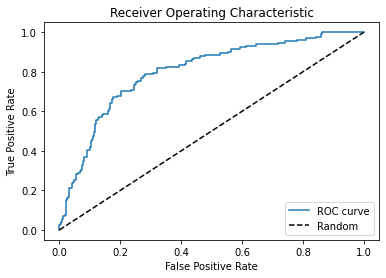

ROC AUC: 0.8009055690864214


In [254]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### 4.Bendigo

In [255]:
Bendigo_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
58142,2008-12-01,Bendigo,9.1,21.7,0.0,W,44.0,WNW,WSW,20.0,20.0,47.0,23.0,1009.1,1007.5,14.0,19.4,No,No
58143,2008-12-02,Bendigo,6.2,23.0,0.0,W,48.0,WNW,WNW,20.0,26.0,49.0,29.0,1010.4,1007.8,15.2,21.2,No,No
58144,2008-12-03,Bendigo,10.8,23.7,0.0,WSW,44.0,SW,W,17.0,24.0,49.0,23.0,1009.4,1010.7,17.1,21.8,No,No
58145,2008-12-04,Bendigo,8.2,24.6,0.0,NNE,41.0,SE,NNE,17.0,13.0,50.0,22.0,1017.0,1012.5,16.1,23.6,No,No
58146,2008-12-05,Bendigo,15.1,30.3,0.2,NW,54.0,NW,W,19.0,31.0,68.0,29.0,1008.0,1005.0,21.3,29.2,No,No


In [256]:
Bendigo_df.isnull().sum()*100/len(Bendigo_df)

Date             0.000000
Location         0.000000
MinTemp          0.065789
MaxTemp          0.164474
Rainfall         0.197368
WindGustDir      1.348684
WindGustSpeed    1.315789
WindDir9am       8.026316
WindDir3pm       1.414474
WindSpeed9am     0.131579
WindSpeed3pm     0.131579
Humidity9am      0.230263
Humidity3pm      0.065789
Pressure9am      0.493421
Pressure3pm      0.328947
Temp9am          0.098684
Temp3pm          0.065789
RainToday        0.197368
RainTomorrow     0.197368
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/1616475679.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Bendigo_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/1616475679.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Bendigo_df[feature], ax=axes[i])
C:

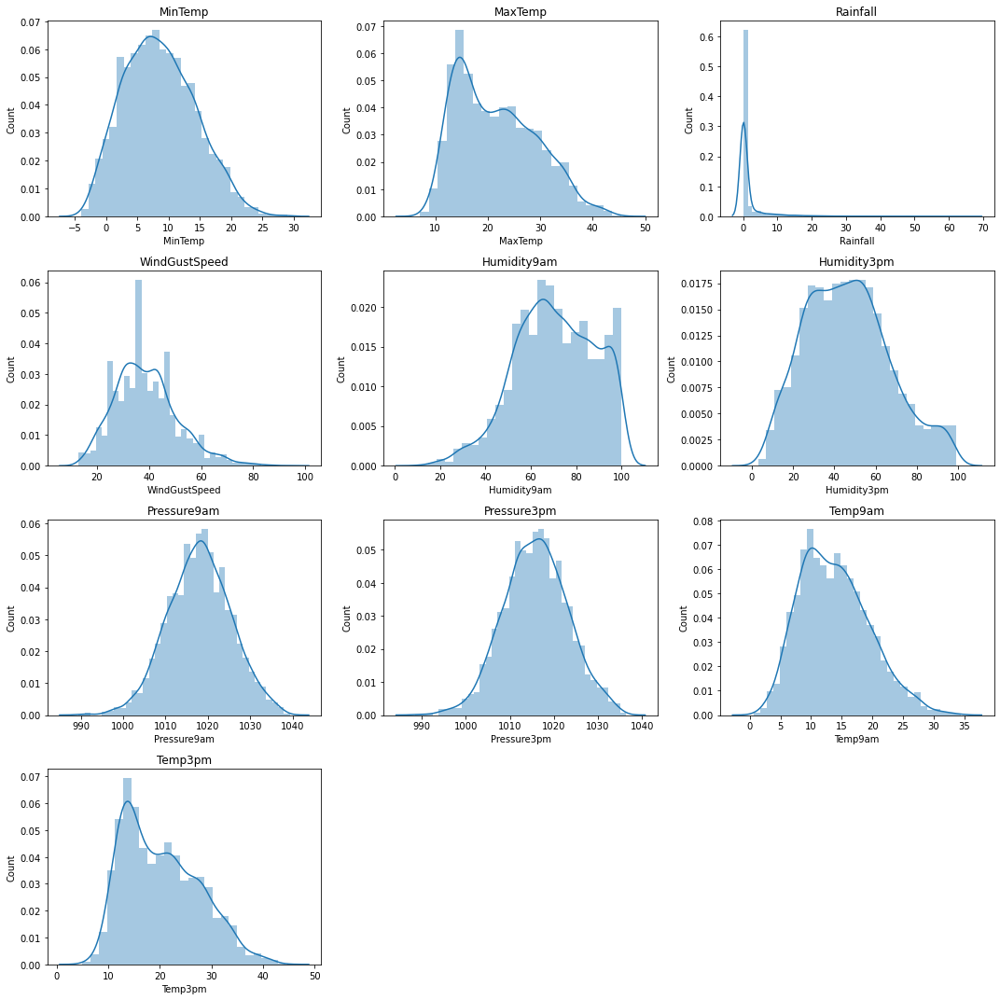

In [257]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Bendigo_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [258]:
for var in continuous_feature:
        if Bendigo_df[var].isnull().sum()*100/len(df) > 0:
                    Bendigo_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [259]:
for var in categorical_feature:
    Bendigo_df[var].fillna(Bendigo_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [260]:
for var in discrete_feature:
    Bendigo_df[var].fillna(Bendigo_df[var].mode().iloc[0], inplace=True)

In [261]:
Bendigo_df.isnull().sum()*100/len(Bendigo_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [262]:
Bendigo_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,8.597928,5.697937,-4.0,4.3,8.2,12.6,29.0
MaxTemp,3040.0,21.621217,7.615460,7.1,15.1,20.6,27.3,45.4
Rainfall,3040.0,1.616184,5.180463,0.0,0.0,0.0,0.4,66.4
WindGustSpeed,3040.0,38.904605,12.047022,13.0,31.0,39.0,46.0,94.0
WindSpeed9am,3040.0,12.933553,7.245531,0.0,9.0,13.0,17.0,52.0
WindSpeed3pm,3040.0,17.153618,7.552978,0.0,11.0,17.0,22.0,50.0
Humidity9am,3040.0,70.544408,17.461696,11.0,58.0,70.0,84.0,100.0
Humidity3pm,3040.0,46.489145,20.472533,3.0,31.0,45.0,60.0,99.0
Pressure9am,3040.0,1018.028125,7.424340,989.5,1013.0,1018.1,1023.1,1039.3
Pressure3pm,3040.0,1015.874868,7.261303,988.6,1011.1,1015.9,1020.7,1036.3


### Outlier Handling

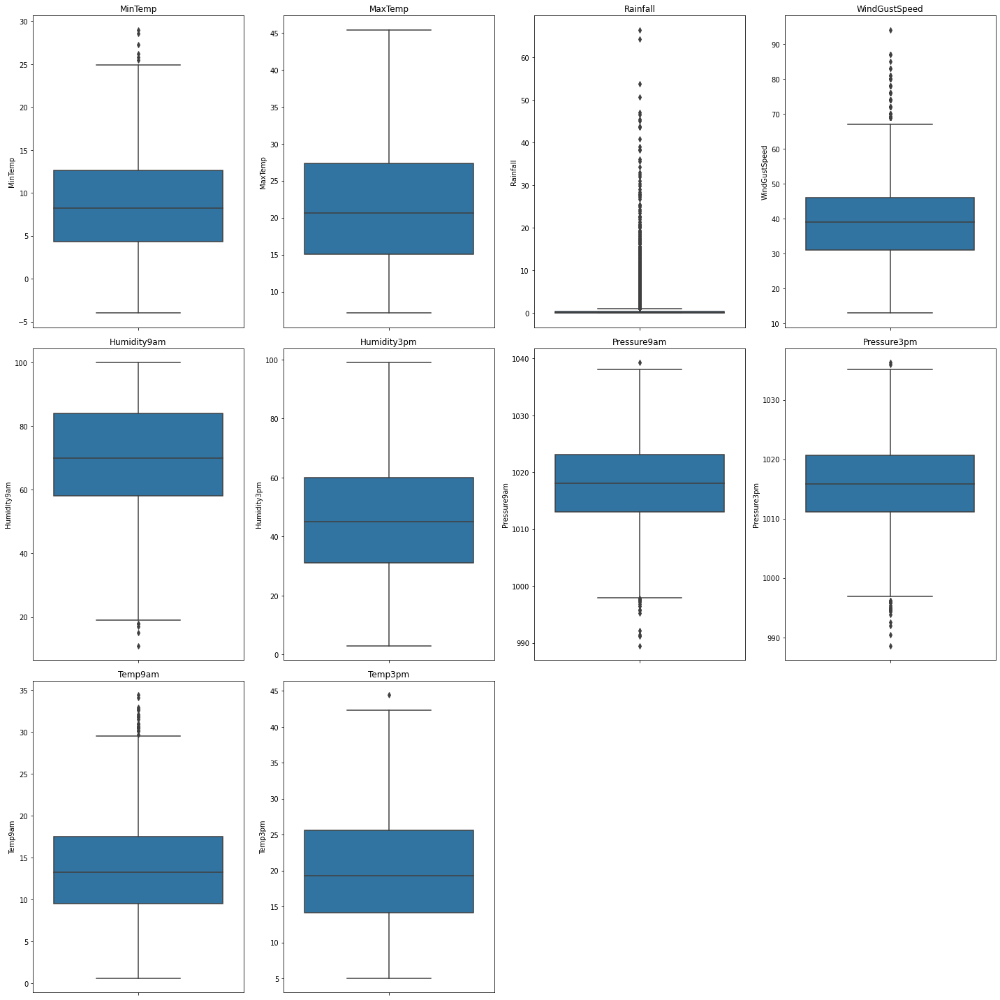

In [263]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Bendigo_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [264]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Bendigo_df[variable].quantile(0.75) - Bendigo_df[variable].quantile(0.25)
    lower_bridge = Bendigo_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Bendigo_df[variable].quantile(0.75) + (IQR * 1.5)

    Bendigo_df = Bendigo_df[(Bendigo_df[variable] >= lower_bridge) & (Bendigo_df[variable] <= upper_bridge)]

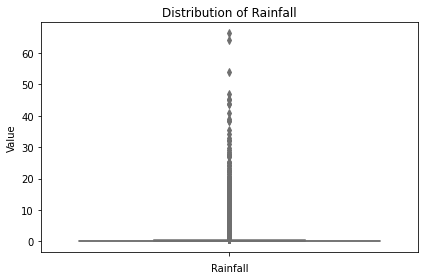

In [265]:
sns.boxplot(data=Bendigo_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

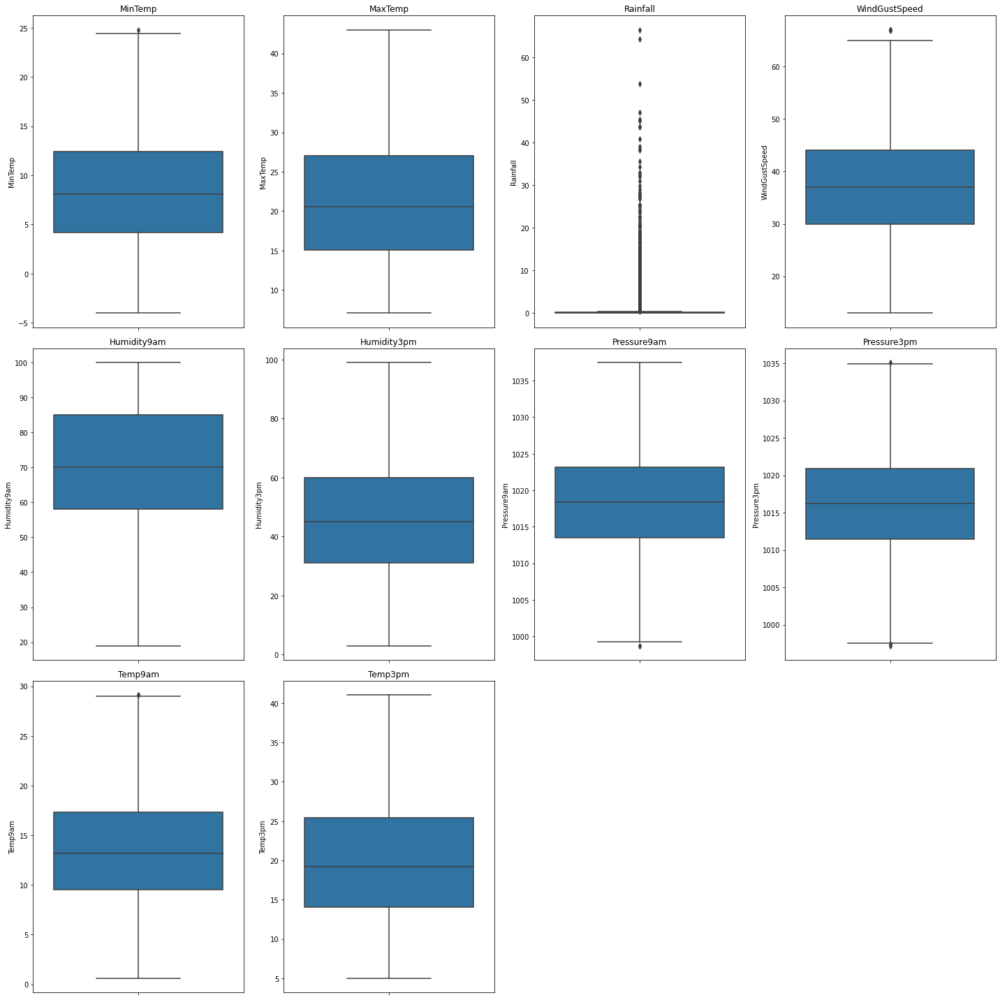

In [266]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Bendigo_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [267]:
pct_5 = np.percentile(Bendigo_df['Rainfall'], 5)
pct_95 = np.percentile(Bendigo_df['Rainfall'], 95)
print(pct_5,pct_95)

0.0 9.4


In [268]:
Bendigo_df['Rainfall'] = np.where(Bendigo_df['Rainfall'] > pct_95, pct_95,np.where(Bendigo_df['Rainfall'] < pct_5, pct_5, Bendigo_df['Rainfall']))

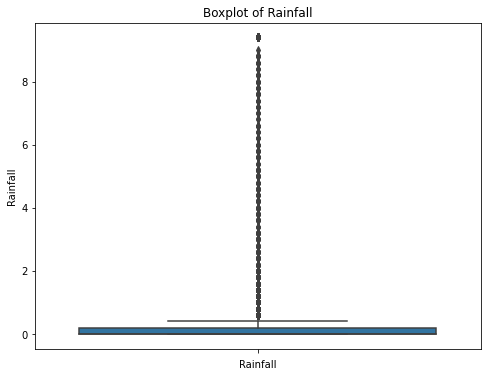

In [269]:
plt.figure(figsize=(8, 6))
sns.boxplot(data = Bendigo_df, y='Rainfall')
plt.title('Boxplot of Rainfall')
plt.xlabel('Rainfall')
plt.show()

### Feature Engineering

In [270]:
Bendigo_df["RainToday"] = pd.get_dummies(Bendigo_df["RainToday"], drop_first = True)
Bendigo_df["RainTomorrow"] = pd.get_dummies(Bendigo_df["RainTomorrow"], drop_first = True)

In [271]:
for feature in categorical_feature_1:
    print(feature, (Bendigo_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-04-22', '2014-07-29', '2010-05-28', '2010-05-29', '2012-08-04',
       '2014-07-23', '2014-07-25', '2010-06-08', '2010-06-09', '2016-03-17',
       ...
       '2012-01-22', '2012-02-01', '2012-01-23', '2012-01-24', '2012-01-25',
       '2012-01-26', '2012-01-27', '2012-01-28', '2012-01-31', '2017-06-25'],
      dtype='object', name='Date', length=2939)
Location Index(['Bendigo'], dtype='object', name='Location')
WindDir9am Index(['N', 'NW', 'NNE', 'NNW', 'ENE', 'NE', 'WNW', 'E', 'W', 'ESE', 'SE',
       'SSE', 'WSW', 'SW', 'SSW', 'S'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['ENE', 'E', 'NNE', 'NNW', 'NE', 'N', 'WNW', 'NW', 'ESE', 'WSW', 'W',
       'SE', 'S', 'SW', 'SSW', 'SSE'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [272]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}

Bendigo_df["WindGustDir"] = Bendigo_df["WindGustDir"].map(windgustdir)
Bendigo_df["WindDir9am"] = Bendigo_df["WindDir9am"].map(winddir9am)
Bendigo_df["WindDir3pm"] = Bendigo_df["WindDir3pm"].map(winddir3pm)

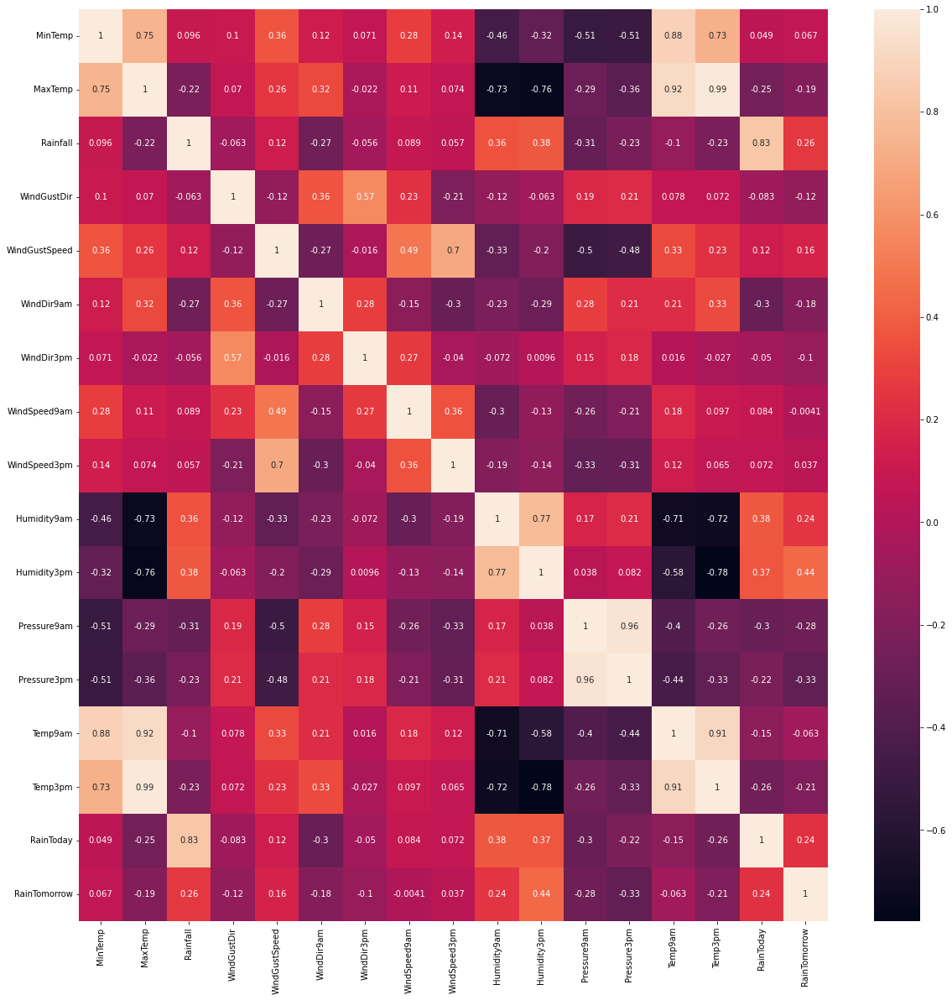

In [273]:
corrmat = Bendigo_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [274]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Bendigo_df[columns_to_scale] = scaler.fit_transform(Bendigo_df[columns_to_scale])

### Model Building

In [275]:
X = Bendigo_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Bendigo_df['RainTomorrow']

In [276]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [277]:
y_train

59944    0
59341    0
59411    1
60597    0
60618    0
        ..
58324    1
60039    1
60171    0
59290    0
60570    0
Name: RainTomorrow, Length: 2351, dtype: uint8

In [278]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [279]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[469  14]
 [ 44  61]]
0.9013605442176871
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       483
           1       0.81      0.58      0.68       105

    accuracy                           0.90       588
   macro avg       0.86      0.78      0.81       588
weighted avg       0.90      0.90      0.89       588



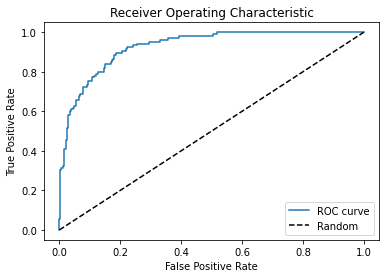

ROC AUC: 0.927891156462585


In [280]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [281]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [282]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[465  18]
 [ 49  56]]
0.8860544217687075
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       483
           1       0.76      0.53      0.63       105

    accuracy                           0.89       588
   macro avg       0.83      0.75      0.78       588
weighted avg       0.88      0.89      0.88       588



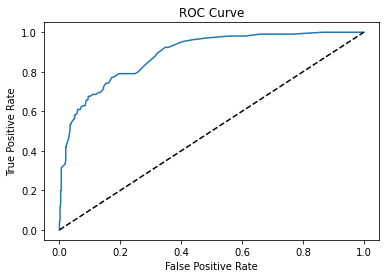

ROC AUC: 0.8887114265996253


In [283]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [284]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [285]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[431  52]
 [ 50  55]]
0.826530612244898
              precision    recall  f1-score   support

           0       0.90      0.89      0.89       483
           1       0.51      0.52      0.52       105

    accuracy                           0.83       588
   macro avg       0.71      0.71      0.71       588
weighted avg       0.83      0.83      0.83       588



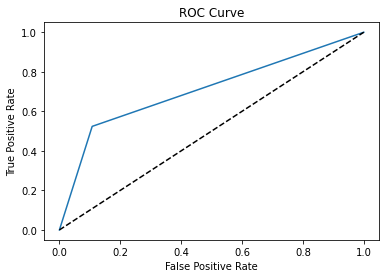

ROC AUC: 0.7080745341614907


In [286]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [287]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [288]:
y_pred = svm.predict(X_test)

# Evaluate the performance
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[483   0]
 [103   2]]
0.8248299319727891
              precision    recall  f1-score   support

           0       0.82      1.00      0.90       483
           1       1.00      0.02      0.04       105

    accuracy                           0.82       588
   macro avg       0.91      0.51      0.47       588
weighted avg       0.86      0.82      0.75       588



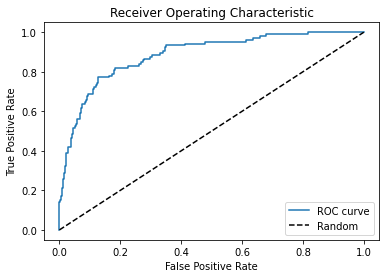

ROC AUC: 0.8853002070393375


In [289]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### 5. Brisbane

In [290]:
Brisbane_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
84007,2008-07-01,Brisbane,10.3,25.2,0.0,WNW,26.0,SSW,W,6.0,15.0,81.0,37.0,1019.6,1014.8,14.9,24.6,No,No
84008,2008-07-02,Brisbane,8.1,22.9,0.0,W,30.0,W,WNW,15.0,19.0,41.0,30.0,1018.8,1015.0,16.2,22.4,No,No
84009,2008-07-03,Brisbane,9.7,22.4,0.0,E,22.0,SW,E,7.0,15.0,55.0,52.0,1021.4,1019.1,15.4,21.3,No,No
84010,2008-07-04,Brisbane,11.8,20.0,0.8,SW,24.0,SW,SSE,9.0,7.0,76.0,53.0,1023.5,1021.7,14.1,19.6,No,No
84011,2008-07-05,Brisbane,12.3,16.7,0.0,S,37.0,S,SSW,11.0,7.0,81.0,89.0,1027.3,1026.2,16.1,15.0,No,Yes


In [291]:
Brisbane_df.isnull().sum()*100/len(Brisbane_df)

Date             0.000000
Location         0.000000
MinTemp          0.281867
MaxTemp          0.438459
Rainfall         1.002192
WindGustDir      1.284059
WindGustSpeed    1.284059
WindDir9am       2.192296
WindDir3pm       1.064829
WindSpeed9am     0.031319
WindSpeed3pm     0.250548
Humidity9am      0.125274
Humidity3pm      0.469778
Pressure9am      0.031319
Pressure3pm      0.250548
Temp9am          0.125274
Temp3pm          0.469778
RainToday        1.002192
RainTomorrow     1.002192
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/4235724842.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Brisbane_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_29260/4235724842.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Brisbane_df[feature], ax=axes[i])


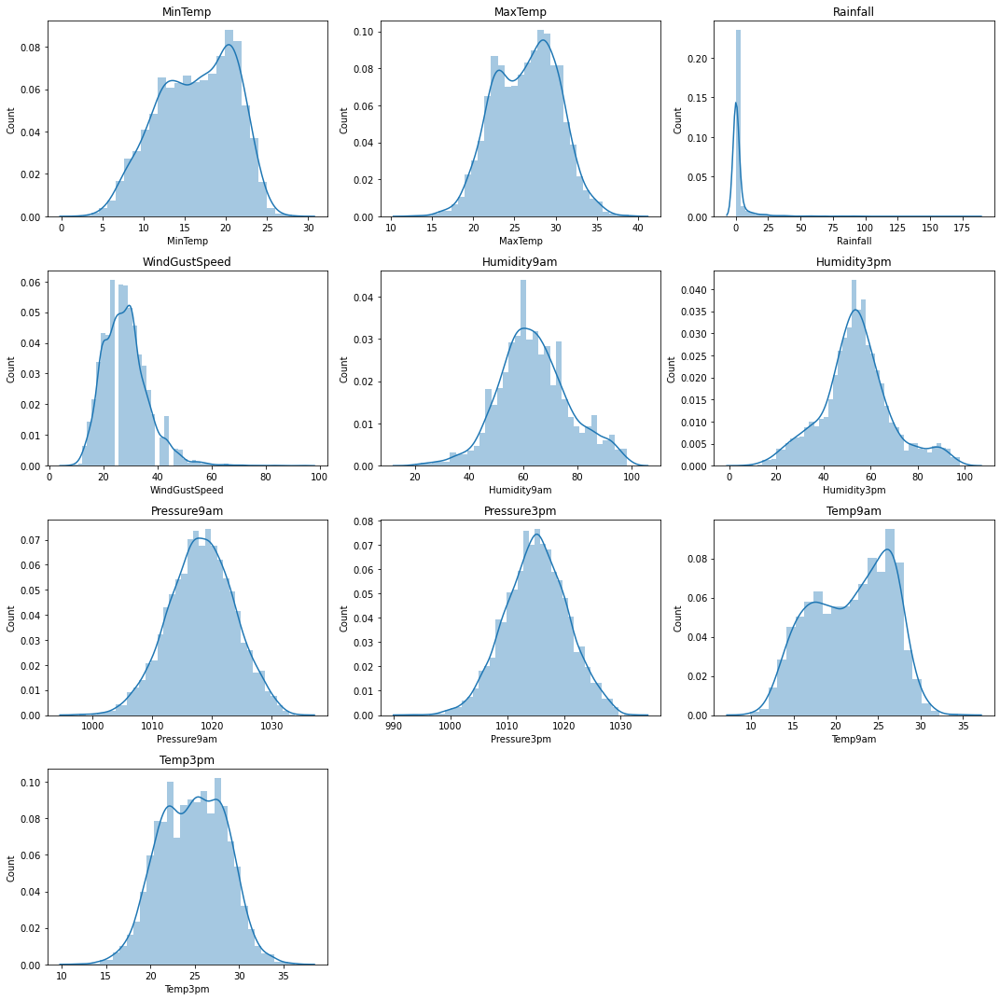

In [292]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Brisbane_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [293]:
for var in continuous_feature:
            if Brisbane_df[var].isnull().sum()*100/len(df) > 0:
                   Brisbane_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [294]:
for var in categorical_feature:
    Brisbane_df[var].fillna(Brisbane_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [295]:
for var in discrete_feature:
    Brisbane_df[var].fillna(Brisbane_df[var].mode().iloc[0], inplace=True)

In [296]:
Brisbane_df.isnull().sum()*100/len(Brisbane_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [297]:
Brisbane_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3193.0,16.419793,4.610688,2.6,12.8,16.8,20.3,28.0
MaxTemp,3193.0,26.425806,3.902368,12.6,23.4,26.7,29.3,38.9
Rainfall,3193.0,3.113373,11.504067,0.0,0.0,0.0,0.6,182.6
WindGustSpeed,3193.0,28.402756,8.434252,9.0,22.0,28.0,33.0,93.0
WindSpeed9am,3193.0,6.943940,3.750145,0.0,4.0,6.0,9.0,37.0
WindSpeed3pm,3193.0,10.998747,4.470594,0.0,7.0,11.0,13.0,28.0
Humidity9am,3193.0,64.051049,13.163692,20.0,56.0,63.0,72.0,98.0
Humidity3pm,3193.0,53.983088,14.958936,8.0,46.0,54.0,62.0,98.0
Pressure9am,3193.0,1018.233041,5.472398,997.8,1014.6,1018.3,1022.0,1033.9
Pressure3pm,3193.0,1015.102537,5.496673,993.2,1011.5,1015.2,1018.8,1031.5


### Outlier Handling

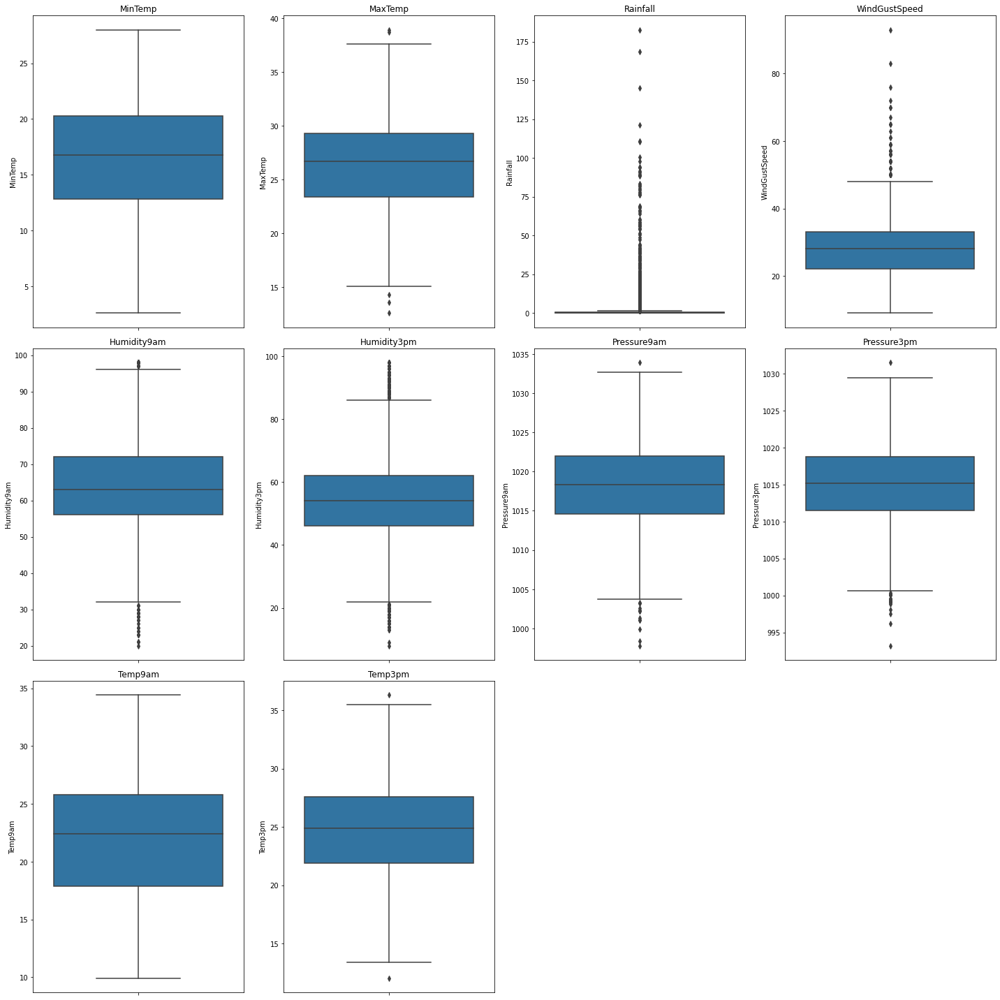

In [298]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Brisbane_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [299]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Brisbane_df[variable].quantile(0.75) - Brisbane_df[variable].quantile(0.25)
    lower_bridge = Brisbane_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Brisbane_df[variable].quantile(0.75) + (IQR * 1.5)

    Brisbane_df = Brisbane_df[(Brisbane_df[variable] >= lower_bridge) & (Brisbane_df[variable] <= upper_bridge)]

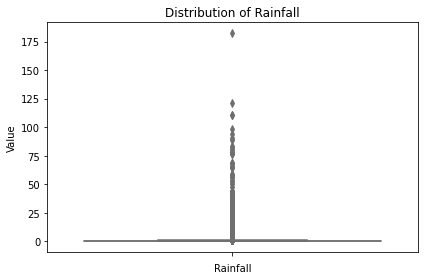

In [300]:
sns.boxplot(data=Brisbane_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

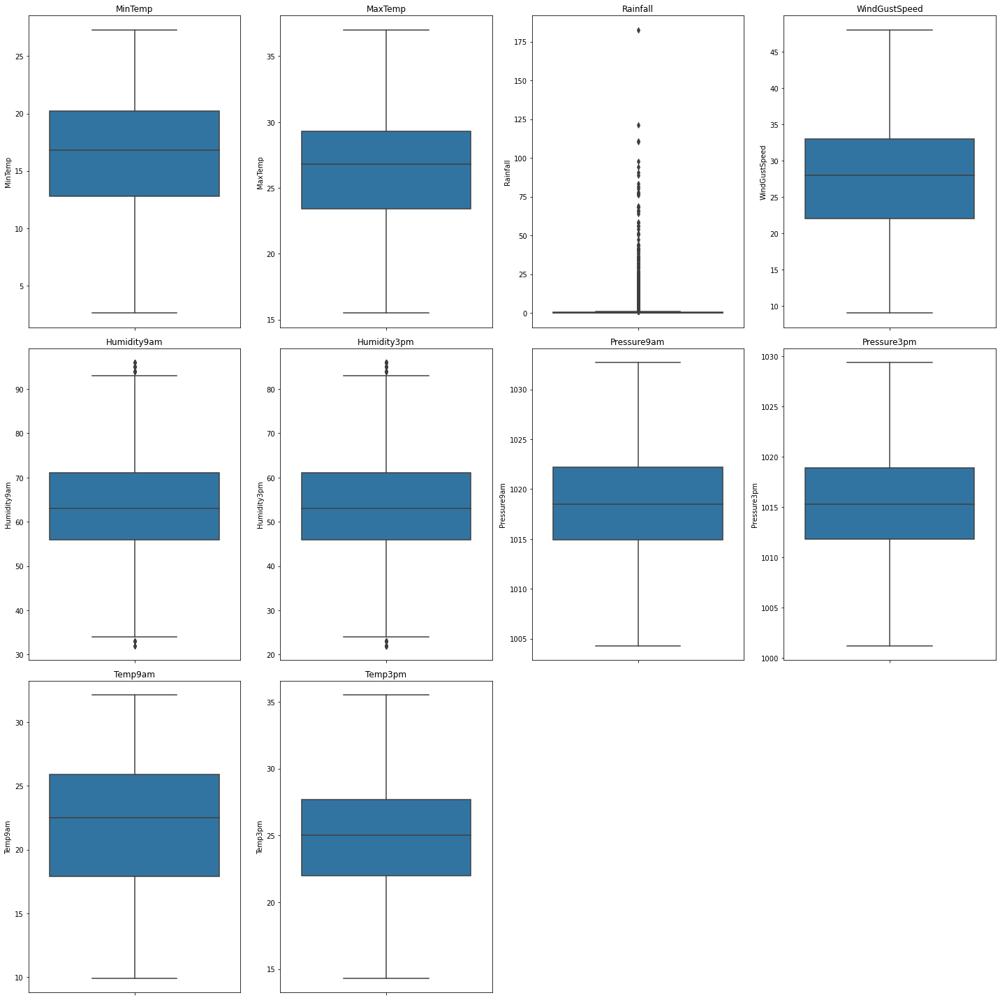

In [301]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Brisbane_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [302]:
pct_5 = np.percentile(Brisbane_df['Rainfall'], 5)
pct_95 = np.percentile(Brisbane_df['Rainfall'], 95)
print(pct_5,pct_95)

0.0 13.719999999999983


In [303]:
Brisbane_df['Rainfall'] = np.where(Brisbane_df['Rainfall'] > pct_95, pct_95,np.where(Brisbane_df['Rainfall'] < pct_5, pct_5, Brisbane_df['Rainfall']))

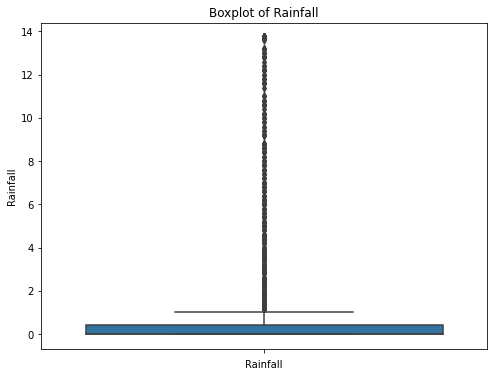

In [304]:
plt.figure(figsize=(8, 6))
sns.boxplot(data = Brisbane_df, y='Rainfall')
plt.title('Boxplot of Rainfall')
plt.xlabel('Rainfall')
plt.show()

### Feature Engineering

In [305]:
Brisbane_df["RainToday"] = pd.get_dummies(Brisbane_df["RainToday"], drop_first = True)
Brisbane_df["RainTomorrow"] = pd.get_dummies(Brisbane_df["RainTomorrow"], drop_first = True)

In [306]:
for feature in categorical_feature:
    print(feature, (Brisbane_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-03-08', '2016-06-14', '2009-10-28', '2010-11-17', '2015-08-27',
       '2016-06-18', '2011-12-08', '2014-05-21', '2016-06-15', '2016-06-12',
       ...
       '2011-11-17', '2011-11-29', '2011-11-18', '2011-11-19', '2011-11-20',
       '2011-11-21', '2011-11-22', '2011-11-25', '2011-11-27', '2017-06-25'],
      dtype='object', name='Date', length=2929)
Location Index(['Brisbane'], dtype='object', name='Location')
WindGustDir Index(['S', 'SE', 'SSE', 'NNW', 'SSW', 'ESE', 'SW', 'N', 'E', 'ENE', 'NE',
       'WSW', 'WNW', 'NW', 'NNE', 'W'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['N', 'S', 'SSE', 'NNW', 'NNE', 'SE', 'ESE', 'ENE', 'E', 'NE', 'WNW',
       'NW', 'SSW', 'SW', 'W', 'WSW'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['SSE', 'SE', 'N', 'NNW', 'ESE', 'NW', 'NNE', 'E', 'ENE', 'NE', 'S',
       'SW', 'SSW', 'WNW', 'WSW', 'W'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday'

In [307]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}

Brisbane_df["WindGustDir"] = Brisbane_df["WindGustDir"].map(windgustdir)
Brisbane_df["WindDir9am"] = Brisbane_df["WindDir9am"].map(winddir9am)
Brisbane_df["WindDir3pm"] = Brisbane_df["WindDir3pm"].map(winddir3pm)

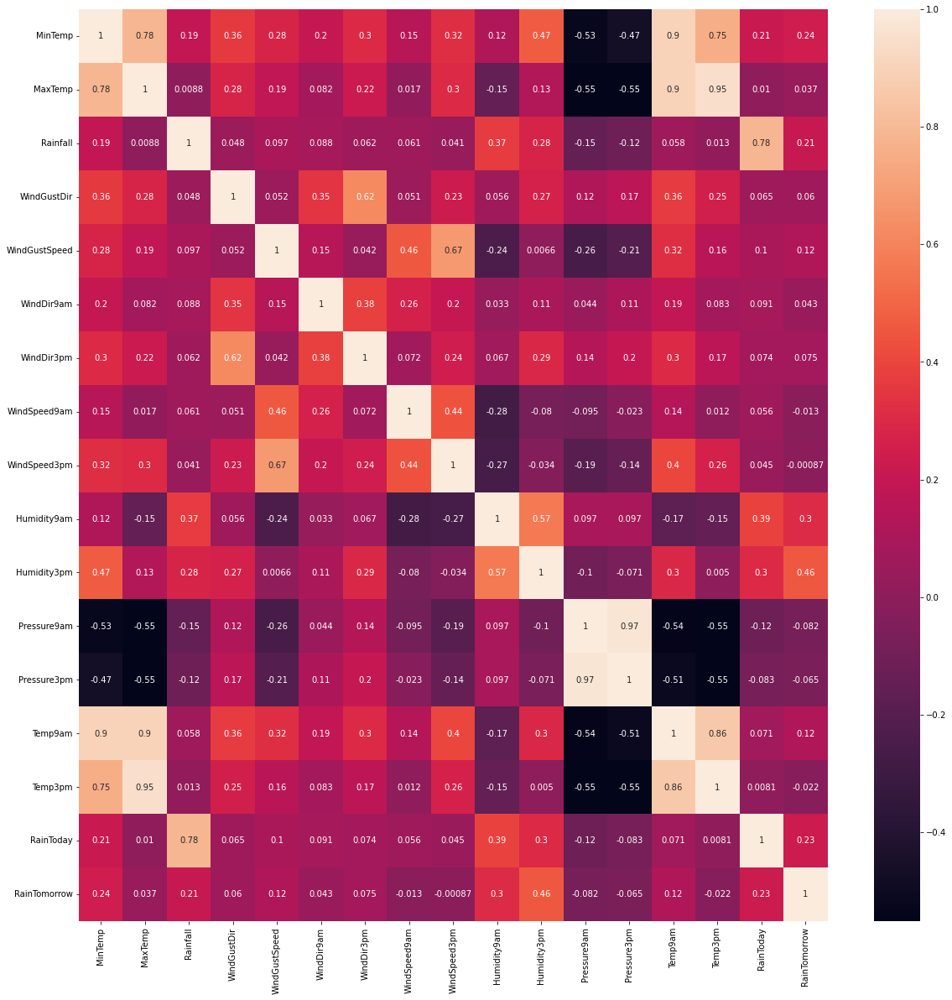

In [308]:
corrmat = Brisbane_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [309]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Brisbane_df[columns_to_scale] = scaler.fit_transform(Brisbane_df[columns_to_scale])

### Model Building

In [310]:
X = Brisbane_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Brisbane_df['RainTomorrow']

In [311]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [312]:
y_train

84560    0
84339    1
86871    0
84661    0
84491    1
        ..
84230    0
86450    0
86310    0
85833    0
86022    0
Name: RainTomorrow, Length: 2343, dtype: uint8

In [313]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [314]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[457  15]
 [ 69  45]]
0.856655290102389
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       472
           1       0.75      0.39      0.52       114

    accuracy                           0.86       586
   macro avg       0.81      0.68      0.72       586
weighted avg       0.85      0.86      0.84       586



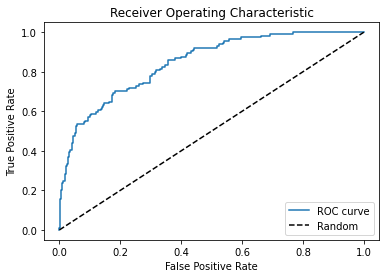

ROC AUC: 0.8453389830508474


In [315]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [316]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [317]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[453  19]
 [ 71  43]]
0.8464163822525598
              precision    recall  f1-score   support

           0       0.86      0.96      0.91       472
           1       0.69      0.38      0.49       114

    accuracy                           0.85       586
   macro avg       0.78      0.67      0.70       586
weighted avg       0.83      0.85      0.83       586



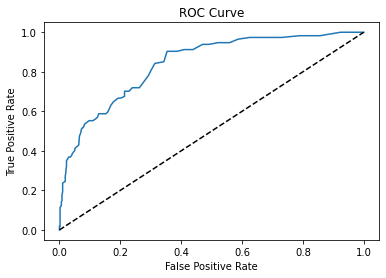

ROC AUC: 0.8403304341361879


In [318]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [319]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [320]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[399  73]
 [ 70  44]]
0.7559726962457338
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       472
           1       0.38      0.39      0.38       114

    accuracy                           0.76       586
   macro avg       0.61      0.62      0.61       586
weighted avg       0.76      0.76      0.76       586



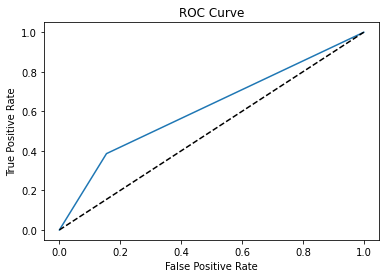

ROC AUC: 0.6156519476657746


In [321]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [323]:
svm = SVC(random_state=0)
svm.fit(X_train, y_train)

SVC(random_state=0)

In [324]:
y_pred = svm.predict(X_test)

# Evaluate the performance
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[472   0]
 [114   0]]
0.8054607508532423
              precision    recall  f1-score   support

           0       0.81      1.00      0.89       472
           1       0.00      0.00      0.00       114

    accuracy                           0.81       586
   macro avg       0.40      0.50      0.45       586
weighted avg       0.65      0.81      0.72       586



C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


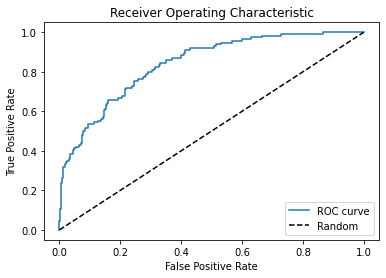

ROC AUC: 0.8402839726434731


In [325]:
y_pred_proba = svm.decision_function(X_test)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### 6. Canberra

In [322]:
Canberra_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
45587,2007-11-01,Canberra,8.0,24.3,0.0,NW,30.0,SW,NW,6.0,20.0,68.0,29.0,1019.7,1015.0,14.4,23.6,No,Yes
45588,2007-11-02,Canberra,14.0,26.9,3.6,ENE,39.0,E,W,4.0,17.0,80.0,36.0,1012.4,1008.4,17.5,25.7,Yes,Yes
45589,2007-11-03,Canberra,13.7,23.4,3.6,NW,85.0,N,NNE,6.0,6.0,82.0,69.0,1009.5,1007.2,15.4,20.2,Yes,Yes
45590,2007-11-04,Canberra,13.3,15.5,39.8,NW,54.0,WNW,W,30.0,24.0,62.0,56.0,1005.5,1007.0,13.5,14.1,Yes,Yes
45591,2007-11-05,Canberra,7.6,16.1,2.8,SSE,50.0,SSE,ESE,20.0,28.0,68.0,49.0,1018.3,1018.5,11.1,15.4,Yes,No


In [207]:
Canberra_df.isnull().sum()*100/len(Canberra_df)

Date              0.000000
Location          0.000000
MinTemp           0.174622
MaxTemp           0.087311
Rainfall          0.523865
WindGustDir       9.866123
WindGustSpeed     9.807916
WindDir9am       15.745052
WindDir3pm        6.635623
WindSpeed9am      6.664726
WindSpeed3pm      6.490105
Humidity9am       1.833527
Humidity3pm       0.349243
Pressure9am       6.577416
Pressure3pm       6.431898
Temp9am           0.523865
Temp3pm           0.203725
RainToday         0.523865
RainTomorrow      0.523865
dtype: float64

In [208]:
Canberra_df.drop(['WindDir9am'], axis=1, inplace=True)

#### Continuous features

C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

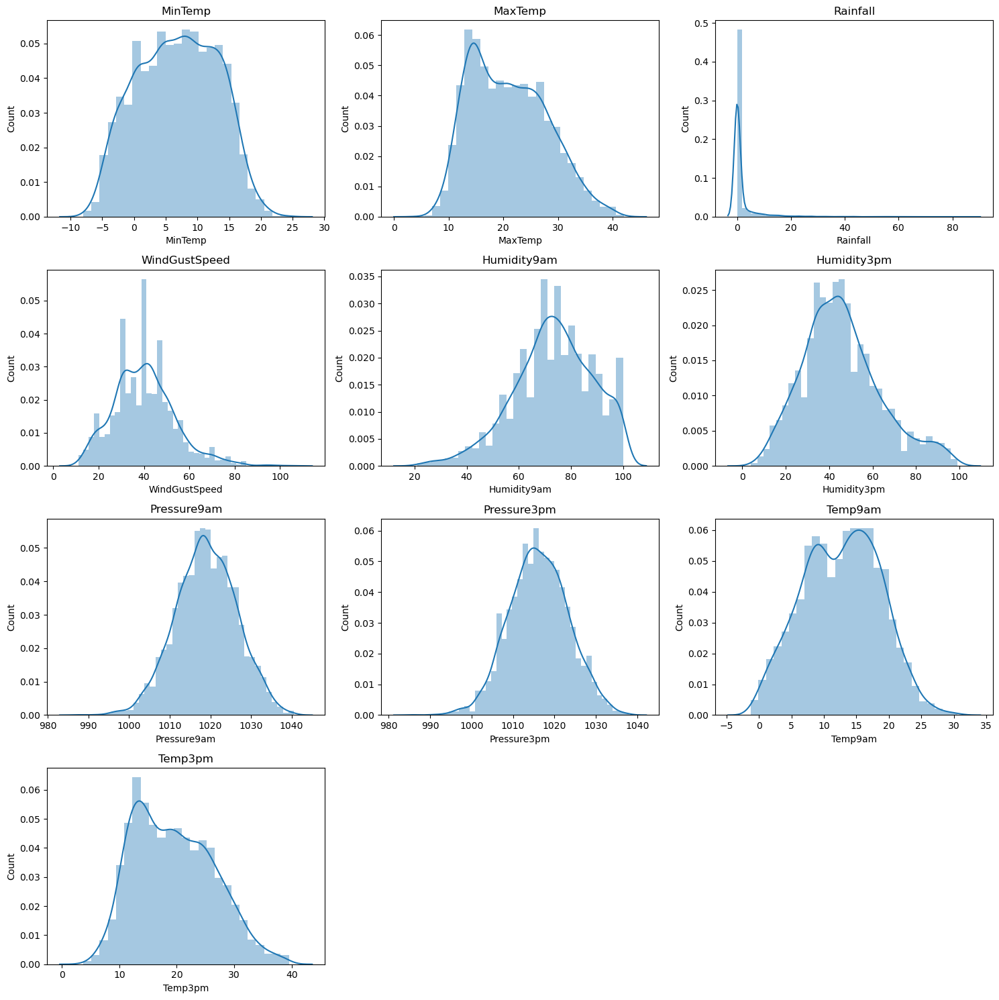

In [209]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Canberra_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [210]:
for var in continuous_feature:
    if Canberra_df[var].isnull().sum()*100/len(df) > 0:
                Canberra_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [211]:
categorical_feature_1 = [feat for feat in categorical_feature if feat != 'WindDir9am']
for var in categorical_feature_1:
    Canberra_df[var].fillna(Canberra_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [212]:
for var in discrete_feature:
    Canberra_df[var].fillna(Canberra_df[var].mode().iloc[0], inplace=True)

In [213]:
Canberra_df.isnull().sum()*100/len(Canberra_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [214]:
Canberra_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3436.0,6.836147,6.246839,-8.0,1.8,7.0,11.9,24.4
MaxTemp,3436.0,20.976921,6.989825,4.1,15.0,20.4,26.2,42.0
Rainfall,3436.0,1.732596,5.709851,0.0,0.0,0.0,0.2,87.0
WindGustSpeed,3436.0,40.352154,12.897106,11.0,31.0,41.0,46.0,106.0
WindSpeed9am,3436.0,10.113795,8.260576,0.0,6.0,7.0,13.0,54.0
WindSpeed3pm,3436.0,18.730210,8.854951,0.0,13.0,17.0,26.0,56.0
Humidity9am,3436.0,73.159488,14.999472,21.0,64.0,73.5,84.0,100.0
Humidity3pm,3436.0,45.906286,18.087060,4.0,34.0,44.0,56.0,99.0
Pressure9am,3436.0,1018.947905,7.237487,987.4,1014.4,1018.4,1023.7,1040.6
Pressure3pm,3436.0,1016.246828,6.906208,985.5,1011.8,1016.4,1020.8,1037.9


### Outlier Handling

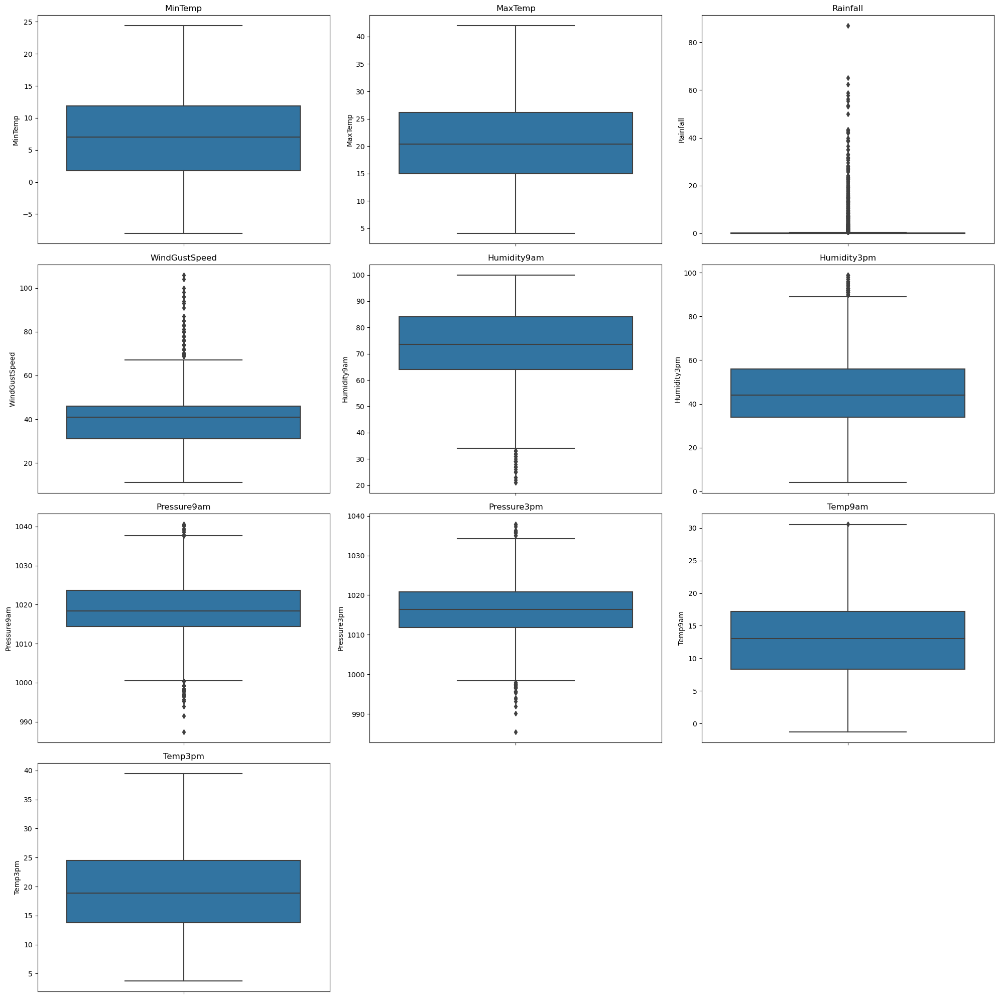

In [215]:
num_cols = 3
num_rows = 4

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Canberra_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [216]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Canberra_df[variable].quantile(0.75) - Canberra_df[variable].quantile(0.25)
    lower_bridge = Canberra_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Canberra_df[variable].quantile(0.75) + (IQR * 1.5)

    Canberra_df = Canberra_df[(Canberra_df[variable] >= lower_bridge) & (Canberra_df[variable] <= upper_bridge)]

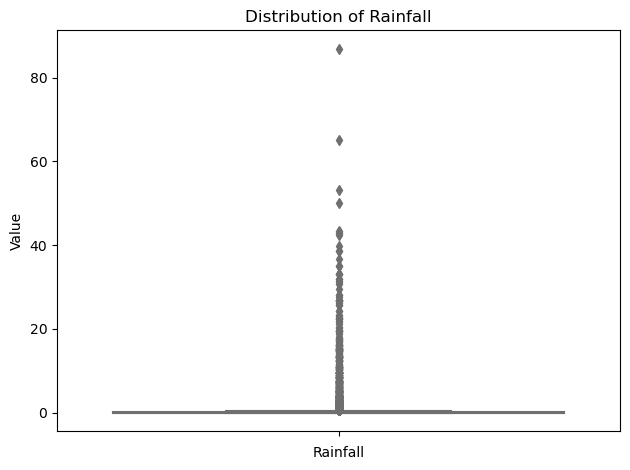

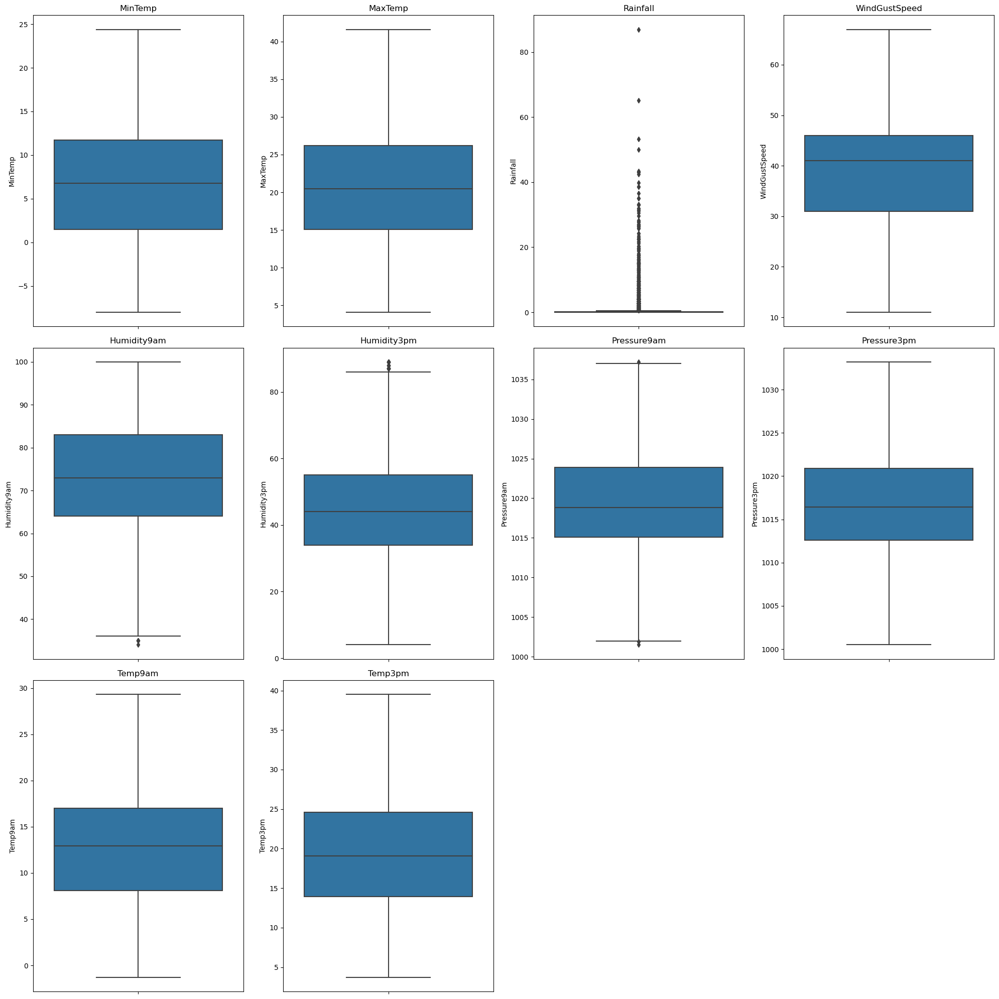

In [217]:
sns.boxplot(data=Canberra_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Canberra_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [218]:
pct_5 = np.percentile(Canberra_df['Rainfall'], 5)
pct_95 = np.percentile(Canberra_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 9.0


In [219]:
Canberra_df['Rainfall'] = np.where(Canberra_df['Rainfall'] > pct_95, pct_95,np.where(Canberra_df['Rainfall'] < pct_5, pct_5, Canberra_df['Rainfall']))

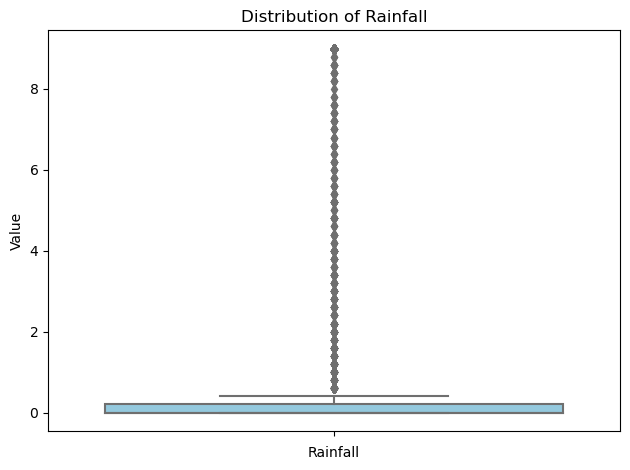

In [220]:
sns.boxplot(data=Canberra_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [221]:
Canberra_df["RainToday"] = pd.get_dummies(Canberra_df["RainToday"], drop_first = True)
Canberra_df["RainTomorrow"] = pd.get_dummies(Canberra_df["RainTomorrow"], drop_first = True)

In [222]:
for feature in categorical_feature_1:
    print(feature, (Canberra_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2007-11-01', '2016-01-27', '2016-01-25', '2016-01-23', '2016-01-22',
       '2011-10-25', '2011-10-24', '2014-03-08', '2009-06-20', '2009-06-21',
       ...
       '2011-03-31', '2011-03-23', '2011-03-24', '2011-03-25', '2011-03-26',
       '2011-03-27', '2011-03-28', '2011-03-29', '2011-03-30', '2017-06-25'],
      dtype='object', name='Date', length=3168)
Location Index(['Canberra'], dtype='object', name='Location')
WindGustDir Index(['W', 'ESE', 'SSW', 'SW', 'NE', 'NNW', 'N', 'NNE', 'NW', 'WSW', 'E',
       'SSE', 'ENE', 'S', 'SE', 'WNW'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['SSE', 'ENE', 'NE', 'W', 'NW', 'WSW', 'ESE', 'E', 'NNE', 'SSW', 'N',
       'SW', 'NNW', 'SE', 'WNW', 'S'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [223]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Canberra_df["WindGustDir"] = Canberra_df["WindGustDir"].map(windgustdir)
Canberra_df["WindDir3pm"] = Canberra_df["WindDir3pm"].map(winddir3pm)

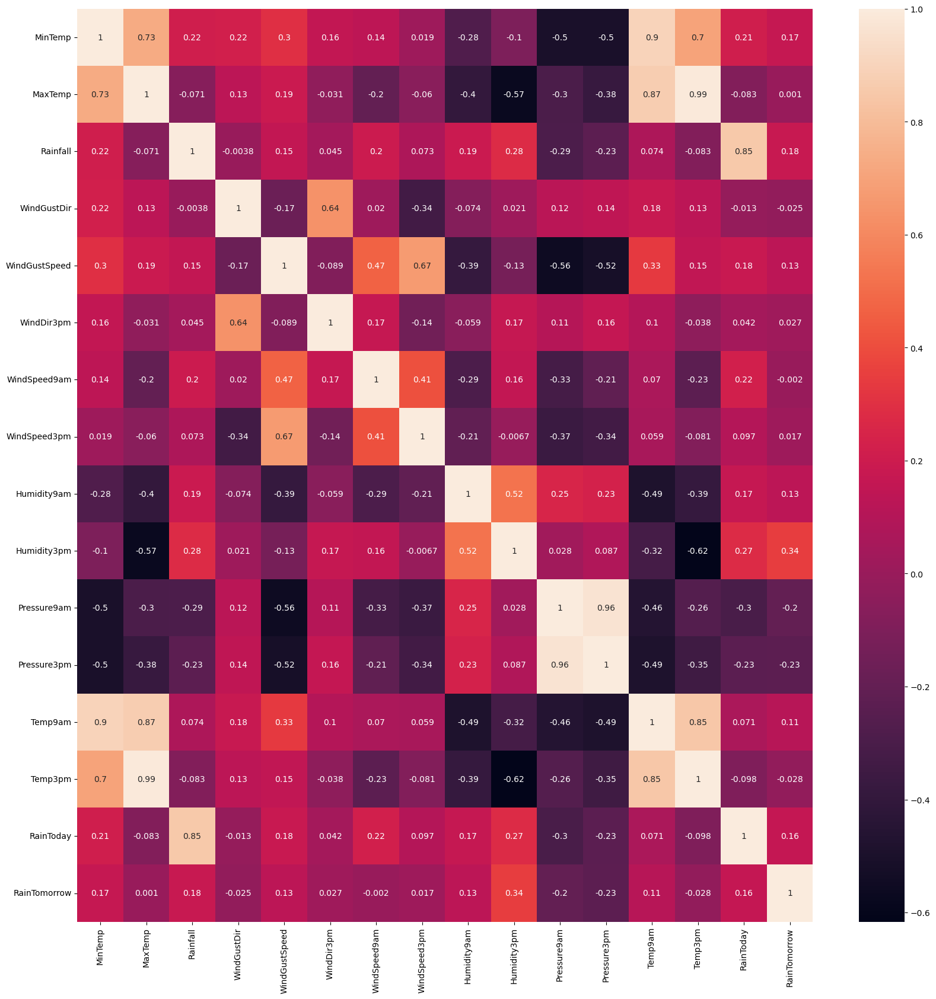

In [224]:
corrmat = Canberra_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [225]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Canberra_df[columns_to_scale] = scaler.fit_transform(Canberra_df[columns_to_scale])

### Model Building

In [226]:
X = Canberra_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Canberra_df['RainTomorrow']

In [227]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [228]:
y_train

48816    0
46138    0
46133    0
48599    0
47289    0
        ..
48232    0
45689    1
48028    0
48539    0
48980    0
Name: RainTomorrow, Length: 2534, dtype: uint8

In [229]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\dell\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [230]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[525  12]
 [ 59  38]]
0.88801261829653
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       537
           1       0.76      0.39      0.52        97

    accuracy                           0.89       634
   macro avg       0.83      0.68      0.73       634
weighted avg       0.88      0.89      0.87       634



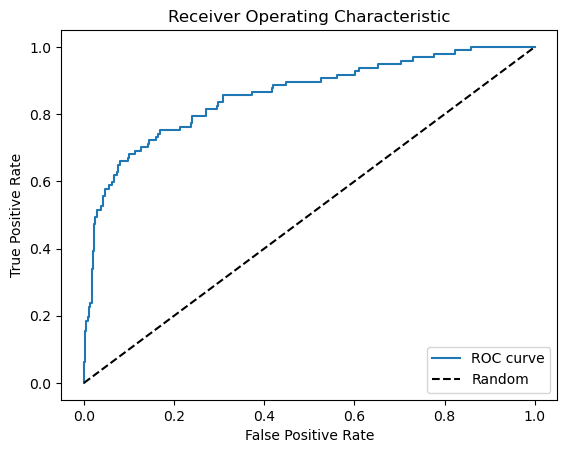

ROC AUC: 0.8570907485265602


In [231]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [232]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [233]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[525  12]
 [ 66  31]]
0.8769716088328076
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       537
           1       0.72      0.32      0.44        97

    accuracy                           0.88       634
   macro avg       0.80      0.65      0.69       634
weighted avg       0.86      0.88      0.86       634



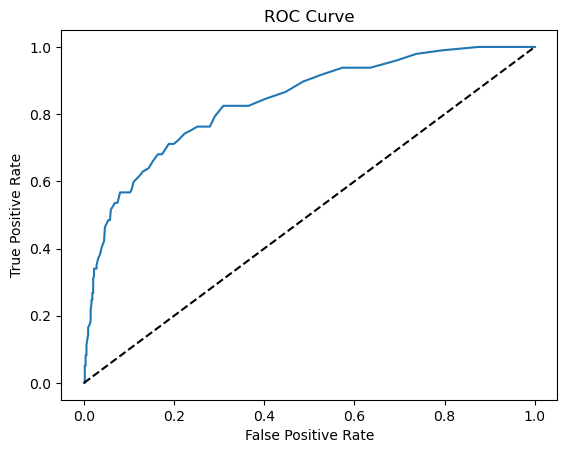

ROC AUC: 0.8370769260304479


In [234]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [235]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [236]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[463  74]
 [ 57  40]]
0.7933753943217665
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       537
           1       0.35      0.41      0.38        97

    accuracy                           0.79       634
   macro avg       0.62      0.64      0.63       634
weighted avg       0.81      0.79      0.80       634



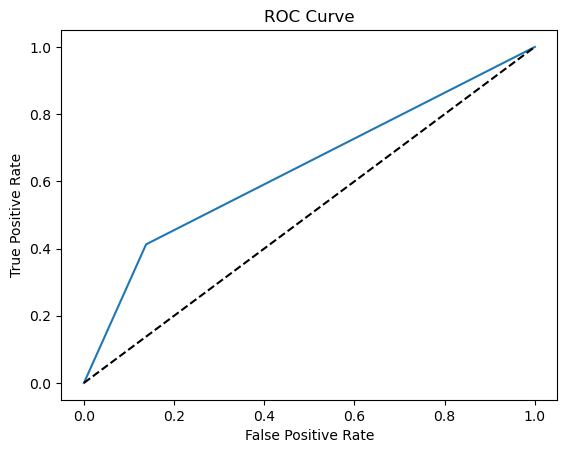

ROC AUC: 0.6372842634721343


In [237]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### 7. CoffsHarbour

In [239]:
CoffsHarbour_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
9058,2009-01-01,CoffsHarbour,16.1,31.4,0.0,NNE,54.0,N,NNE,7.0,37.0,51.0,58.0,1005.9,1002.3,26.5,28.4,No,No
9059,2009-01-02,CoffsHarbour,22.8,24.7,0.0,SSW,56.0,SSW,S,35.0,15.0,68.0,67.0,1010.9,1011.4,23.4,24.4,No,Yes
9060,2009-01-03,CoffsHarbour,20.0,24.1,4.6,SE,35.0,SE,E,20.0,19.0,70.0,59.0,1019.3,1018.8,21.7,23.7,Yes,No
9061,2009-01-04,CoffsHarbour,14.8,25.0,0.8,E,24.0,SSE,ESE,7.0,17.0,62.0,45.0,1019.5,1017.0,22.5,24.8,No,No
9062,2009-01-05,CoffsHarbour,15.5,27.3,0.0,NE,41.0,NW,NE,7.0,30.0,54.0,62.0,1015.7,1012.7,24.6,26.1,No,No


In [240]:
CoffsHarbour_df.isnull().sum()*100/len(CoffsHarbour_df)

Date              0.000000
Location          0.000000
MinTemp           0.498504
MaxTemp           0.631439
Rainfall          1.861083
WindGustDir      11.930874
WindGustSpeed    11.930874
WindDir9am       11.532070
WindDir3pm       10.069791
WindSpeed9am      9.837155
WindSpeed3pm      9.803922
Humidity9am       0.631439
Humidity3pm       0.731140
Pressure9am      10.335660
Pressure3pm      10.368893
Temp9am           0.498504
Temp3pm           0.465271
RainToday         1.861083
RainTomorrow      1.861083
dtype: float64

#### Continuous features

C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

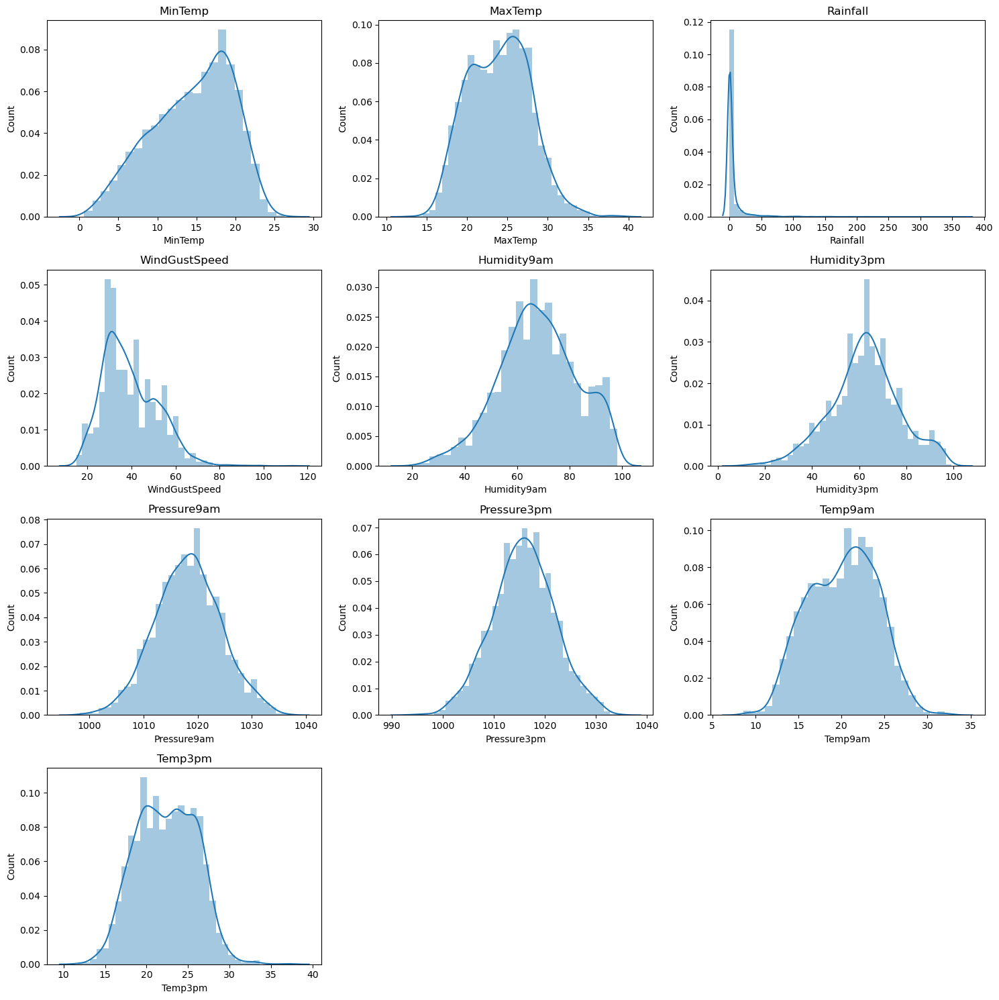

In [241]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(CoffsHarbour_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [242]:
for var in continuous_feature:
        if CoffsHarbour_df[var].isnull().sum()*100/len(df) > 0:
                    CoffsHarbour_df[var].fillna(CoffsHarbour_df[var].median(), inplace=True)

#### Categorical features

In [243]:
for var in categorical_feature:
    CoffsHarbour_df[var].fillna(CoffsHarbour_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [244]:
for var in discrete_feature:
    CoffsHarbour_df[var].fillna(CoffsHarbour_df[var].mode().iloc[0], inplace=True)

In [245]:
CoffsHarbour_df.isnull().sum()*100/len(CoffsHarbour_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [246]:
CoffsHarbour_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3009.0,14.440661,5.130071,0.6,10.7,15.15,18.5,26.3
MaxTemp,3009.0,23.965603,3.814003,12.9,20.9,24.00,26.7,39.2
Rainfall,3009.0,4.967298,17.294872,0.0,0.0,0.00,1.8,371.0
WindGustSpeed,3009.0,38.962114,11.597638,15.0,31.0,37.00,46.0,113.0
WindSpeed9am,3009.0,14.663011,7.533310,0.0,9.0,13.00,20.0,56.0
WindSpeed3pm,3009.0,20.789963,8.554489,0.0,15.0,19.00,26.0,61.0
Humidity9am,3009.0,67.938518,14.828739,21.0,58.0,68.00,78.0,98.0
Humidity3pm,3009.0,62.356597,14.610051,11.0,54.0,63.00,71.0,99.0
Pressure9am,3009.0,1018.224061,5.750754,998.3,1014.7,1018.30,1021.7,1036.8
Pressure3pm,3009.0,1015.836623,5.779624,993.7,1012.4,1015.90,1019.4,1035.0


### Outlier Handling

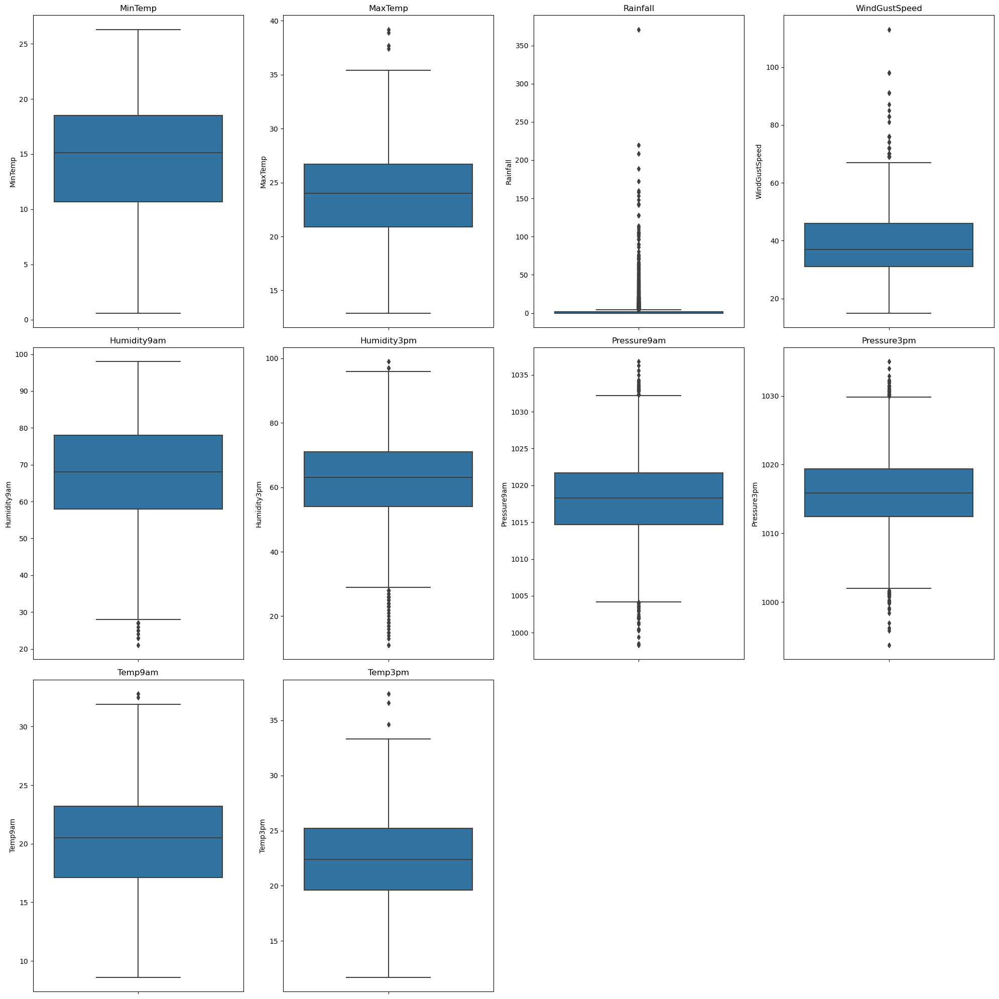

In [247]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=CoffsHarbour_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [248]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = CoffsHarbour_df[variable].quantile(0.75) - CoffsHarbour_df[variable].quantile(0.25)
    lower_bridge = CoffsHarbour_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = CoffsHarbour_df[variable].quantile(0.75) + (IQR * 1.5)

    CoffsHarbour_df = CoffsHarbour_df[(CoffsHarbour_df[variable] >= lower_bridge) & (CoffsHarbour_df[variable] <= upper_bridge)]

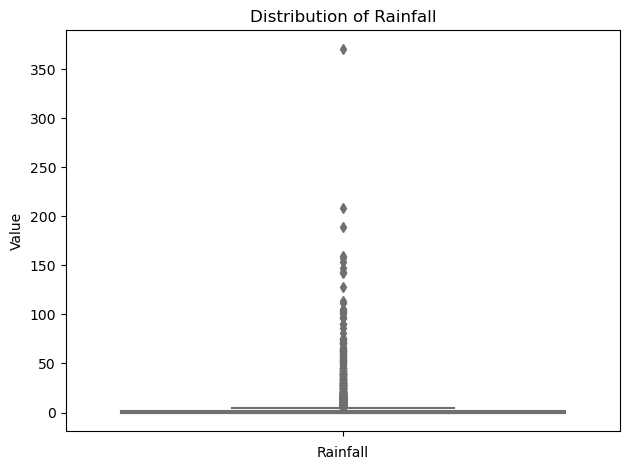

In [249]:
sns.boxplot(data=CoffsHarbour_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

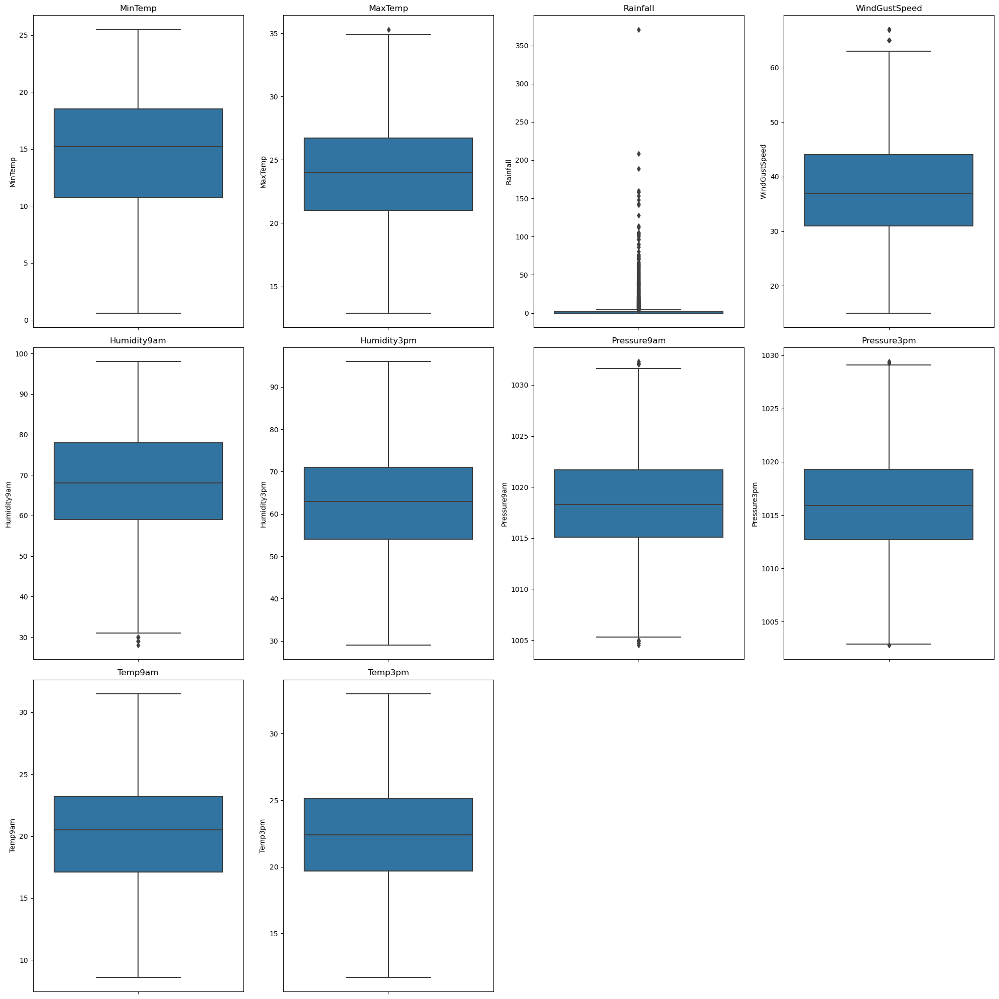

In [250]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=CoffsHarbour_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [251]:
pct_5 = np.percentile(CoffsHarbour_df['Rainfall'], 5)
pct_95 = np.percentile(CoffsHarbour_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 24.0


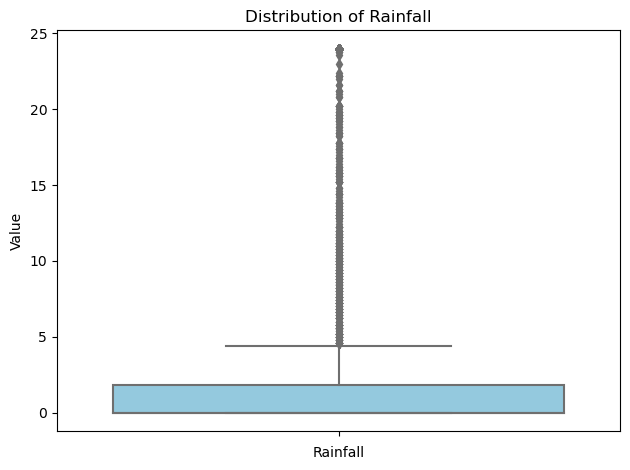

In [252]:
CoffsHarbour_df['Rainfall'] = np.where(CoffsHarbour_df['Rainfall'] > pct_95, pct_95,np.where(CoffsHarbour_df['Rainfall'] < pct_5, pct_5, CoffsHarbour_df['Rainfall']))
sns.boxplot(data=CoffsHarbour_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [253]:
CoffsHarbour_df["RainToday"] = pd.get_dummies(CoffsHarbour_df["RainToday"], drop_first = True)
CoffsHarbour_df["RainTomorrow"] = pd.get_dummies(CoffsHarbour_df["RainTomorrow"], drop_first = True)

In [254]:
for feature in categorical_feature:
    print(feature, (CoffsHarbour_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2009-01-02', '2011-08-30', '2011-08-09', '2011-08-10', '2011-08-14',
       '2011-08-16', '2015-09-25', '2015-09-24', '2011-08-20', '2011-08-21',
       ...
       '2012-06-06', '2012-06-08', '2012-06-19', '2012-06-09', '2012-06-14',
       '2012-06-15', '2012-06-16', '2012-06-17', '2012-06-18', '2017-06-25'],
      dtype='object', name='Date', length=2827)
Location Index(['CoffsHarbour'], dtype='object', name='Location')
WindGustDir Index(['ESE', 'SSE', 'S', 'SE', 'SSW', 'E', 'ENE', 'WSW', 'SW', 'N', 'WNW',
       'W', 'NNW', 'NW', 'NE', 'NNE'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['E', 'ESE', 'ENE', 'WSW', 'NE', 'SSE', 'SSW', 'SW', 'SE', 'NNE', 'N',
       'S', 'WNW', 'W', 'NNW', 'NW'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['WSW', 'SW', 'W', 'SSW', 'NW', 'WNW', 'S', 'NNW', 'SSE', 'SE', 'ENE',
       'ESE', 'E', 'N', 'NNE', 'NE'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainTo

In [255]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
CoffsHarbour_df["WindGustDir"] = CoffsHarbour_df["WindGustDir"].map(windgustdir)
CoffsHarbour_df["WindDir9am"] = CoffsHarbour_df["WindDir9am"].map(winddir9am)
CoffsHarbour_df["WindDir3pm"] = CoffsHarbour_df["WindDir3pm"].map(winddir3pm)

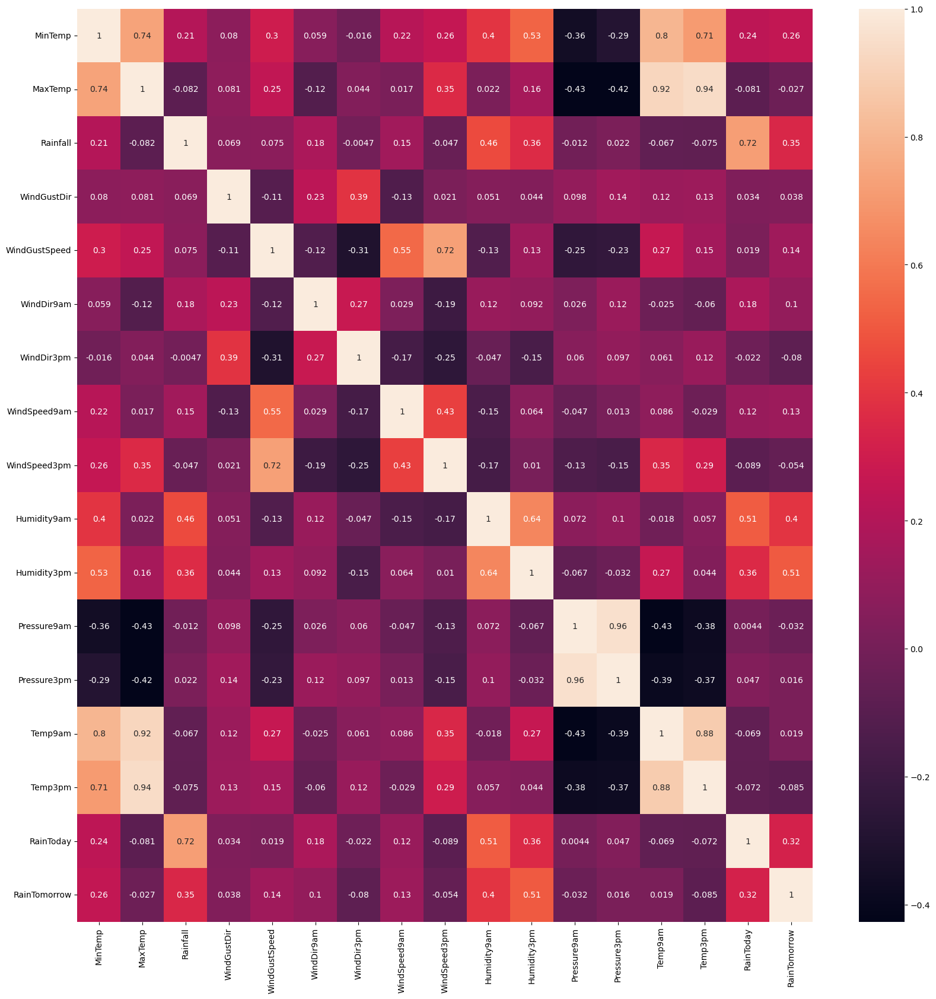

In [256]:
corrmat = CoffsHarbour_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [257]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
CoffsHarbour_df[columns_to_scale] = scaler.fit_transform(CoffsHarbour_df[columns_to_scale])

### Model Building

In [258]:
X = CoffsHarbour_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = CoffsHarbour_df['RainTomorrow']

In [259]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [260]:
y_train

11119    0
10114    1
9854     0
10316    1
10139    1
        ..
10089    0
9784     1
12040    0
9392     1
10775    0
Name: RainTomorrow, Length: 2261, dtype: uint8

In [261]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

LogisticRegression(random_state=0)

In [262]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[383  23]
 [ 76  84]]
0.8250883392226148
              precision    recall  f1-score   support

           0       0.83      0.94      0.89       406
           1       0.79      0.53      0.63       160

    accuracy                           0.83       566
   macro avg       0.81      0.73      0.76       566
weighted avg       0.82      0.83      0.81       566



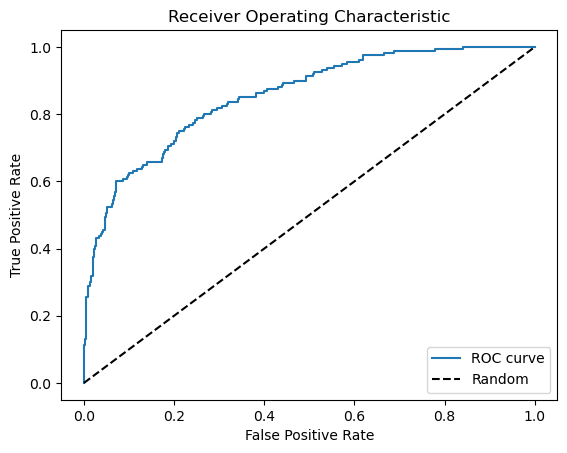

ROC AUC: 0.8539562807881773


In [263]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [264]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [265]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[387  19]
 [ 79  81]]
0.8268551236749117
              precision    recall  f1-score   support

           0       0.83      0.95      0.89       406
           1       0.81      0.51      0.62       160

    accuracy                           0.83       566
   macro avg       0.82      0.73      0.76       566
weighted avg       0.82      0.83      0.81       566



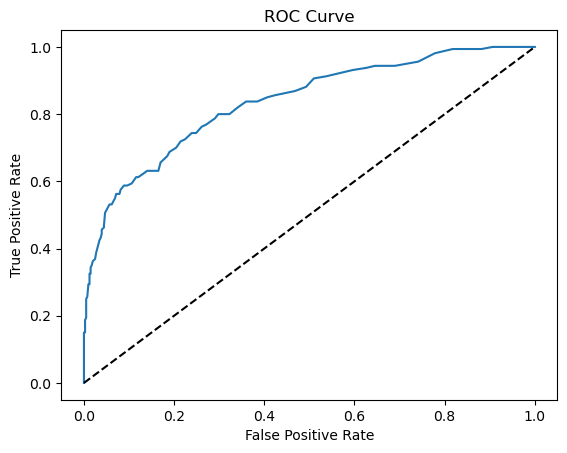

ROC AUC: 0.8354833743842364


In [266]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [267]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [268]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[350  56]
 [ 78  82]]
0.7632508833922261
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       406
           1       0.59      0.51      0.55       160

    accuracy                           0.76       566
   macro avg       0.71      0.69      0.69       566
weighted avg       0.75      0.76      0.76       566



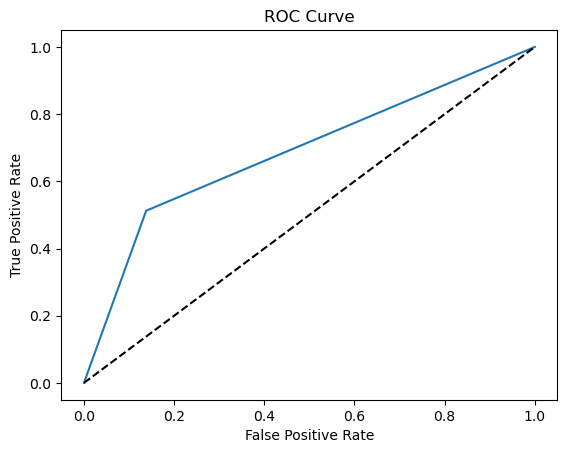

ROC AUC: 0.6872844827586206


In [269]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

#### Dartmoor

In [260]:
Dartmoor_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
80998,2009-01-01,Dartmoor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80999,2009-01-02,Dartmoor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81000,2009-01-03,Dartmoor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81001,2009-01-04,Dartmoor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81002,2009-01-05,Dartmoor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [261]:
Dartmoor_df.isnull().sum()*100/len(Dartmoor_df)

Date              0.000000
Location          0.000000
MinTemp           2.293121
MaxTemp           2.093719
Rainfall          2.226653
WindGustDir       2.293121
WindGustSpeed     2.293121
WindDir9am       18.876703
WindDir3pm        3.256896
WindSpeed9am      2.193420
WindSpeed3pm      2.126952
Humidity9am       7.577268
Humidity3pm       7.477567
Pressure9am       2.126952
Pressure3pm       2.160186
Temp9am           2.160186
Temp3pm           2.126952
RainToday         2.226653
RainTomorrow      2.193420
dtype: float64

In [262]:
Dartmoor_df.drop(['WindDir9am'], axis=1, inplace=True)

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/2138097356.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Dartmoor_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/2138097356.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Dartmoor_df[feature], ax=axes[i])
C:

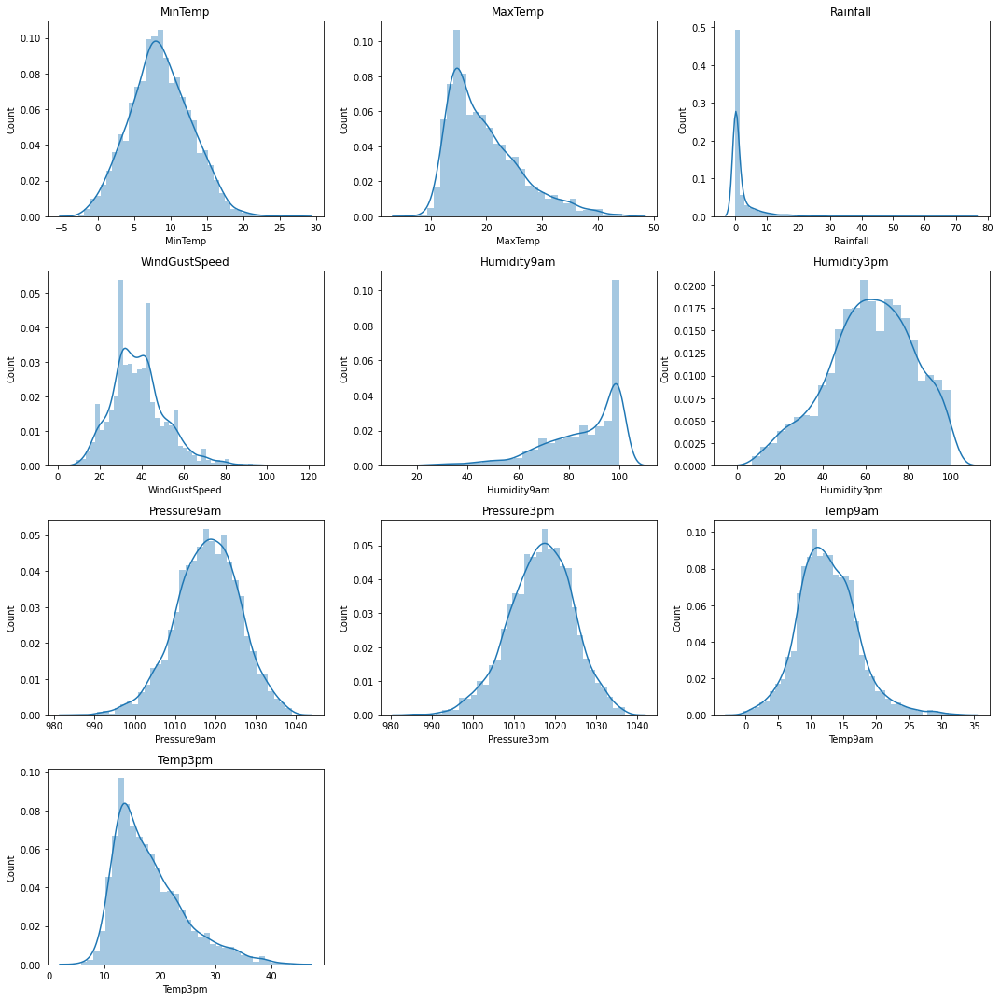

In [263]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Dartmoor_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [264]:
for var in continuous_feature:
    if Dartmoor_df[var].isnull().sum()*100/len(df) > 0:
                Dartmoor_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [265]:
categorical_feature_1 = [feat for feat in categorical_feature if feat != 'WindDir9am']
for var in categorical_feature_1:
    Dartmoor_df[var].fillna(Dartmoor_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [266]:
for var in discrete_feature:
    Dartmoor_df[var].fillna(Dartmoor_df[var].mode().iloc[0], inplace=True)

In [267]:
Dartmoor_df.isnull().sum()*100/len(Dartmoor_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [268]:
Dartmoor_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3009.0,8.766334,4.231817,-2.7,5.8,8.6,11.7,26.8
MaxTemp,3009.0,19.731007,6.386925,7.1,14.8,18.3,23.1,44.4
Rainfall,3009.0,2.098770,4.936402,0.0,0.0,0.2,1.8,73.6
WindGustSpeed,3009.0,38.992356,12.882742,9.0,31.0,39.0,46.0,113.0
WindSpeed9am,3009.0,10.585577,8.156836,0.0,4.0,9.0,17.0,50.0
WindSpeed3pm,3009.0,17.925889,7.809068,0.0,13.0,17.0,22.0,56.0
Humidity9am,3009.0,84.064806,15.530944,20.0,72.0,88.0,98.0,100.0
Humidity3pm,3009.0,62.945829,19.532877,7.0,51.0,66.0,76.0,100.0
Pressure9am,3009.0,1018.010934,7.880565,986.2,1012.9,1018.4,1023.3,1038.9
Pressure3pm,3009.0,1016.507511,7.711640,985.2,1011.5,1016.6,1021.8,1036.9


### Outlier Handling

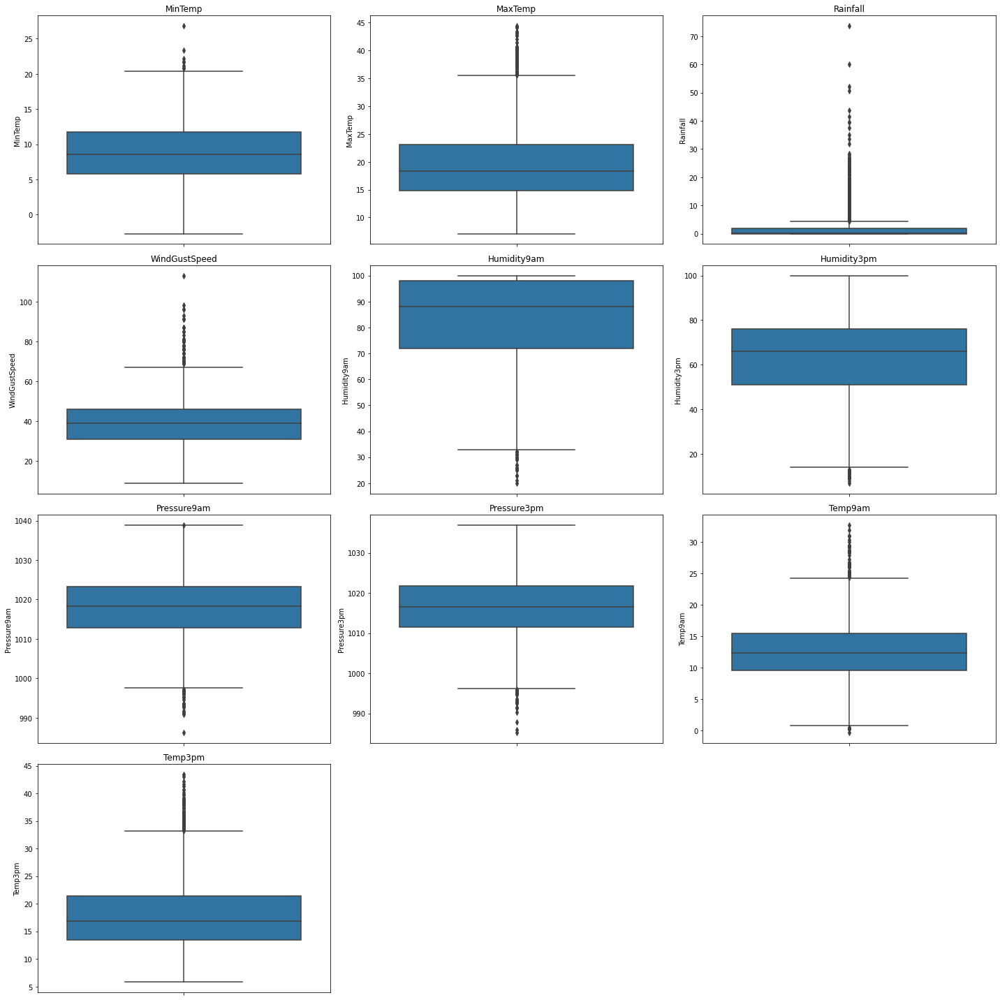

In [269]:
num_cols = 3
num_rows = 4

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Dartmoor_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [270]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Dartmoor_df[variable].quantile(0.75) - Dartmoor_df[variable].quantile(0.25)
    lower_bridge = Dartmoor_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Dartmoor_df[variable].quantile(0.75) + (IQR * 1.5)

    Dartmoor_df = Dartmoor_df[(Dartmoor_df[variable] >= lower_bridge) & (Dartmoor_df[variable] <= upper_bridge)]

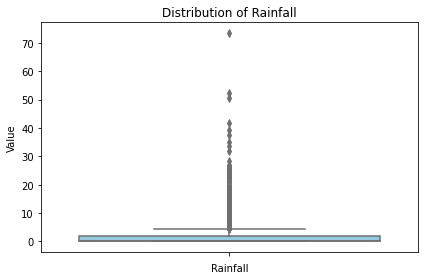

In [271]:
sns.boxplot(data=Dartmoor_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

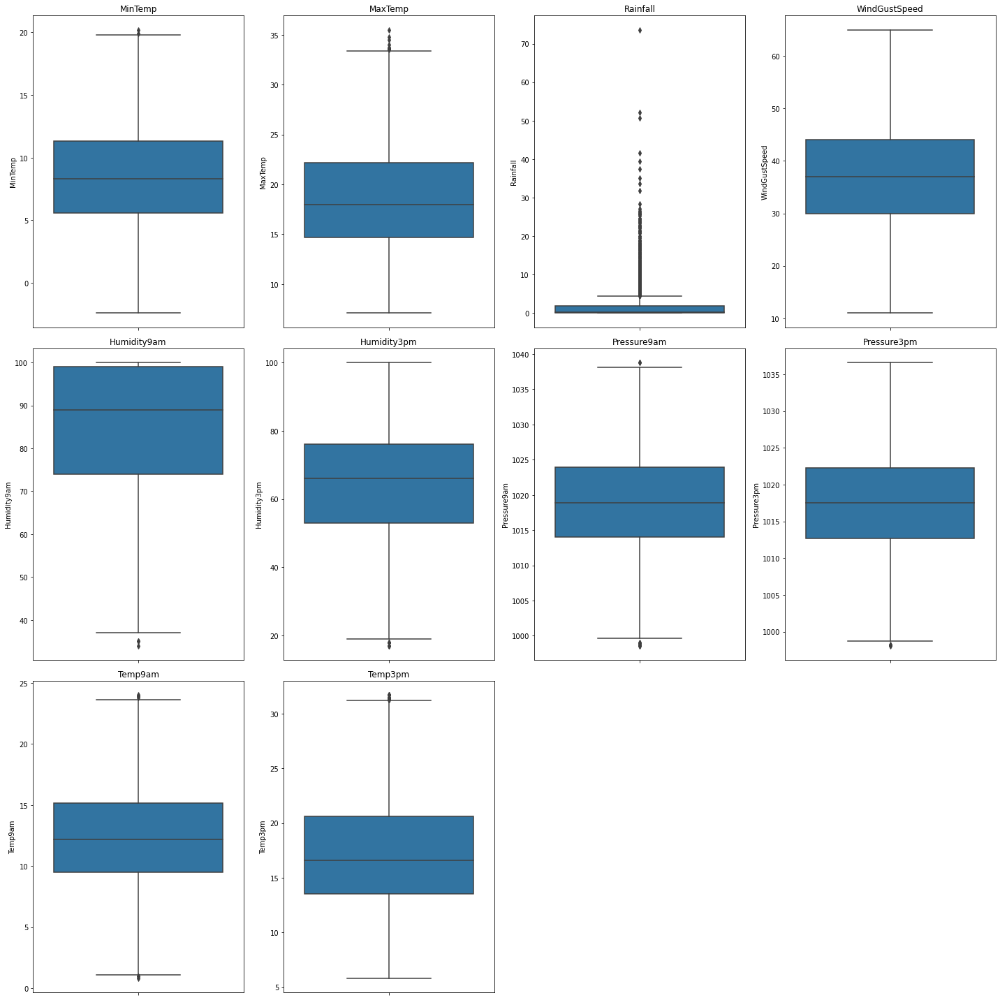

In [272]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Dartmoor_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [273]:
pct_5 = np.percentile(Dartmoor_df['Rainfall'], 5)
pct_95 = np.percentile(Dartmoor_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 10.339999999999964


In [274]:
Dartmoor_df['Rainfall'] = np.where(Dartmoor_df['Rainfall'] > pct_95, pct_95,np.where(Dartmoor_df['Rainfall'] < pct_5, pct_5, Dartmoor_df['Rainfall']))

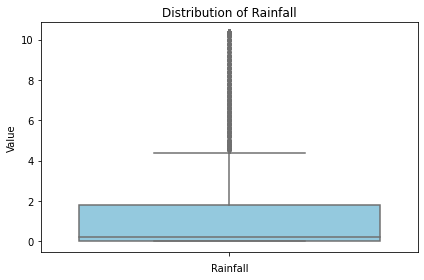

In [275]:
sns.boxplot(data=Dartmoor_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [276]:
Dartmoor_df["RainToday"] = pd.get_dummies(Dartmoor_df["RainToday"], drop_first = True)
Dartmoor_df["RainTomorrow"] = pd.get_dummies(Dartmoor_df["RainTomorrow"], drop_first = True)

In [277]:
for feature in categorical_feature_1:
    print(feature, (Dartmoor_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2017-06-25', '2011-09-30', '2015-08-03', '2015-08-02', '2011-10-05',
       '2015-07-31', '2011-10-07', '2011-10-08', '2015-07-30', '2011-10-10',
       ...
       '2012-03-26', '2012-03-25', '2012-03-24', '2012-03-21', '2012-03-19',
       '2012-03-18', '2012-03-17', '2012-03-16', '2012-03-13', '2013-05-09'],
      dtype='object', name='Date', length=2727)
Location Index(['Dartmoor'], dtype='object', name='Location')
WindGustDir Index(['WNW', 'W', 'WSW', 'NW', 'N', 'NE', 'NNW', 'SW', 'NNE', 'S', 'E', 'SSW',
       'ENE', 'SSE', 'ESE', 'SE'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['WNW', 'N', 'W', 'WSW', 'NE', 'NW', 'NNW', 'NNE', 'ENE', 'SW', 'S', 'E',
       'SSW', 'SE', 'ESE', 'SSE'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [278]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Dartmoor_df["WindGustDir"] = Dartmoor_df["WindGustDir"].map(windgustdir)
Dartmoor_df["WindDir3pm"] = Dartmoor_df["WindDir3pm"].map(winddir3pm)

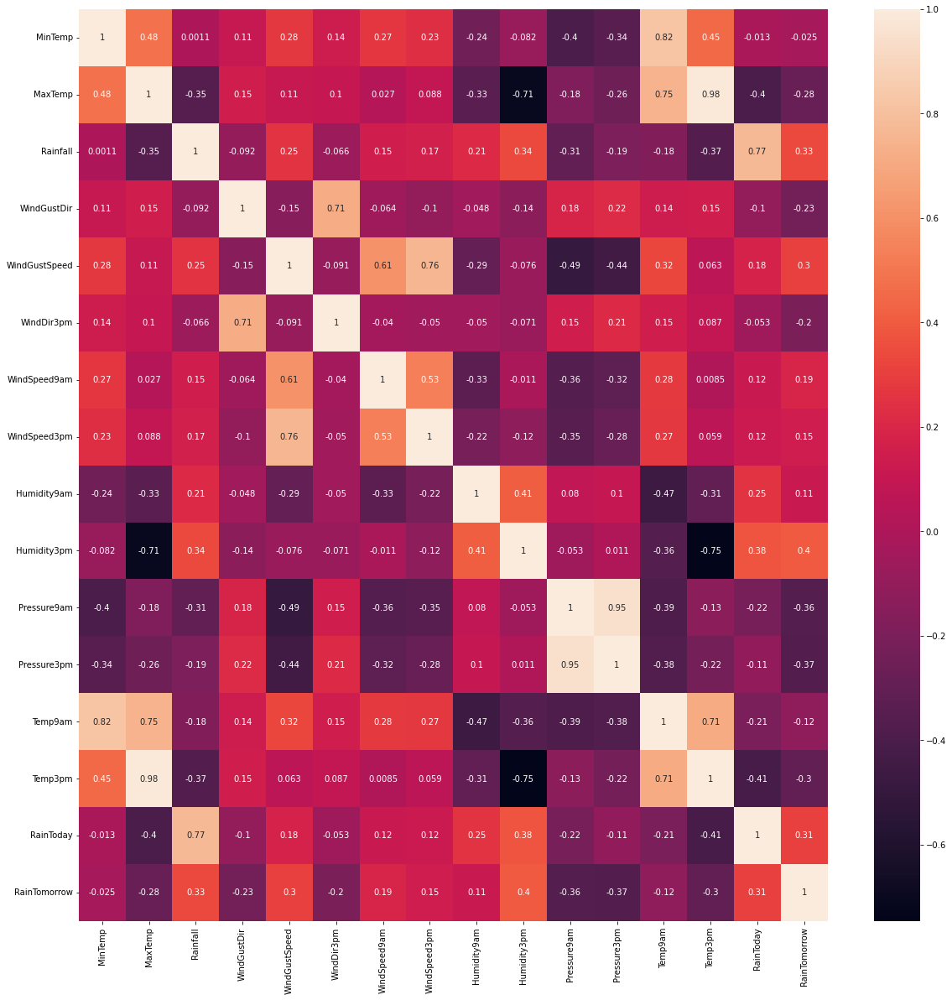

In [279]:
corrmat = Dartmoor_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [280]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Dartmoor_df[columns_to_scale] = scaler.fit_transform(Dartmoor_df[columns_to_scale])

### Model Building

In [281]:
X = Dartmoor_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Dartmoor_df['RainTomorrow']

In [282]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [283]:
y_train

83471    0
82047    0
82069    1
81008    0
83939    0
        ..
83708    0
81369    0
82716    0
82324    0
83751    0
Name: RainTomorrow, Length: 2181, dtype: uint8

In [284]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

LogisticRegression(random_state=0)

In [285]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[360  29]
 [ 63  94]]
0.8315018315018315
              precision    recall  f1-score   support

           0       0.85      0.93      0.89       389
           1       0.76      0.60      0.67       157

    accuracy                           0.83       546
   macro avg       0.81      0.76      0.78       546
weighted avg       0.83      0.83      0.82       546



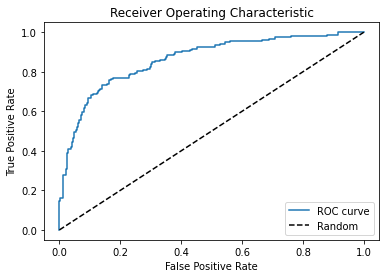

ROC AUC: 0.862590670181586


In [286]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [287]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [288]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[358  31]
 [ 64  93]]
0.826007326007326
              precision    recall  f1-score   support

           0       0.85      0.92      0.88       389
           1       0.75      0.59      0.66       157

    accuracy                           0.83       546
   macro avg       0.80      0.76      0.77       546
weighted avg       0.82      0.83      0.82       546



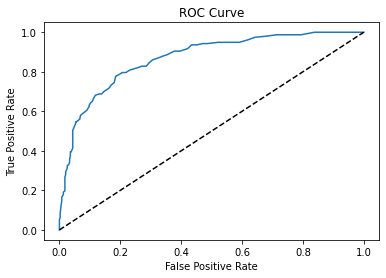

ROC AUC: 0.8689355361616427


In [289]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [290]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [291]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[323  66]
 [ 57 100]]
0.7747252747252747
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       389
           1       0.60      0.64      0.62       157

    accuracy                           0.77       546
   macro avg       0.73      0.73      0.73       546
weighted avg       0.78      0.77      0.78       546



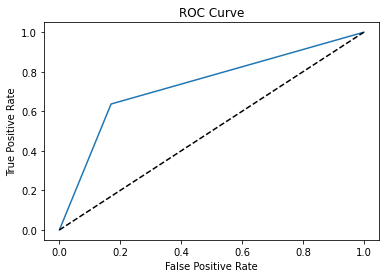

ROC AUC: 0.733638432695299


In [292]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

### GoldCoast

In [349]:
GoldCoast_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
90240,2008-12-01,GoldCoast,17.0,30.4,0.0,NNW,31.0,NNW,NE,17.0,22.0,52.0,61.0,1013.5,1010.7,26.2,28.5,No,No
90241,2008-12-02,GoldCoast,19.0,29.7,0.0,NNE,37.0,NNW,NNE,19.0,31.0,55.0,70.0,1013.1,1010.2,27.8,26.2,No,No
90242,2008-12-03,GoldCoast,21.3,28.6,0.0,NNE,52.0,N,N,24.0,31.0,61.0,74.0,1013.4,1009.8,27.8,24.6,No,No
90243,2008-12-04,GoldCoast,20.9,28.7,0.8,SE,52.0,ENE,SE,15.0,39.0,65.0,75.0,1014.7,1014.5,27.5,23.6,No,No
90244,2008-12-05,GoldCoast,19.7,29.5,0.2,NW,43.0,E,SE,11.0,11.0,67.0,83.0,1017.5,1015.2,26.0,23.8,No,Yes


In [350]:
GoldCoast_df.isnull().sum()*100/len(GoldCoast_df)

Date             0.000000
Location         0.000000
MinTemp          0.098684
MaxTemp          0.230263
Rainfall         1.973684
WindGustDir      3.947368
WindGustSpeed    3.947368
WindDir9am       2.138158
WindDir3pm       1.151316
WindSpeed9am     1.315789
WindSpeed3pm     1.019737
Humidity9am      0.460526
Humidity3pm      0.394737
Pressure9am      0.032895
Pressure3pm      0.032895
Temp9am          0.032895
Temp3pm          0.032895
RainToday        1.973684
RainTomorrow     1.973684
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/1778546837.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(GoldCoast_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/1778546837.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(GoldCoast_df[feature], ax=axes[i])


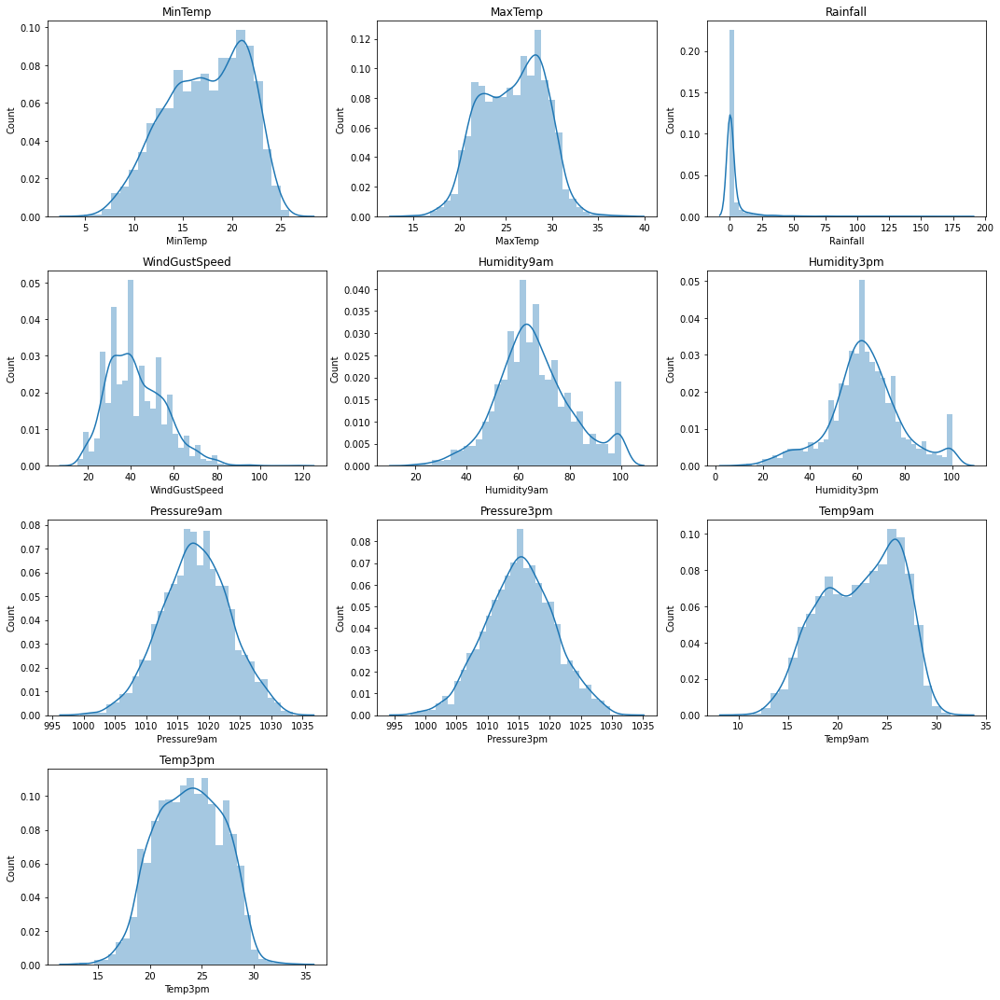

In [351]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(GoldCoast_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [352]:
for var in continuous_feature:
            if GoldCoast_df[var].isnull().sum()*100/len(df) > 0:
                   GoldCoast_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [353]:
for var in categorical_feature:
    GoldCoast_df[var].fillna(GoldCoast_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [354]:
for var in discrete_feature:
    GoldCoast_df[var].fillna(GoldCoast_df[var].mode().iloc[0], inplace=True)

In [355]:
GoldCoast_df.isnull().sum()*100/len(GoldCoast_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [356]:
GoldCoast_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,17.360954,4.114090,4.9,14.275,17.7,20.9,25.9
MaxTemp,3040.0,25.756776,3.410936,14.5,23.000,26.0,28.5,37.9
Rainfall,3040.0,3.695000,12.936100,0.0,0.000,0.0,1.2,183.4
WindGustSpeed,3040.0,42.497039,12.967826,15.0,33.000,41.0,50.0,117.0
WindSpeed9am,3040.0,19.266118,9.548575,0.0,11.000,17.0,26.0,72.0
WindSpeed3pm,3040.0,25.771053,9.567836,0.0,19.000,26.0,31.0,87.0
Humidity9am,3040.0,66.344408,14.701219,19.0,57.000,65.0,75.0,100.0
Humidity3pm,3040.0,63.004276,15.138072,11.0,55.000,63.0,71.0,100.0
Pressure9am,3040.0,1017.922270,5.471421,999.5,1014.200,1017.9,1021.7,1033.5
Pressure3pm,3040.0,1015.215033,5.557803,997.6,1011.500,1015.3,1019.0,1031.8


#### Outlier Handling

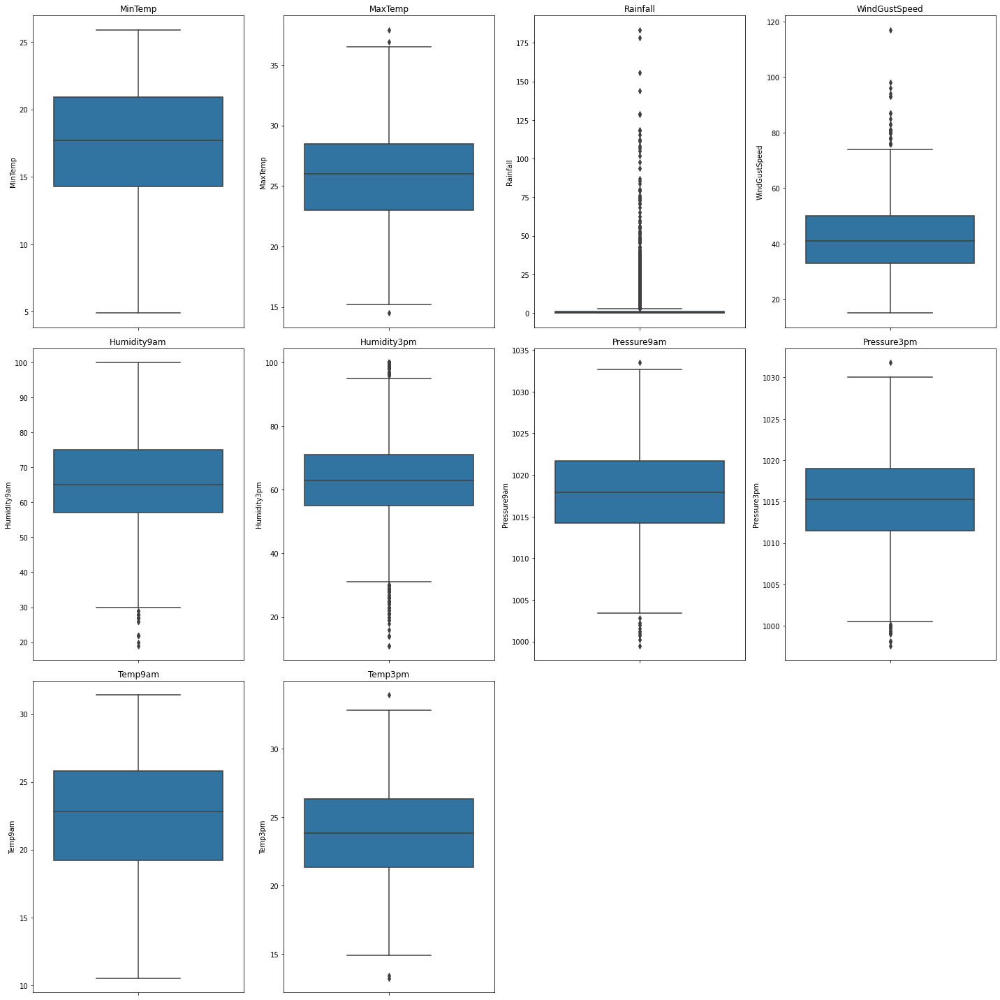

In [357]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=GoldCoast_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [358]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = GoldCoast_df[variable].quantile(0.75) - GoldCoast_df[variable].quantile(0.25)
    lower_bridge = GoldCoast_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = GoldCoast_df[variable].quantile(0.75) + (IQR * 1.5)

    GoldCoast_df =GoldCoast_df[(GoldCoast_df[variable] >= lower_bridge) & (GoldCoast_df[variable] <= upper_bridge)]

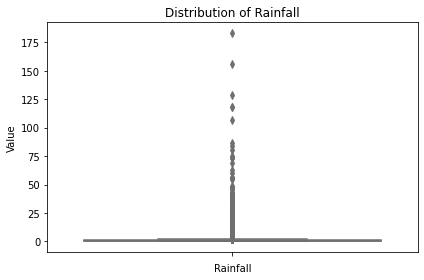

In [359]:
sns.boxplot(data=GoldCoast_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

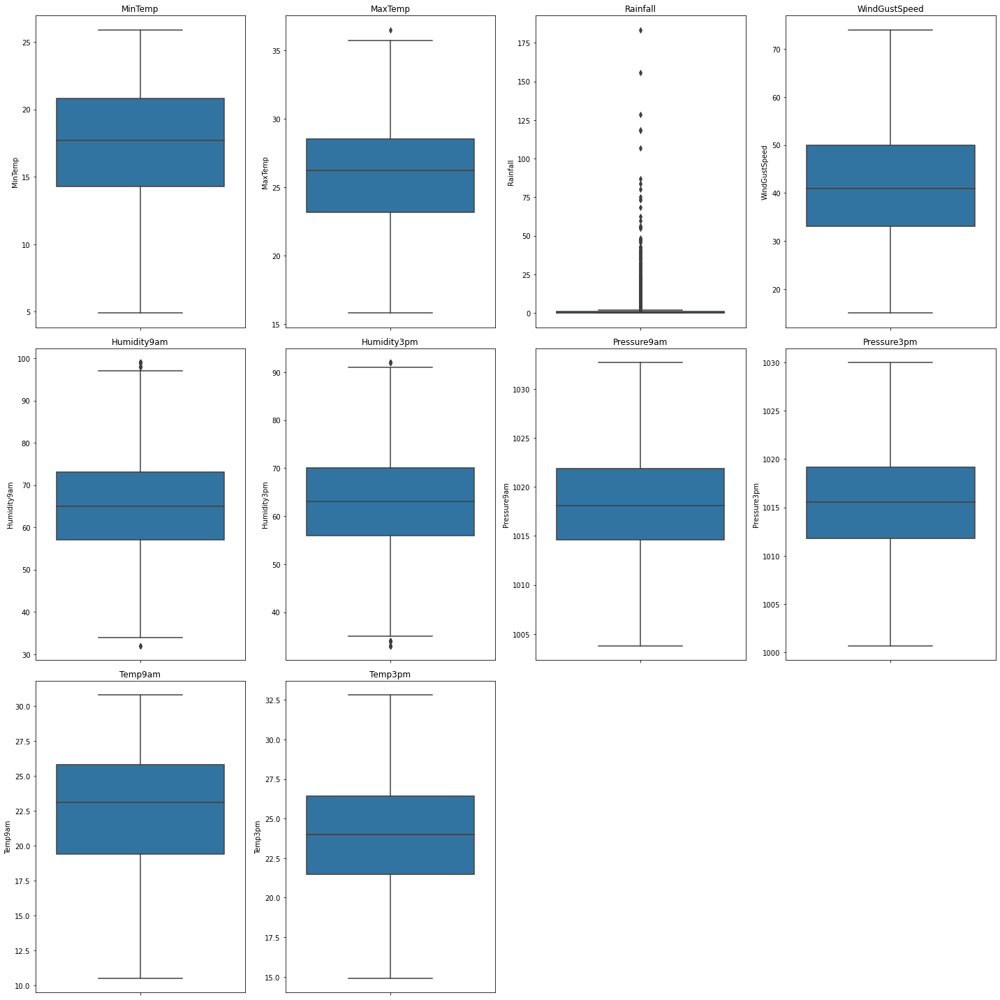

In [360]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=GoldCoast_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [361]:
pct_5 = np.percentile(GoldCoast_df['Rainfall'], 5)
pct_95 = np.percentile(GoldCoast_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 13.56999999999998


In [362]:
GoldCoast_df['Rainfall'] = np.where(GoldCoast_df['Rainfall'] > pct_95, pct_95,np.where(GoldCoast_df['Rainfall'] < pct_5, pct_5, GoldCoast_df['Rainfall']))

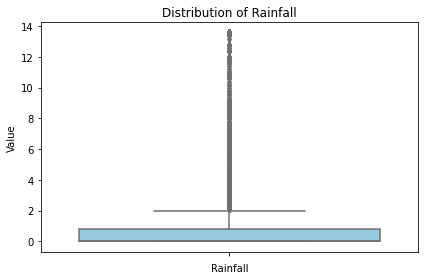

In [363]:
sns.boxplot(data=GoldCoast_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [364]:
GoldCoast_df["RainToday"] = pd.get_dummies(GoldCoast_df["RainToday"], drop_first = True)
GoldCoast_df["RainTomorrow"] = pd.get_dummies(GoldCoast_df["RainTomorrow"], drop_first = True)

In [365]:
for feature in categorical_feature_1:
    print(feature, (GoldCoast_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2011-05-10', '2011-05-23', '2011-05-03', '2015-09-28', '2015-09-27',
       '2011-05-08', '2011-05-09', '2015-09-20', '2015-09-18', '2015-09-17',
       ...
       '2012-03-11', '2012-03-10', '2012-03-09', '2012-03-08', '2012-03-07',
       '2012-03-01', '2012-02-29', '2012-02-28', '2012-02-27', '2017-06-25'],
      dtype='object', name='Date', length=2684)
Location Index(['GoldCoast'], dtype='object', name='Location')
WindGustDir Index(['SW', 'WSW', 'E', 'SE', 'SSW', 'SSE', 'ESE', 'N', 'ENE', 'NE', 'S',
       'NNW', 'NW', 'NNE', 'W', 'WNW'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['SW', 'S', 'SSE', 'SSW', 'NNW', 'N', 'SE', 'ESE', 'E', 'NW', 'ENE',
       'NNE', 'NE', 'WNW', 'W', 'WSW'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [366]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
GoldCoast_df["WindGustDir"] = GoldCoast_df["WindGustDir"].map(windgustdir)
GoldCoast_df["WindDir3pm"] = GoldCoast_df["WindDir3pm"].map(winddir3pm)
GoldCoast_df["WindDir9am"] = GoldCoast_df["WindDir9am"].map(winddir3pm)

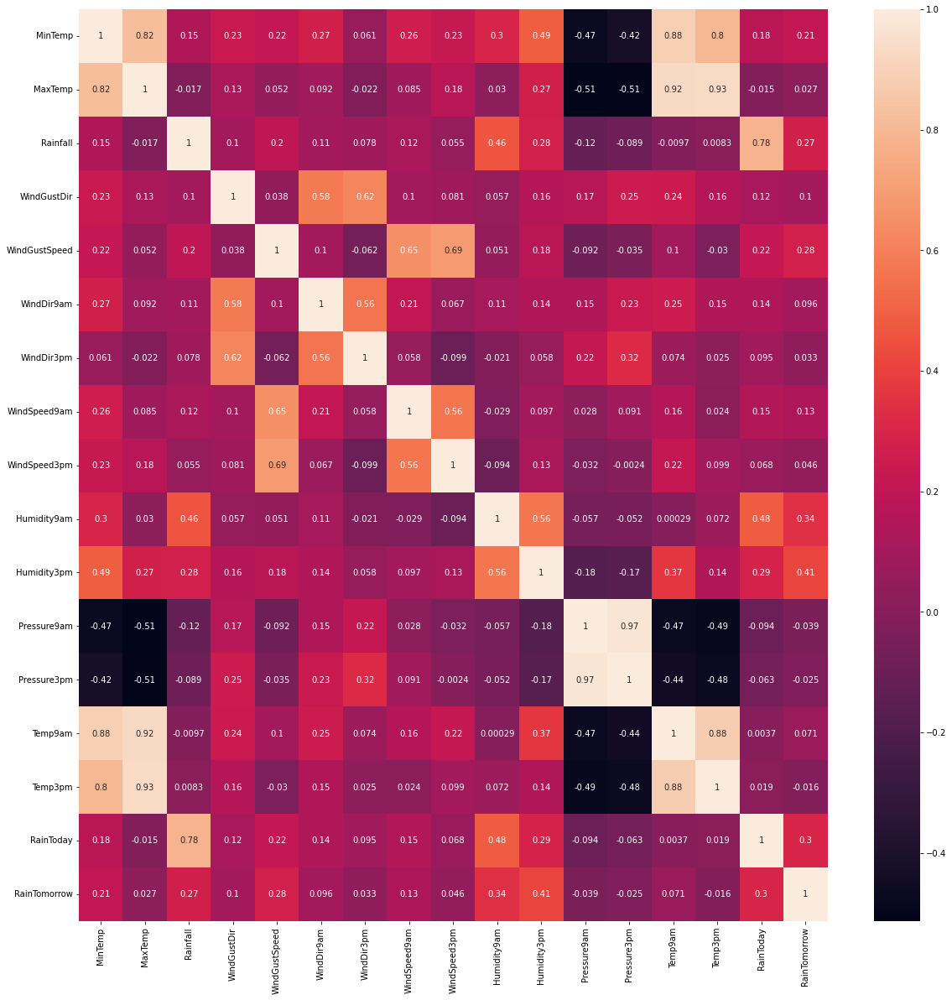

In [367]:
corrmat = GoldCoast_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [368]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
GoldCoast_df[columns_to_scale] = scaler.fit_transform(GoldCoast_df[columns_to_scale])

### Model Building

In [369]:
X = GoldCoast_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = GoldCoast_df['RainTomorrow']

In [370]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [371]:
y_train

92731    0
92076    1
91343    0
93050    0
90716    0
        ..
90534    0
91616    0
92998    1
92638    0
92123    0
Name: RainTomorrow, Length: 2147, dtype: uint8

In [372]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [373]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[393  22]
 [ 73  49]]
0.8230912476722533
              precision    recall  f1-score   support

           0       0.84      0.95      0.89       415
           1       0.69      0.40      0.51       122

    accuracy                           0.82       537
   macro avg       0.77      0.67      0.70       537
weighted avg       0.81      0.82      0.80       537



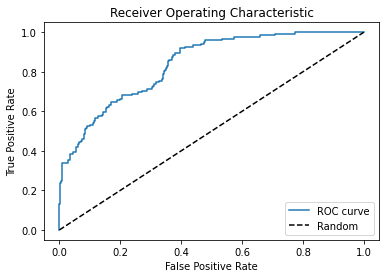

ROC AUC: 0.8380604384752124


In [374]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [375]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [376]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[390  25]
 [ 73  49]]
0.8175046554934823
              precision    recall  f1-score   support

           0       0.84      0.94      0.89       415
           1       0.66      0.40      0.50       122

    accuracy                           0.82       537
   macro avg       0.75      0.67      0.69       537
weighted avg       0.80      0.82      0.80       537



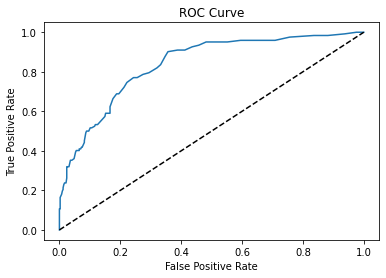

ROC AUC: 0.837388899861742


In [377]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [378]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [379]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[352  63]
 [ 58  64]]
0.7746741154562383
              precision    recall  f1-score   support

           0       0.86      0.85      0.85       415
           1       0.50      0.52      0.51       122

    accuracy                           0.77       537
   macro avg       0.68      0.69      0.68       537
weighted avg       0.78      0.77      0.78       537



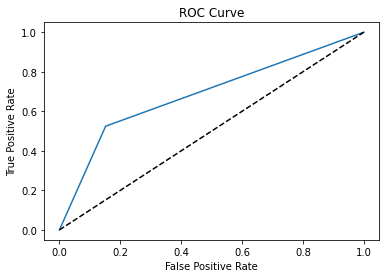

ROC AUC: 0.6863914675093818


In [380]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

### Launceston

In [543]:
Launceston_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
133031,2008-12-01,Launceston,9.5,17.9,3.4,WNW,57.0,WNW,NW,19.0,28.0,53.0,61.0,1000.6,1000.7,12.9,14.1,Yes,Yes
133032,2008-12-02,Launceston,9.4,18.3,4.0,WNW,46.0,NW,NW,24.0,28.0,60.0,46.0,1001.4,1000.5,14.6,17.3,Yes,No
133033,2008-12-03,Launceston,9.1,18.4,1.0,WSW,50.0,NW,WNW,17.0,24.0,62.0,37.0,1002.4,1004.2,13.7,16.5,No,No
133034,2008-12-04,Launceston,2.2,19.4,0.0,NW,39.0,N,NW,7.0,19.0,56.0,41.0,1017.8,1014.6,10.8,18.1,No,Yes
133035,2008-12-05,Launceston,9.6,19.8,4.6,NNW,39.0,SE,NNW,7.0,11.0,91.0,89.0,1008.7,1004.2,11.2,15.9,Yes,No


In [544]:
Launceston_df.isnull().sum()*100/len(Launceston_df)

Date              0.000000
Location          0.000000
MinTemp           0.197368
MaxTemp           0.197368
Rainfall          0.394737
WindGustDir       1.118421
WindGustSpeed     1.085526
WindDir9am       15.131579
WindDir3pm        1.842105
WindSpeed9am      0.164474
WindSpeed3pm      0.361842
Humidity9am       0.197368
Humidity3pm       0.328947
Pressure9am      37.927632
Pressure3pm      37.927632
Temp9am           0.197368
Temp3pm           0.328947
RainToday         0.394737
RainTomorrow      0.394737
dtype: float64

In [545]:
Launceston_df.drop(['WindDir9am', 'Pressure9am','Pressure3pm'], axis=1, inplace=True)

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/2913930209.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Launceston_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/2913930209.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Launceston_df[feature], ax=axes[i]

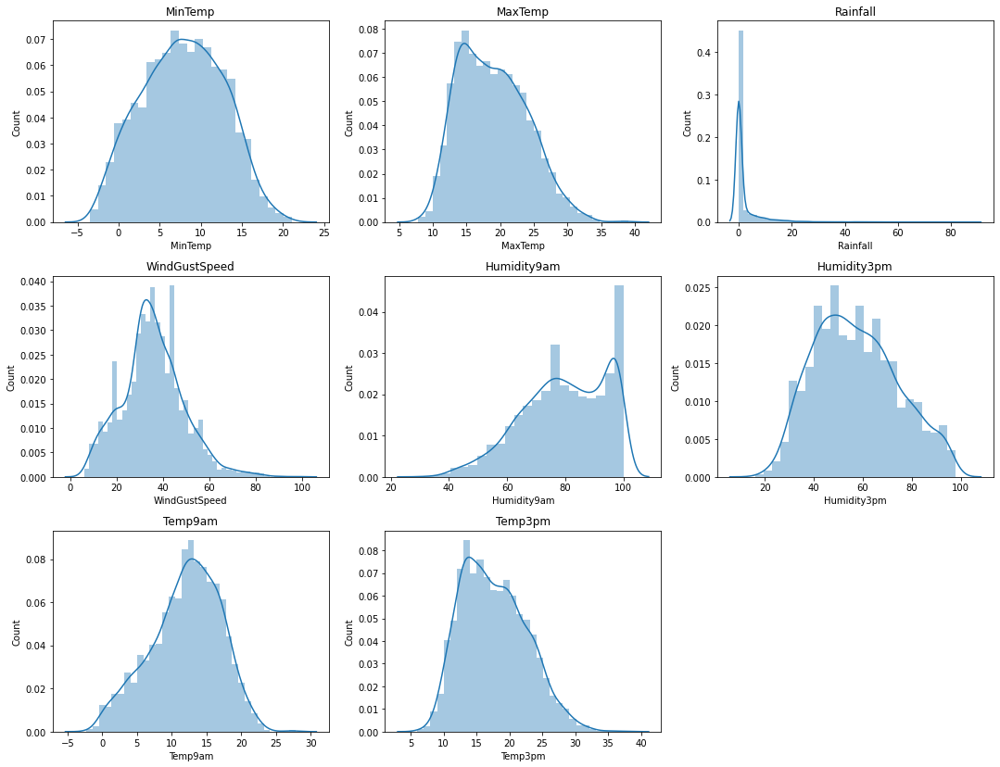

In [546]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

continuous_feature_1 = [feat for feat in continuous_feature if feat not in ('Pressure9am','Pressure3pm')]
for i, feature in enumerate(continuous_feature_1):
        sns.distplot(Launceston_df[feature], ax=axes[i])
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel("Count")
        axes[i].set_title(feature)

if len(continuous_feature_1) < num_rows * num_cols:
    for j in range(len(continuous_feature_1), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [547]:
for var in continuous_feature_1:
    if Launceston_df[var].isnull().sum()*100/len(df) > 0:
                Launceston_df[var].fillna(df[var].median(), inplace=True)
categorical_feature_1 = [feat for feat in categorical_feature if feat != 'WindDir9am']

#### Categorical features

In [548]:
for var in categorical_feature_1:
    Launceston_df[var].fillna(Launceston_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [549]:
for var in discrete_feature:
    Launceston_df[var].fillna(Launceston_df[var].mode().iloc[0], inplace=True)

In [550]:
Launceston_df.isnull().sum()*100/len(Launceston_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [551]:
Launceston_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,7.850329,4.948908,-3.5,4.100,7.9,11.600,21.1
MaxTemp,3040.0,18.959539,5.030486,7.8,14.800,18.5,22.600,39.0
Rainfall,3040.0,2.004046,5.383292,0.0,0.000,0.0,0.800,88.0
WindGustSpeed,3040.0,35.714803,13.188383,6.0,28.000,35.0,43.000,98.0
WindSpeed9am,3040.0,8.433224,7.363599,0.0,2.000,6.0,13.000,44.0
WindSpeed3pm,3040.0,15.575329,7.651266,0.0,9.000,15.0,20.000,43.0
Humidity9am,3040.0,79.481250,14.323680,31.0,69.000,80.0,92.000,100.0
Humidity3pm,3040.0,57.360855,17.053495,16.0,44.000,56.0,69.000,98.0
Temp9am,3040.0,12.038651,4.999561,-2.3,8.900,12.5,15.725,27.8
Temp3pm,3040.0,17.694243,4.926117,6.0,13.775,17.2,21.100,38.2


### Outlier Handling

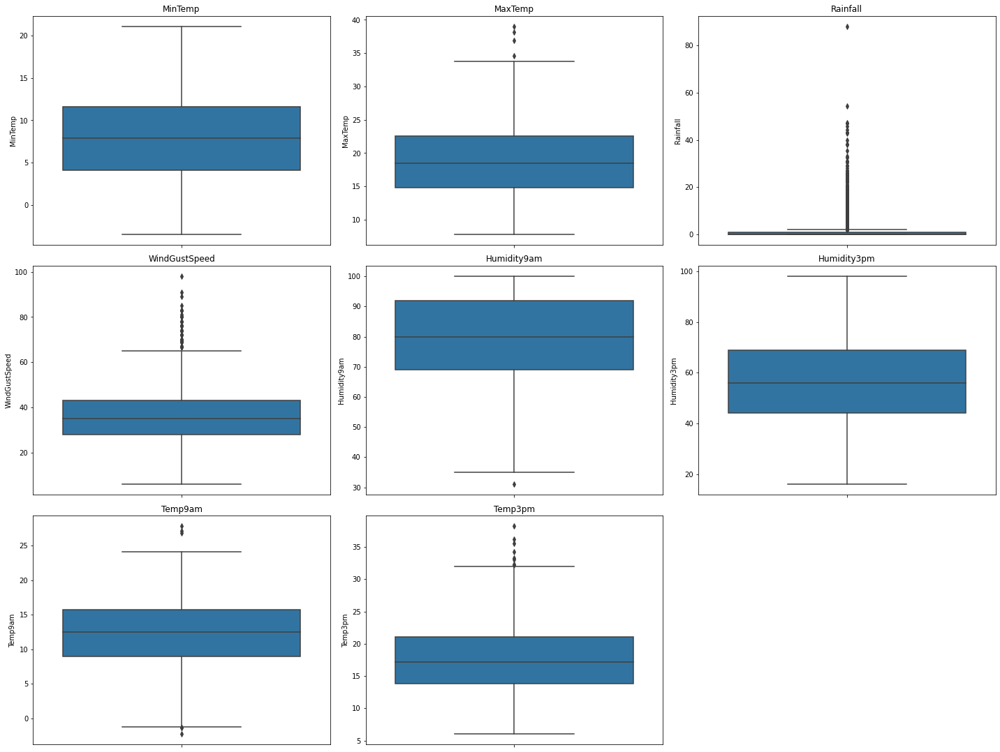

In [552]:
num_cols = 3
num_rows = 4

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature_1):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Launceston_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [553]:
variables = continuous_feature_1.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Launceston_df[variable].quantile(0.75) - Launceston_df[variable].quantile(0.25)
    lower_bridge = Launceston_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Launceston_df[variable].quantile(0.75) + (IQR * 1.5)

    Launceston_df = Launceston_df[(Launceston_df[variable] >= lower_bridge) & (Launceston_df[variable] <= upper_bridge)]

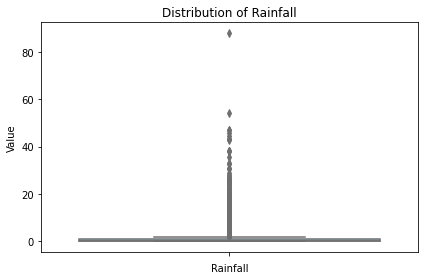

In [554]:
sns.boxplot(data=Launceston_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

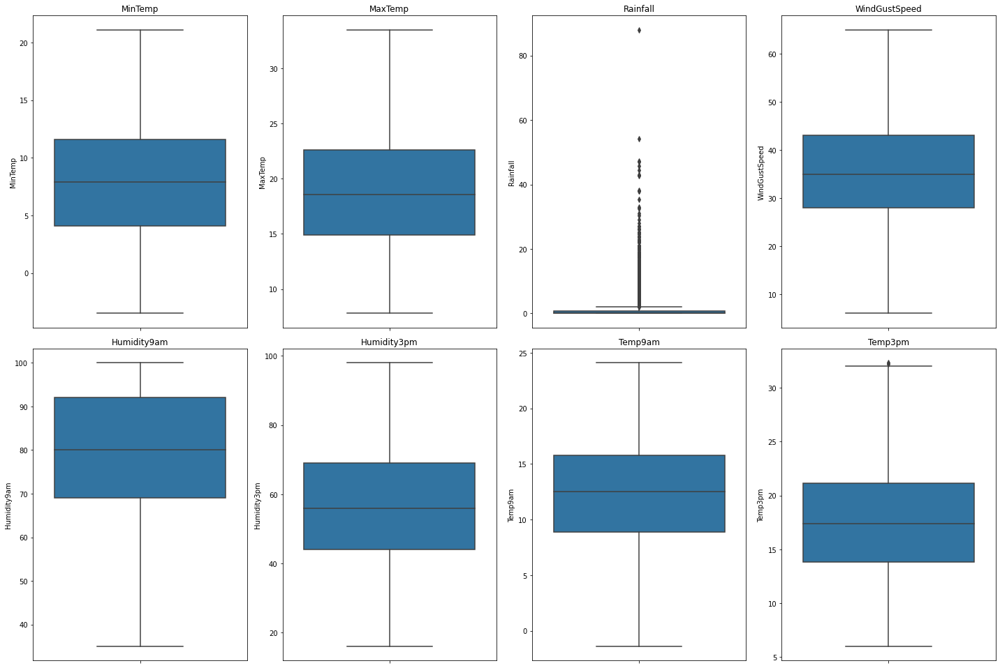

In [556]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature_1):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Launceston_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [557]:
pct_5 = np.percentile(Launceston_df['Rainfall'], 5)
pct_95 = np.percentile(Launceston_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 11.0


In [558]:
Launceston_df['Rainfall'] = np.where(Launceston_df['Rainfall'] > pct_95, pct_95,np.where(Launceston_df['Rainfall'] < pct_5, pct_5, Launceston_df['Rainfall']))

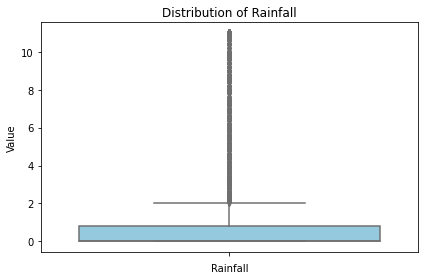

In [559]:
sns.boxplot(data=Launceston_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [560]:
Launceston_df["RainToday"] = pd.get_dummies(Launceston_df["RainToday"], drop_first = True)
Launceston_df["RainTomorrow"] = pd.get_dummies(Launceston_df["RainTomorrow"], drop_first = True)

In [561]:
for feature in categorical_feature_1:
    print(feature, (Launceston_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2008-12-01', '2012-09-19', '2010-08-18', '2010-08-19', '2010-08-22',
       '2010-08-23', '2010-08-24', '2010-08-25', '2012-09-23', '2012-09-21',
       ...
       '2012-02-12', '2012-02-22', '2012-02-14', '2012-02-15', '2012-02-16',
       '2012-02-18', '2012-02-19', '2012-02-20', '2012-02-21', '2017-06-25'],
      dtype='object', name='Date', length=2967)
Location Index(['Launceston'], dtype='object', name='Location')
WindGustDir Index(['NNE', 'NE', 'N', 'NNW', 'SE', 'S', 'ESE', 'SSE', 'WNW', 'NW', 'ENE',
       'W', 'WSW', 'E', 'SW', 'SSW'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['ENE', 'ESE', 'N', 'NNW', 'SSE', 'NW', 'S', 'SE', 'NNE', 'NE', 'WNW',
       'SSW', 'W', 'E', 'WSW', 'SW'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [562]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Launceston_df["WindGustDir"] = Launceston_df["WindGustDir"].map(windgustdir)
Launceston_df["WindDir3pm"] = Launceston_df["WindDir3pm"].map(winddir3pm)

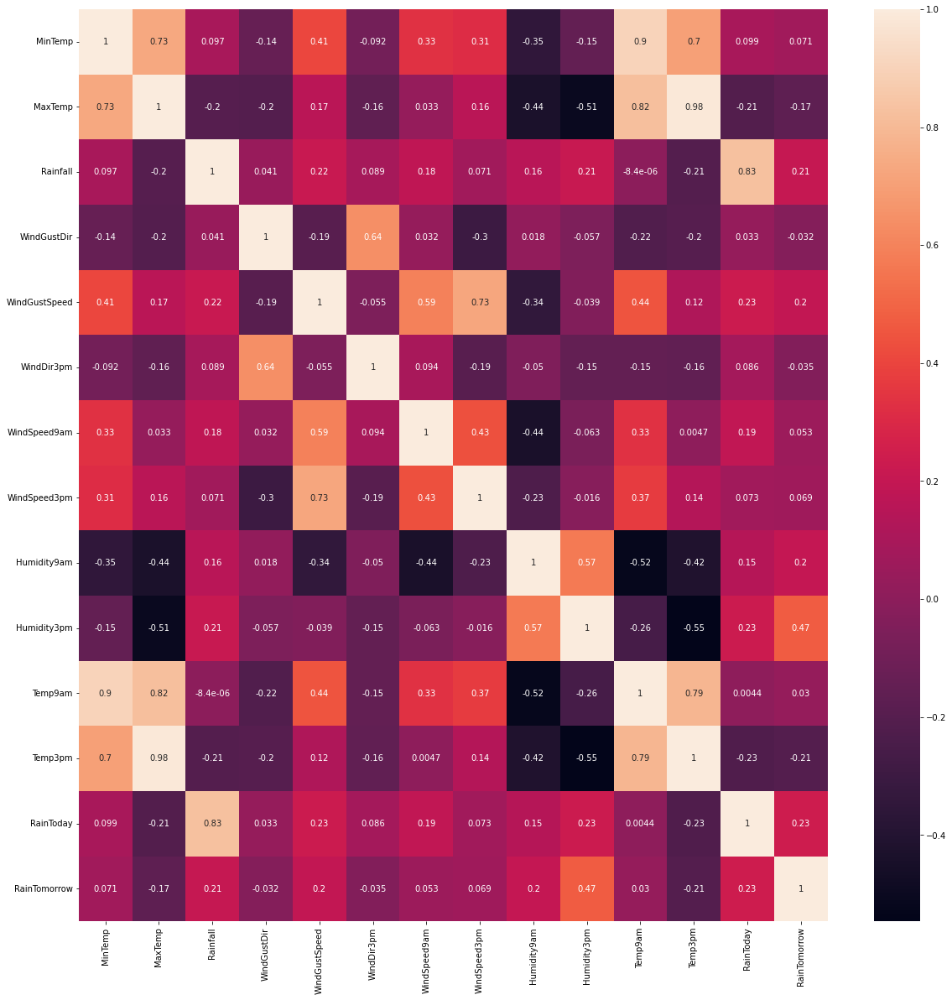

In [563]:
corrmat = Launceston_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [565]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Launceston_df[columns_to_scale] = scaler.fit_transform(Launceston_df[columns_to_scale])

### Model Building

In [566]:
X = Launceston_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Launceston_df['RainTomorrow']

In [567]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [568]:
y_train

136030    0
135064    0
133151    0
135698    0
134928    1
         ..
133714    1
135115    0
135307    0
133498    0
135083    0
Name: RainTomorrow, Length: 2373, dtype: uint8

In [569]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

LogisticRegression(random_state=0)

In [570]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[435  27]
 [ 61  71]]
0.8518518518518519
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       462
           1       0.72      0.54      0.62       132

    accuracy                           0.85       594
   macro avg       0.80      0.74      0.76       594
weighted avg       0.84      0.85      0.84       594



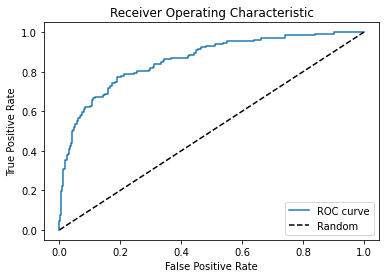

ROC AUC: 0.8595533254624165


In [571]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [572]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [573]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[434  28]
 [ 62  70]]
0.8484848484848485
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       462
           1       0.71      0.53      0.61       132

    accuracy                           0.85       594
   macro avg       0.79      0.73      0.76       594
weighted avg       0.84      0.85      0.84       594



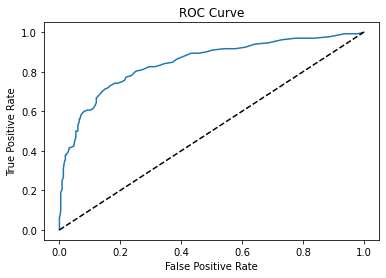

ROC AUC: 0.8460907779089597


In [574]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [575]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [576]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[381  81]
 [ 64  68]]
0.7558922558922558
              precision    recall  f1-score   support

           0       0.86      0.82      0.84       462
           1       0.46      0.52      0.48       132

    accuracy                           0.76       594
   macro avg       0.66      0.67      0.66       594
weighted avg       0.77      0.76      0.76       594



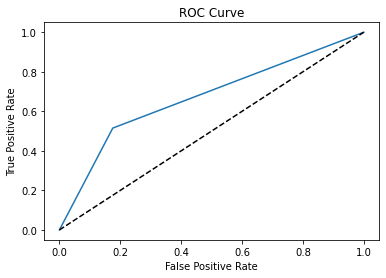

ROC AUC: 0.6699134199134199


In [577]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

### Pearce

In [578]:
Pearce_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
114620,2009-01-01,Pearce,18.8,38.4,0.0,E,50.0,ESE,SE,22.0,13.0,46.0,20.0,1010.4,1007.2,23.1,35.6,No,No
114621,2009-01-02,Pearce,22.0,39.1,0.0,E,52.0,NW,SW,4.0,31.0,38.0,23.0,1008.3,1007.4,27.1,36.0,No,No
114622,2009-01-03,Pearce,15.9,35.6,0.0,NaN,NaN,S,SSW,13.0,28.0,58.0,29.0,1012.1,1010.2,24.0,34.8,No,No
114623,2009-01-04,Pearce,NaN,37.0,0.0,SE,43.0,SE,ESE,24.0,20.0,45.0,19.0,1016.6,1012.6,22.7,35.2,No,No
114624,2009-01-05,Pearce,21.8,38.6,0.0,E,59.0,ESE,SSE,15.0,15.0,35.0,15.0,1014.1,1010.1,26.8,37.3,No,No


In [442]:
Pearce_df.isnull().sum()*100/len(Pearce_df)

Date             0.000000
Location         0.000000
MinTemp          0.731140
MaxTemp          0.697906
Rainfall         8.208707
WindGustDir      4.818877
WindGustSpeed    4.818877
WindDir9am       3.024261
WindDir3pm       0.897308
WindSpeed9am     0.664673
WindSpeed3pm     0.864074
Humidity9am      0.664673
Humidity3pm      0.897308
Pressure9am      0.697906
Pressure3pm      0.930542
Temp9am          0.598205
Temp3pm          0.864074
RainToday        8.208707
RainTomorrow     8.208707
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/4131088081.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Pearce_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/4131088081.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Pearce_df[feature], ax=axes[i])
C:\Use

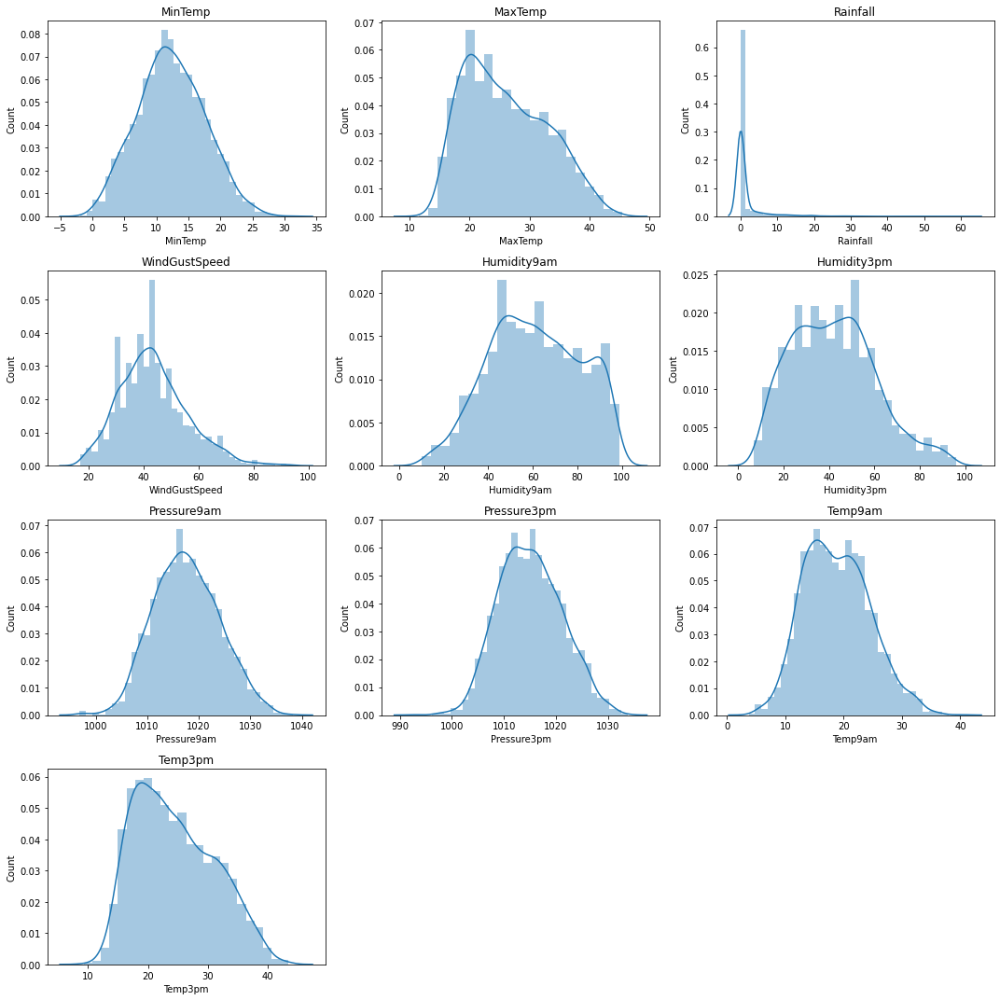

In [443]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Pearce_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [444]:
for var in continuous_feature:
            if Pearce_df[var].isnull().sum()*100/len(df) > 0:
                   Pearce_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [445]:
for var in categorical_feature:
    Pearce_df[var].fillna(Pearce_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [446]:
for var in discrete_feature:
    Pearce_df[var].fillna(Pearce_df[var].mode().iloc[0], inplace=True)
    

In [447]:
Pearce_df.isnull().sum()*100/len(Pearce_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [448]:
Pearce_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3009.0,12.323563,5.229240,-1.9,8.7,12.2,15.9,31.2
MaxTemp,3009.0,26.018079,6.853634,11.6,20.4,25.1,31.4,45.4
Rainfall,3009.0,1.532070,5.060999,0.0,0.0,0.0,0.0,62.4
WindGustSpeed,3009.0,43.552011,11.956177,17.0,35.0,43.0,50.0,94.0
WindSpeed9am,3009.0,16.008973,8.449607,0.0,9.0,15.0,22.0,52.0
WindSpeed3pm,3009.0,20.294782,7.821681,0.0,15.0,20.0,26.0,65.0
Humidity9am,3009.0,60.884347,20.204455,10.0,46.0,60.0,77.0,99.0
Humidity3pm,3009.0,42.320705,18.521619,7.0,28.0,42.0,55.0,96.0
Pressure9am,3009.0,1017.640944,6.325692,996.9,1013.1,1017.4,1022.0,1038.2
Pressure3pm,3009.0,1015.108209,6.059255,992.6,1010.7,1014.9,1019.3,1033.8


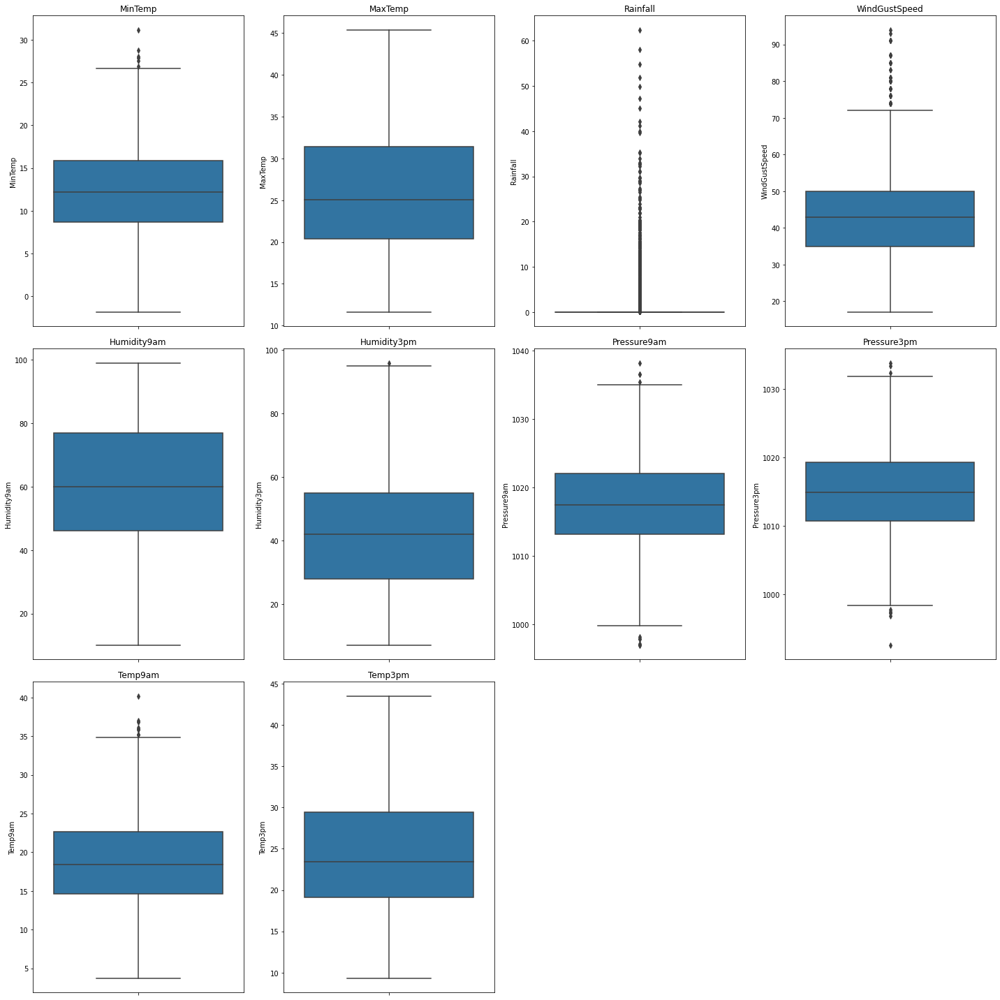

In [449]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Pearce_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [450]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Pearce_df[variable].quantile(0.75) - Pearce_df[variable].quantile(0.25)
    lower_bridge = Pearce_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Pearce_df[variable].quantile(0.75) + (IQR * 1.5)

    Pearce_df = Pearce_df[(Pearce_df[variable] >= lower_bridge) & (Pearce_df[variable] <= upper_bridge)]

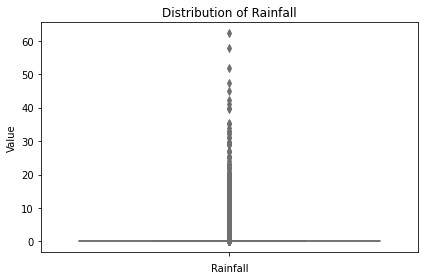

In [451]:
sns.boxplot(data=Pearce_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

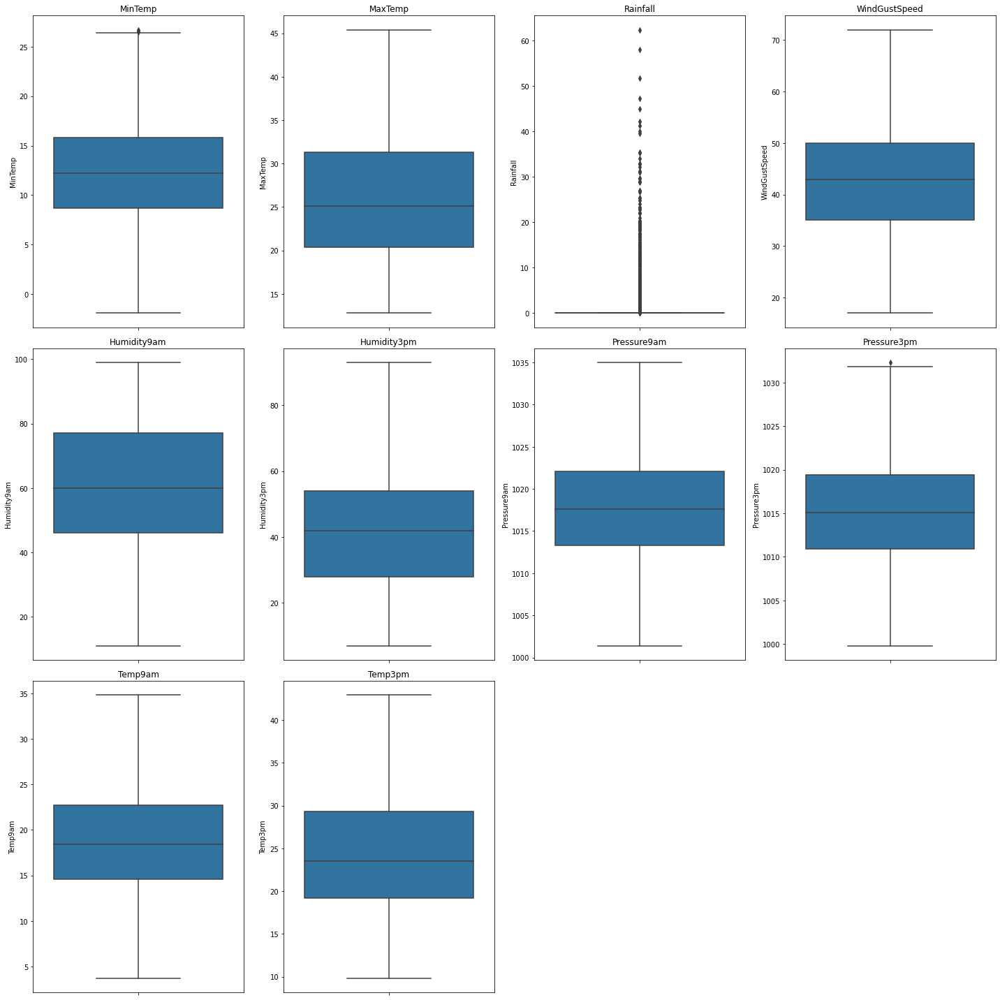

In [452]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Pearce_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [453]:
pct_5 = np.percentile(Pearce_df['Rainfall'], 5)
pct_95 = np.percentile(Pearce_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 9.6


In [454]:
Pearce_df['Rainfall'] = np.where(Pearce_df['Rainfall'] > pct_95, pct_95,np.where(Pearce_df['Rainfall'] < pct_5, pct_5, Pearce_df['Rainfall']))

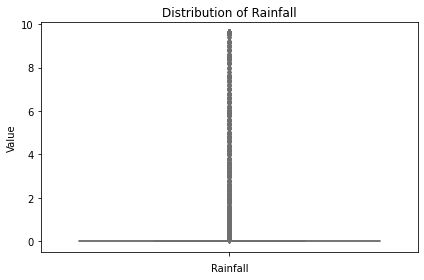

In [455]:
sns.boxplot(data=Pearce_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [456]:
Pearce_df["RainToday"] = pd.get_dummies(Pearce_df["RainToday"], drop_first = True)
Pearce_df["RainTomorrow"] = pd.get_dummies(Pearce_df["RainTomorrow"], drop_first = True)

In [457]:
for feature in categorical_feature_1:
    print(feature, (Pearce_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-05-19', '2012-08-01', '2010-05-23', '2016-04-09', '2010-05-26',
       '2010-05-27', '2012-08-14', '2014-07-06', '2012-08-12', '2012-08-07',
       ...
       '2012-01-06', '2012-01-14', '2012-01-07', '2012-01-08', '2012-01-09',
       '2012-01-10', '2012-01-11', '2012-01-12', '2012-01-13', '2017-06-25'],
      dtype='object', name='Date', length=2933)
Location Index(['Pearce'], dtype='object', name='Location')
WindGustDir Index(['NW', 'WNW', 'NNW', 'W', 'N', 'NNE', 'NE', 'WSW', 'SW', 'ENE', 'S', 'E',
       'SSW', 'SE', 'SSE', 'ESE'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['WNW', 'NNW', 'NW', 'N', 'W', 'NNE', 'WSW', 'SW', 'NE', 'ENE', 'S',
       'SSE', 'SSW', 'SE', 'ESE', 'E'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [458]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
Pearce_df["WindGustDir"] = Pearce_df["WindGustDir"].map(windgustdir)
Pearce_df["WindDir3pm"] = Pearce_df["WindDir3pm"].map(winddir3pm)
Pearce_df["WindDir9am"] = Pearce_df["WindDir9am"].map(winddir3pm)

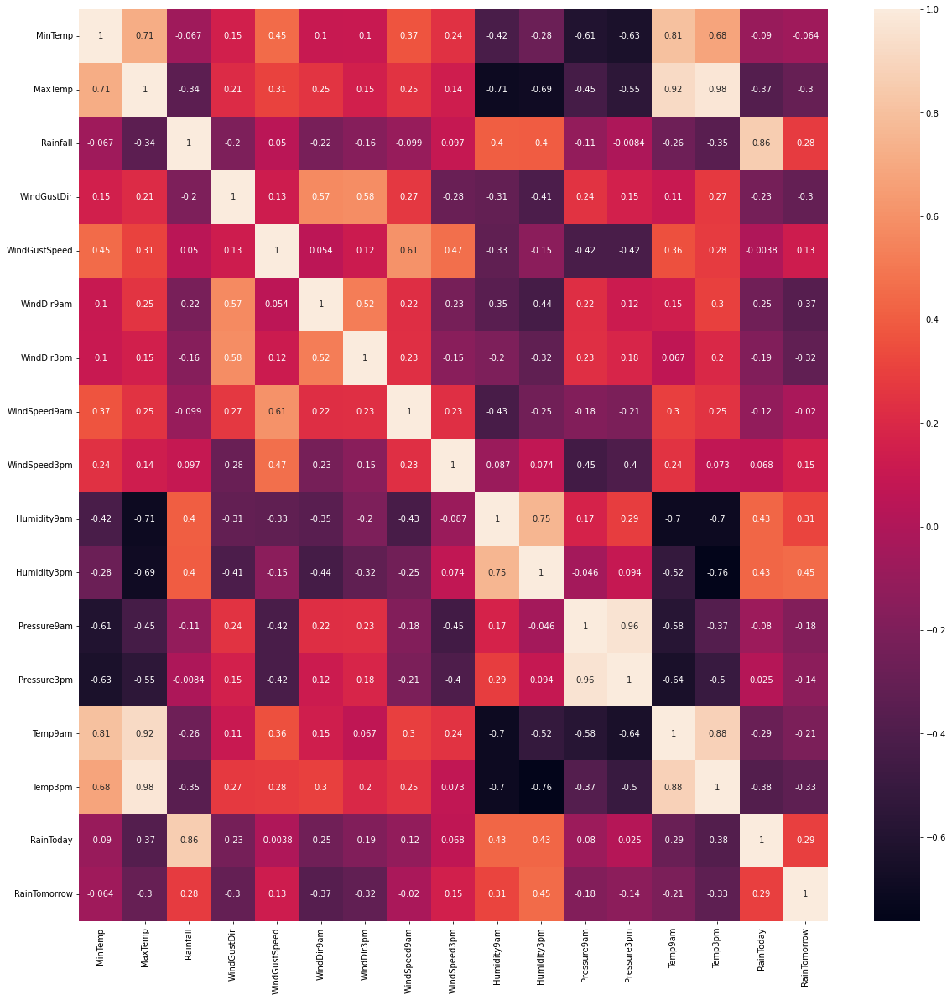

In [459]:
corrmat = Pearce_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [460]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Pearce_df[columns_to_scale] = scaler.fit_transform(Pearce_df[columns_to_scale])

### Model Building

In [461]:
X = Pearce_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Pearce_df['RainTomorrow']

In [462]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [463]:
y_train

114888    0
117523    1
114625    0
117507    0
117192    0
         ..
116812    0
115617    0
117134    0
114853    0
116029    0
Name: RainTomorrow, Length: 2346, dtype: uint8

In [464]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [465]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[468  25]
 [ 44  50]]
0.8824531516183987
              precision    recall  f1-score   support

           0       0.91      0.95      0.93       493
           1       0.67      0.53      0.59        94

    accuracy                           0.88       587
   macro avg       0.79      0.74      0.76       587
weighted avg       0.87      0.88      0.88       587



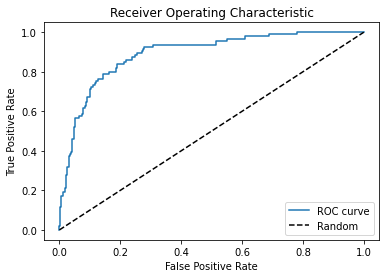

ROC AUC: 0.8907038971127703


In [466]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [467]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [468]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[460  33]
 [ 46  48]]
0.8654173764906303
              precision    recall  f1-score   support

           0       0.91      0.93      0.92       493
           1       0.59      0.51      0.55        94

    accuracy                           0.87       587
   macro avg       0.75      0.72      0.73       587
weighted avg       0.86      0.87      0.86       587



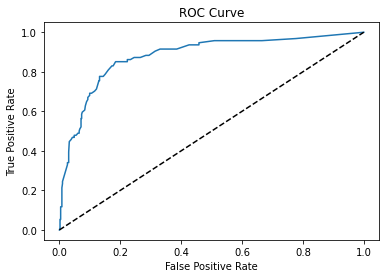

ROC AUC: 0.8802058607742437


In [469]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [470]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [471]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[436  57]
 [ 47  47]]
0.8228279386712095
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       493
           1       0.45      0.50      0.47        94

    accuracy                           0.82       587
   macro avg       0.68      0.69      0.68       587
weighted avg       0.83      0.82      0.83       587



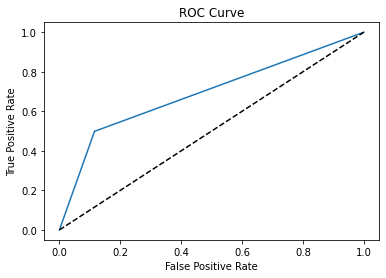

ROC AUC: 0.691683569979716


In [472]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

### Wollongong

In [511]:
Wollongong_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
42547,2008-12-01,Wollongong,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1007.9,1003.3,NaN,NaN,NaN,NaN
42548,2008-12-02,Wollongong,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1010.9,1006.8,NaN,NaN,NaN,NaN
42549,2008-12-03,Wollongong,NaN,27.4,NaN,SSE,70.0,NaN,E,NaN,19.0,NaN,63.0,1007.8,1005.8,NaN,23.9,NaN,No
42550,2008-12-04,Wollongong,15.7,21.5,0.4,NE,39.0,E,ENE,20.0,22.0,67.0,65.0,1020.3,1018.9,18.1,19.5,No,No
42551,2008-12-05,Wollongong,18.0,27.7,0.0,ENE,41.0,NNE,NNE,22.0,19.0,79.0,75.0,1014.3,1009.2,20.1,23.4,No,No


In [512]:
Wollongong_df.isnull().sum()*100/len(Wollongong_df)

Date             0.000000
Location         0.000000
MinTemp          0.493421
MaxTemp          0.361842
Rainfall         1.907895
WindGustDir      1.578947
WindGustSpeed    1.578947
WindDir9am       4.111842
WindDir3pm       1.315789
WindSpeed9am     1.052632
WindSpeed3pm     0.953947
Humidity9am      0.953947
Humidity3pm      0.986842
Pressure9am      1.644737
Pressure3pm      0.625000
Temp9am          0.953947
Temp3pm          0.953947
RainToday        1.907895
RainTomorrow     1.875000
dtype: float64

#### Continuous features

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/1663723394.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Wollongong_df[feature], ax=axes[i])
C:\Users\Lenovo\AppData\Local\Temp/ipykernel_1648/1663723394.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Wollongong_df[feature], ax=axes[i]

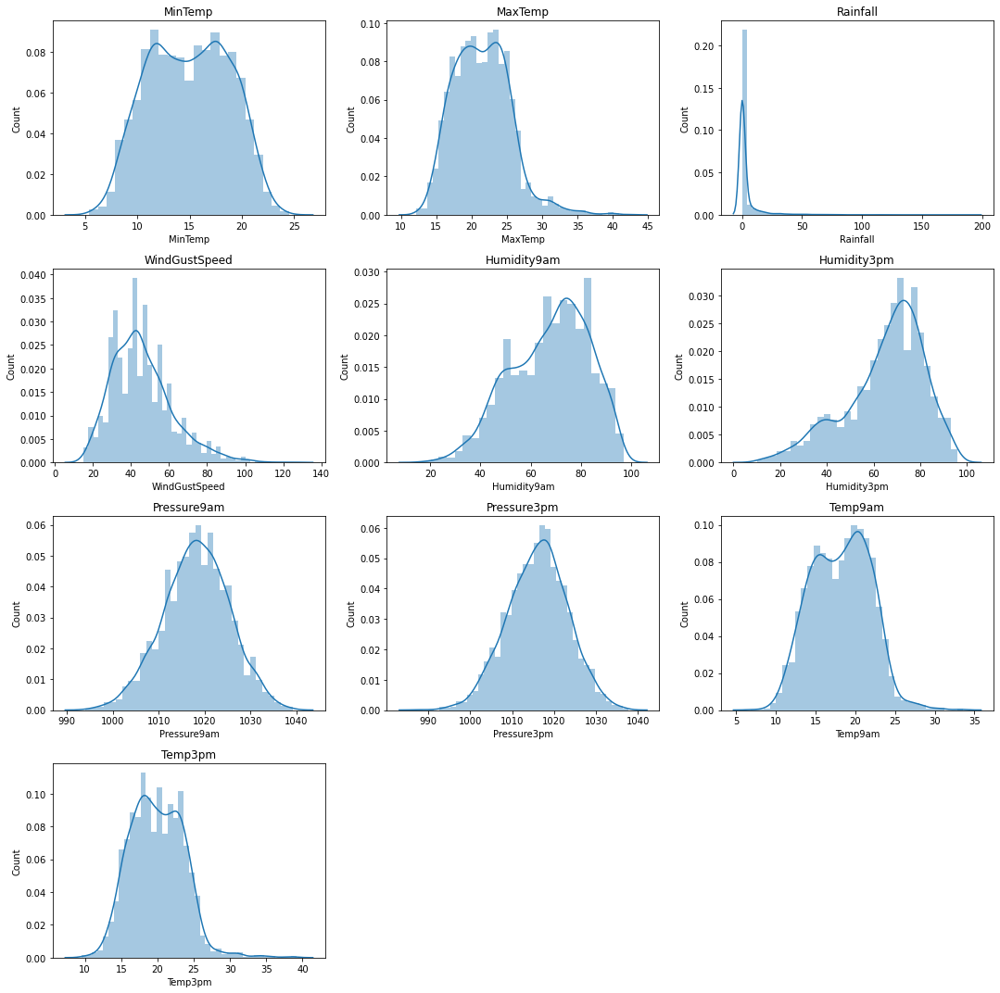

In [513]:
num_rows = 4
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
axes = axes.flatten()

for i, feature in enumerate(continuous_feature):
    sns.distplot(Wollongong_df[feature], ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].set_title(feature)

if len(continuous_feature) < num_rows * num_cols:
    for j in range(len(continuous_feature), num_rows * num_cols):
        fig.delaxes(axes[j])
        
fig.tight_layout()
plt.show()

In [514]:
for var in continuous_feature:
            if Wollongong_df[var].isnull().sum()*100/len(df) > 0:
                   Wollongong_df[var].fillna(df[var].median(), inplace=True)

#### Categorical features

In [515]:
for var in categorical_feature:
    Wollongong_df[var].fillna(Wollongong_df[var].mode().iloc[0], inplace=True)

#### Discrete features

In [516]:
for var in discrete_feature:
    Wollongong_df[var].fillna(Wollongong_df[var].mode().iloc[0], inplace=True) 
    

In [517]:
Wollongong_df.isnull().sum()*100/len(Wollongong_df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [518]:
Wollongong_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,3040.0,14.939770,3.810919,5.4,11.8,15.0,18.0,24.5
MaxTemp,3040.0,21.467566,4.025451,12.2,18.4,21.3,24.1,42.4
Rainfall,3040.0,3.526316,11.793366,0.0,0.0,0.0,0.8,192.0
WindGustSpeed,3040.0,45.648355,15.758367,15.0,35.0,43.0,54.0,126.0
WindSpeed9am,3040.0,16.538158,9.737718,0.0,9.0,15.0,22.0,87.0
WindSpeed3pm,3040.0,21.841118,10.636416,0.0,13.0,20.0,30.0,72.0
Humidity9am,3040.0,67.684211,15.307798,17.0,56.0,70.0,79.0,97.0
Humidity3pm,3040.0,65.166776,16.589288,10.0,56.0,69.0,77.0,96.0
Pressure9am,3040.0,1018.153454,7.171199,994.0,1013.4,1018.4,1023.0,1039.2
Pressure3pm,3040.0,1016.057961,7.184286,987.4,1011.3,1016.4,1020.9,1037.8


### Outlier Handling

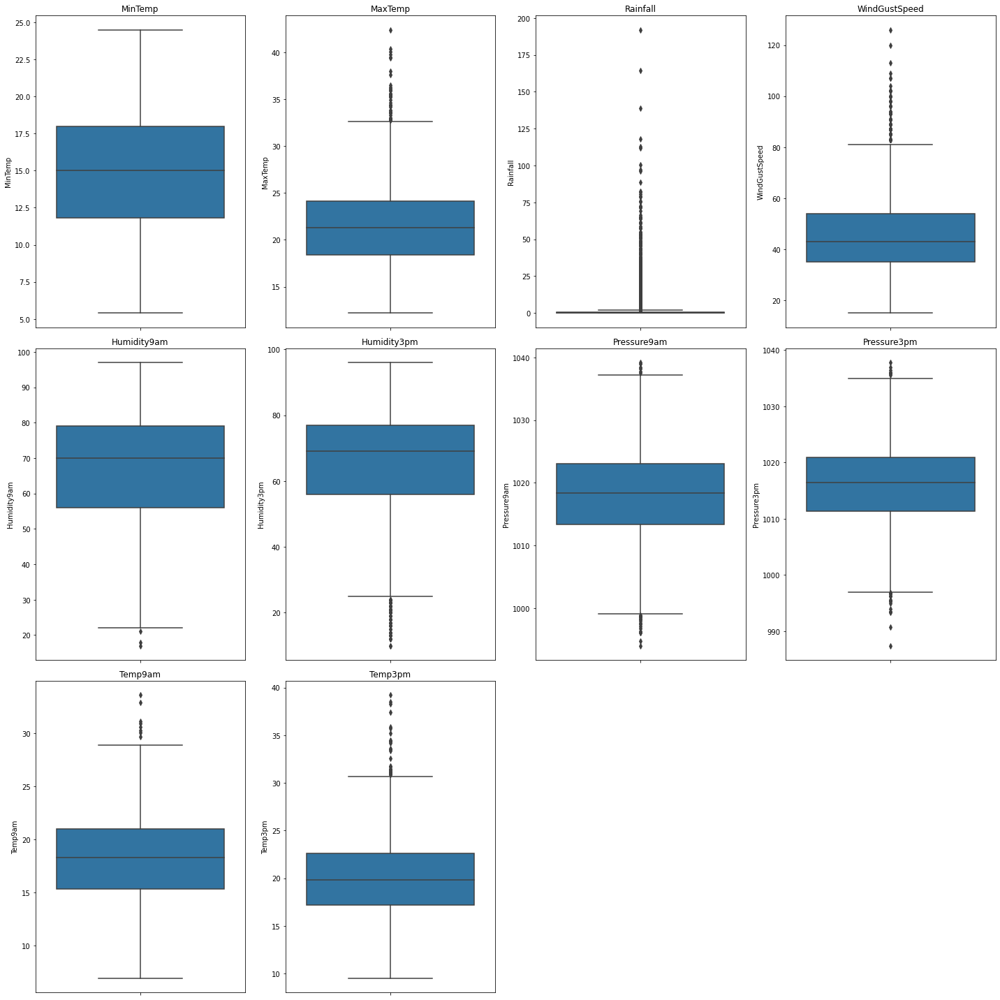

In [519]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Wollongong_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [520]:
variables = continuous_feature.copy()
if 'Rainfall' in variables:
    variables.remove('Rainfall')
    
for variable in variables:
    IQR = Wollongong_df[variable].quantile(0.75) - Wollongong_df[variable].quantile(0.25)
    lower_bridge = Wollongong_df[variable].quantile(0.25) - (IQR * 1.5)
    upper_bridge = Wollongong_df[variable].quantile(0.75) + (IQR * 1.5)

    Wollongong_df = Wollongong_df[(Wollongong_df[variable] >= lower_bridge) & (Wollongong_df[variable] <= upper_bridge)]

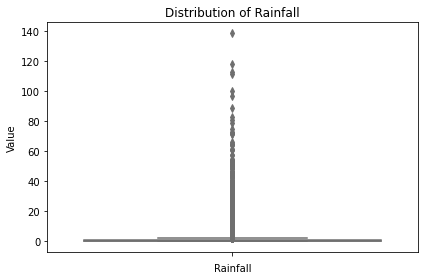

In [521]:
sns.boxplot(data=Wollongong_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

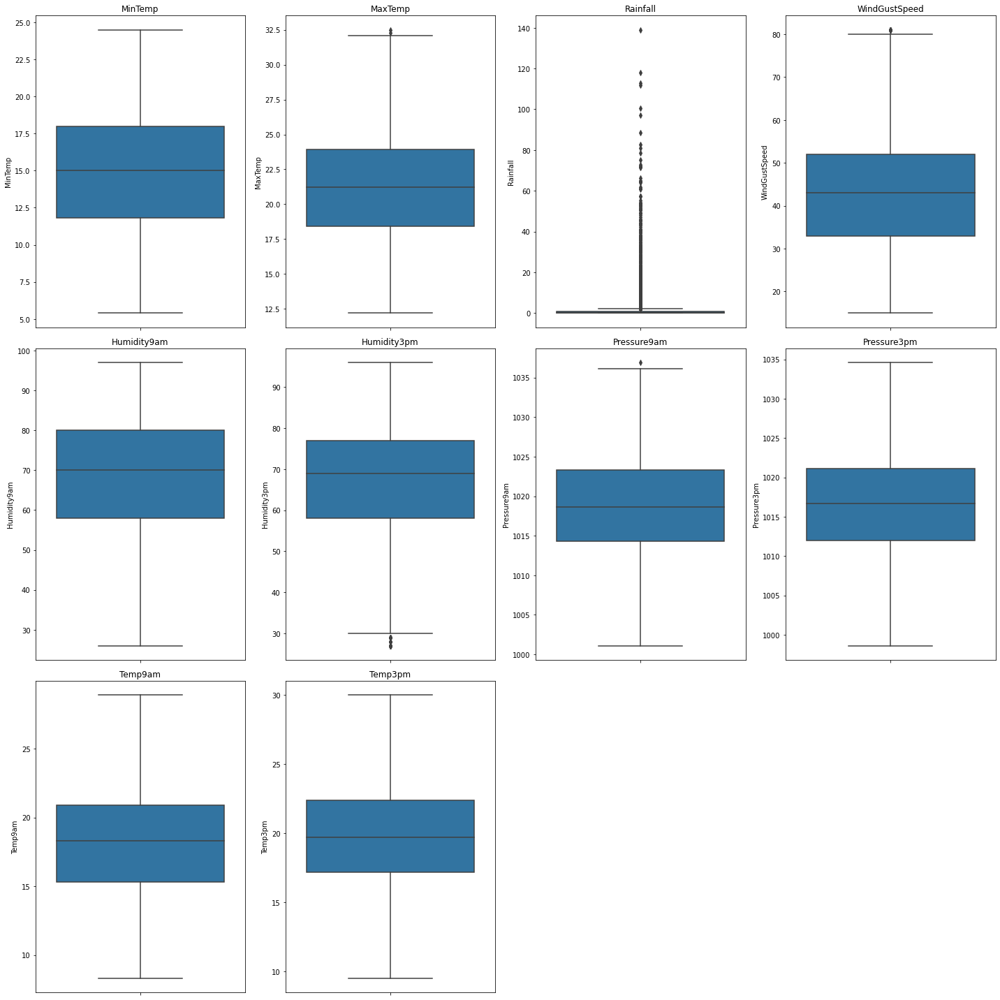

In [522]:
num_cols = 4
num_rows = 3

plt.figure(figsize=(20, 20))
for i, feature in enumerate(continuous_feature):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(data=Wollongong_df, y=feature)
    plt.title(feature)

plt.tight_layout()
plt.show()

In [523]:
pct_5 = np.percentile(Wollongong_df['Rainfall'], 5)
pct_95 = np.percentile(Wollongong_df['Rainfall'], 95)
print(pct_5, pct_95)

0.0 18.8


In [524]:
Wollongong_df['Rainfall'] = np.where(Wollongong_df['Rainfall'] > pct_95, pct_95,np.where(Wollongong_df['Rainfall'] < pct_5, pct_5, Wollongong_df['Rainfall']))

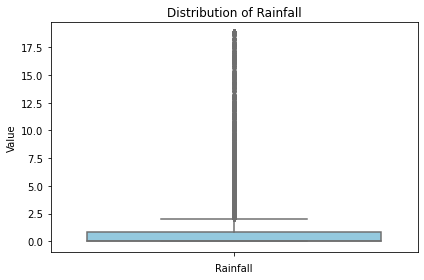

In [525]:
sns.boxplot(data=Wollongong_df, y='Rainfall', showfliers=True, color='skyblue')
plt.xlabel('Rainfall')
plt.ylabel('Value')
plt.title('Distribution of Rainfall')

plt.tight_layout()
plt.show()

### Feature Engineering

In [526]:
Wollongong_df["RainToday"] = pd.get_dummies(Wollongong_df["RainToday"], drop_first = True)
Wollongong_df["RainTomorrow"] = pd.get_dummies(Wollongong_df["RainTomorrow"], drop_first = True)

In [527]:
for feature in categorical_feature_1:
    print(feature, (Wollongong_df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2013-11-15', '2010-11-02', '2010-10-18', '2014-10-20', '2016-01-06',
       '2010-10-23', '2010-10-24', '2016-01-05', '2016-01-04', '2010-10-27',
       ...
       '2012-03-18', '2012-03-19', '2012-03-20', '2012-03-21', '2012-03-23',
       '2012-03-24', '2012-03-25', '2012-03-26', '2012-03-27', '2017-06-25'],
      dtype='object', name='Date', length=2825)
Location Index(['Wollongong'], dtype='object', name='Location')
WindGustDir Index(['E', 'SE', 'ESE', 'S', 'SSW', 'ENE', 'SSE', 'NNW', 'N', 'SW', 'NNE',
       'WNW', 'NW', 'NE', 'WSW', 'W'],
      dtype='object', name='WindGustDir')
WindDir3pm Index(['SW', 'SSW', 'S', 'ESE', 'SSE', 'SE', 'E', 'NNW', 'N', 'NNE', 'NW',
       'WSW', 'ENE', 'W', 'NE', 'WNW'],
      dtype='object', name='WindDir3pm')
RainToday UInt64Index([1, 0], dtype='uint64', name='RainToday')
RainTomorrow UInt64Index([1, 0], dtype='uint64', name='RainTomorrow')


In [528]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
winddir9am = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
Wollongong_df["WindGustDir"] = Wollongong_df["WindGustDir"].map(windgustdir)
Wollongong_df["WindDir3pm"] = Wollongong_df["WindDir3pm"].map(winddir3pm)
Wollongong_df["WindDir9am"] = Wollongong_df["WindDir9am"].map(winddir3pm)

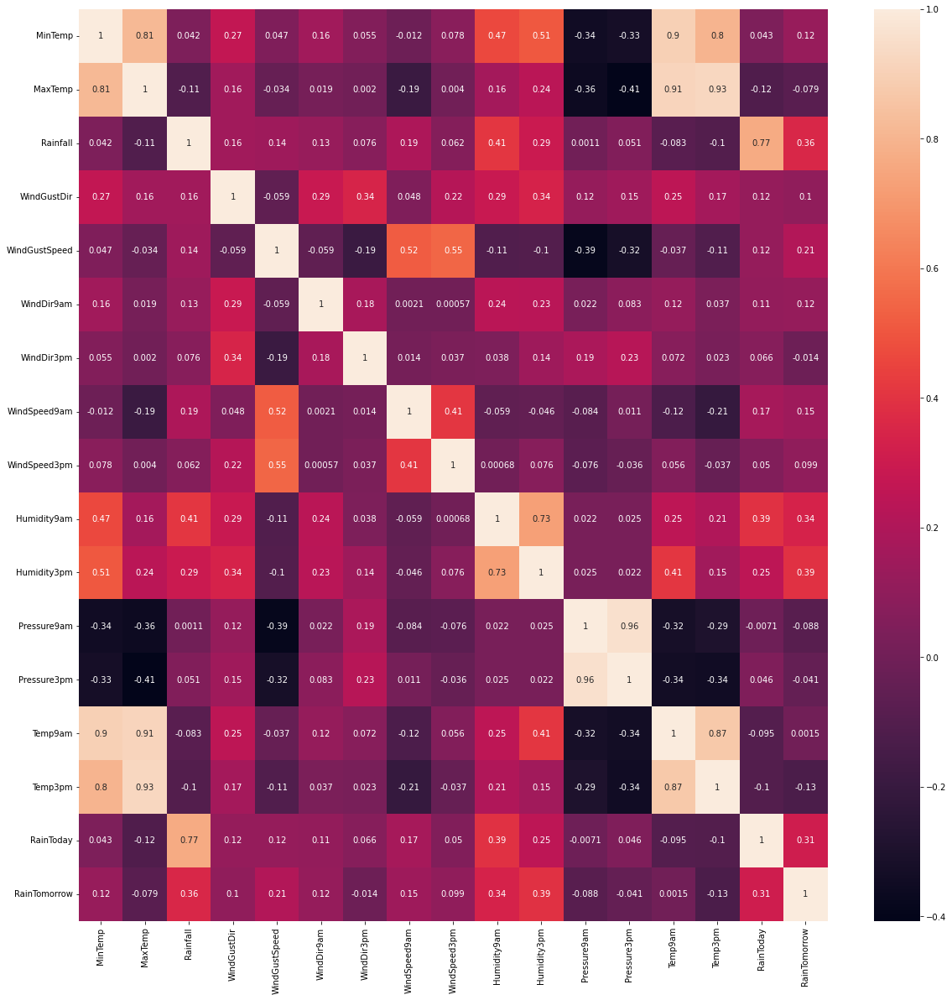

In [529]:
corrmat = Wollongong_df.corr()
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

### Feature Scaling

In [530]:
from sklearn.preprocessing import StandardScaler

columns_to_scale = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
                    'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
scaler = StandardScaler()
Wollongong_df[columns_to_scale] = scaler.fit_transform(Wollongong_df[columns_to_scale])

### Model Building

In [531]:
X = Wollongong_df.drop(['RainTomorrow', 'Date', 'Location'], axis=1)
Y = Wollongong_df['RainTomorrow']

In [532]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size =0.2, stratify = Y, random_state = 0)

In [533]:
y_train

45111    0
43551    1
44951    0
43360    0
42662    1
        ..
45309    0
44043    1
42994    0
43923    0
45062    0
Name: RainTomorrow, Length: 2260, dtype: uint8

In [534]:
from sklearn.linear_model import LogisticRegression  

lr = LogisticRegression(random_state=0)  
lr.fit(X_train, y_train)  

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [535]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
y_pred2 = lr.predict(X_test)
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[401  30]
 [ 70  64]]
0.8230088495575221
              precision    recall  f1-score   support

           0       0.85      0.93      0.89       431
           1       0.68      0.48      0.56       134

    accuracy                           0.82       565
   macro avg       0.77      0.70      0.73       565
weighted avg       0.81      0.82      0.81       565



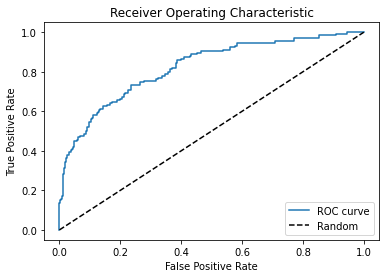

ROC AUC: 0.8225750597361223


In [536]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = lr.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)


plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [537]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [538]:
y_pred1 = rf.predict(X_test)
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[400  31]
 [ 69  65]]
0.8230088495575221
              precision    recall  f1-score   support

           0       0.85      0.93      0.89       431
           1       0.68      0.49      0.57       134

    accuracy                           0.82       565
   macro avg       0.76      0.71      0.73       565
weighted avg       0.81      0.82      0.81       565



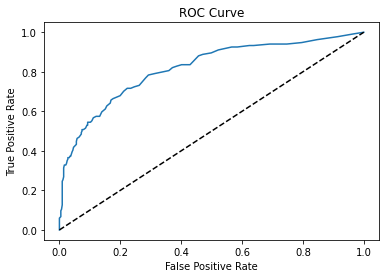

ROC AUC: 0.816497558610659


In [539]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)

In [540]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [541]:
y_pred = dt.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[351  80]
 [ 62  72]]
0.7486725663716814
              precision    recall  f1-score   support

           0       0.85      0.81      0.83       431
           1       0.47      0.54      0.50       134

    accuracy                           0.75       565
   macro avg       0.66      0.68      0.67       565
weighted avg       0.76      0.75      0.75       565



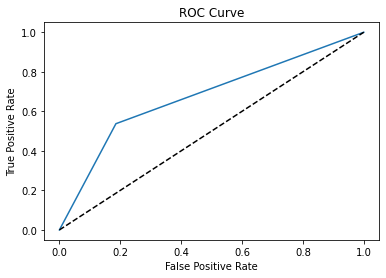

ROC AUC: 0.6758492918239429


In [542]:
y_pred_proba = dt.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC:', roc_auc)